# Clustering techniques evaluation

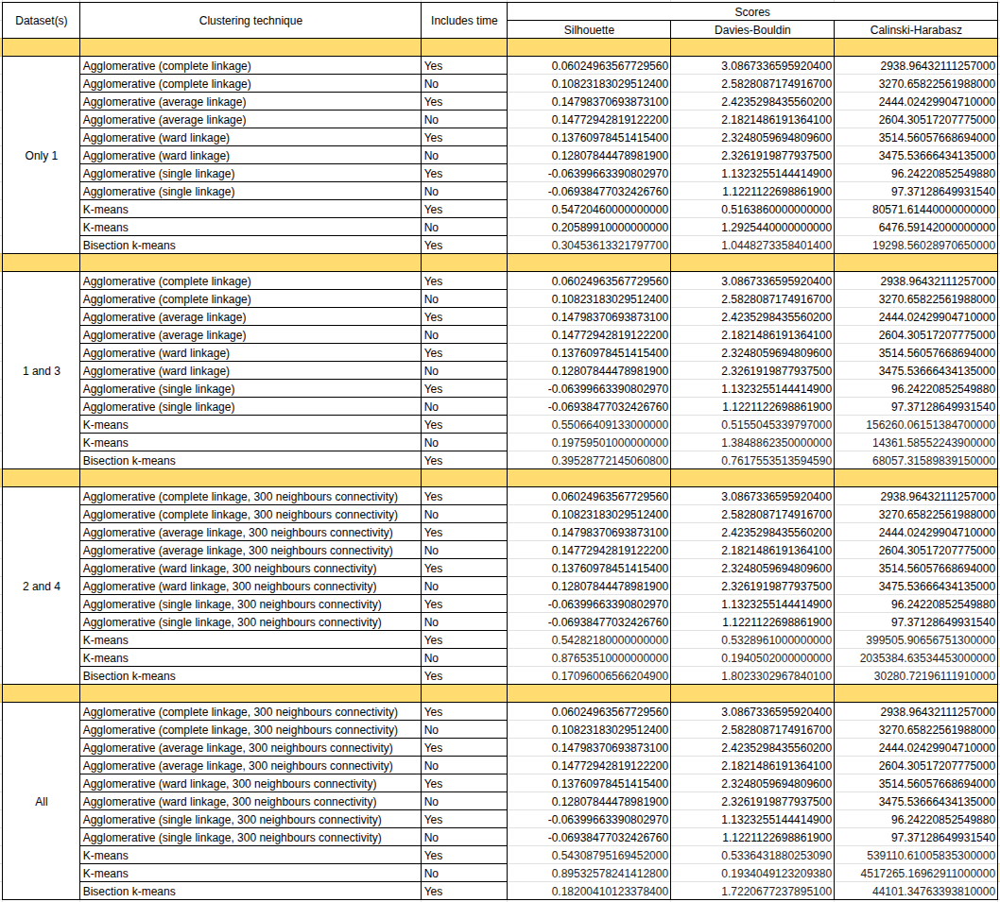

In [6]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import sklearn as sk

In [8]:
df1_cluster_T = pd.read_pickle('df_cluster_T.pkl')
df13_cluster_T = pd.read_pickle('df13_cluster_T.pkl')
df24_cluster_T = pd.read_pickle('df24_cluster_T.pkl')
df_all_cluster_T = pd.read_pickle('df_all_cluster_T.pkl')

## *DATA SET 1*

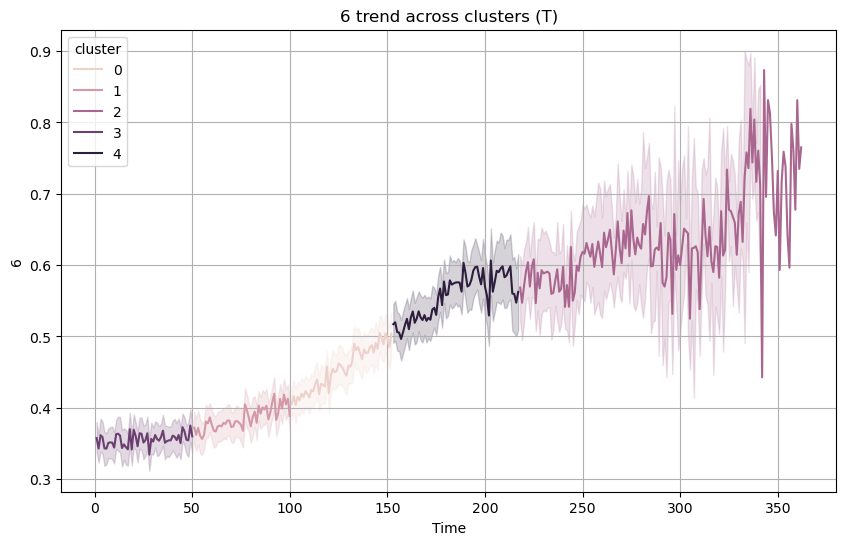

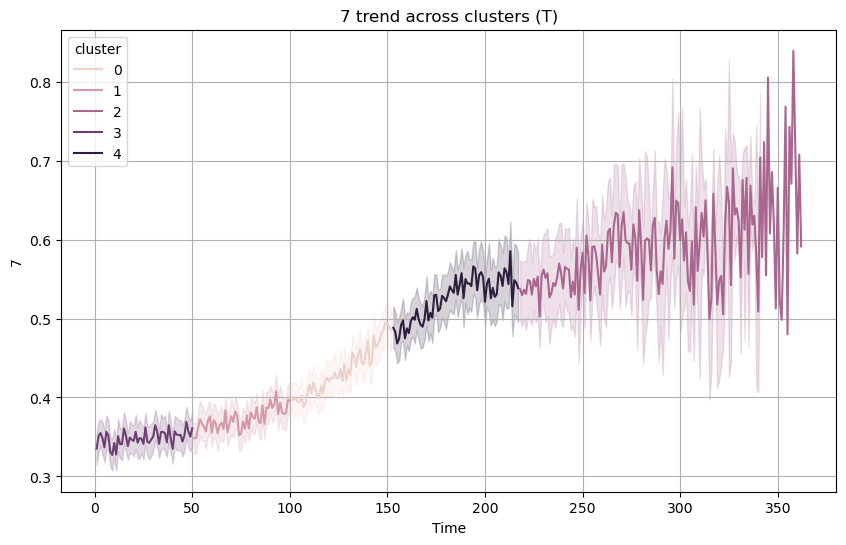

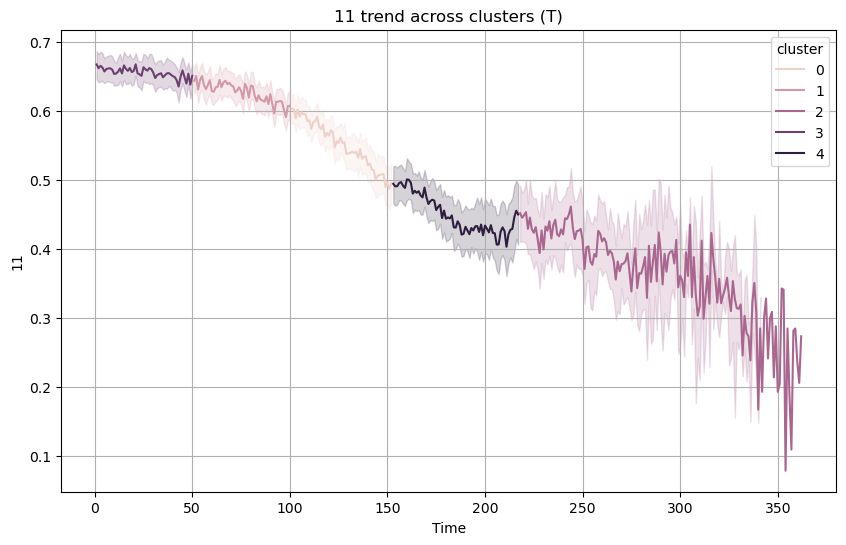

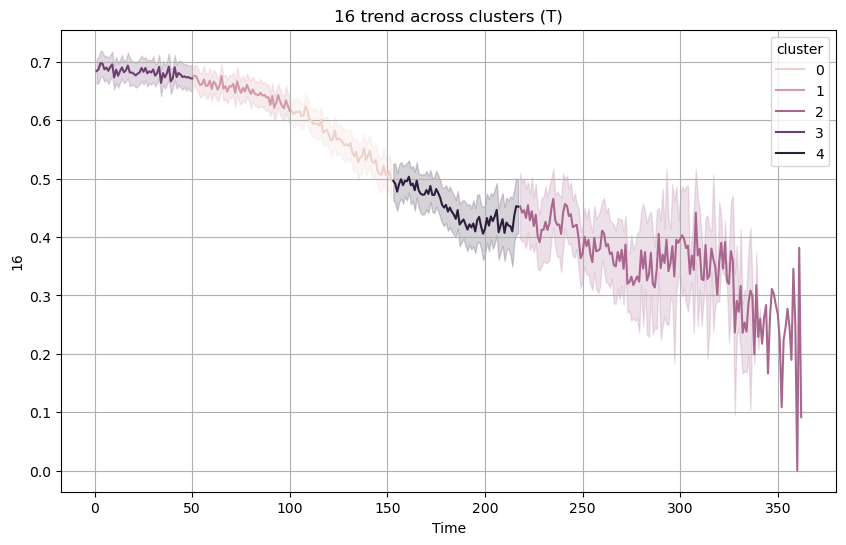

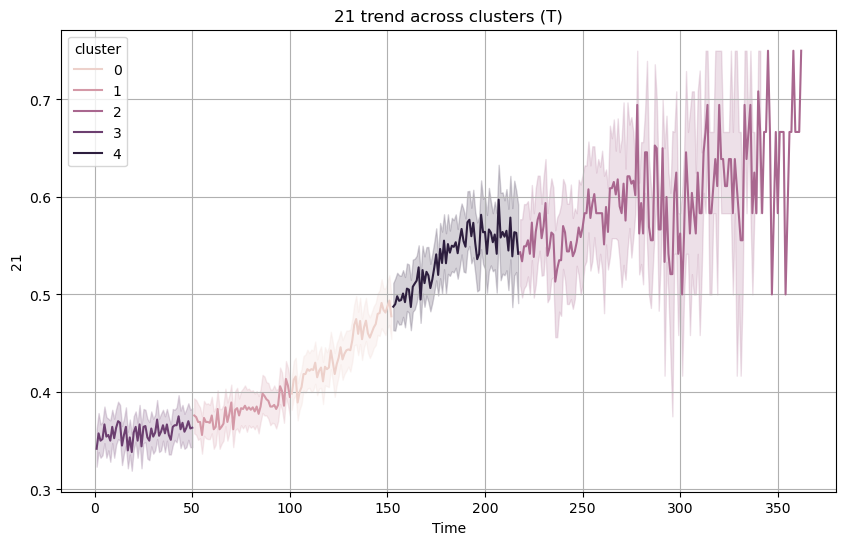

In [9]:
sensors = [6, 7, 11, 16, 21]
for sensor in sensors:
  plt.figure(figsize=(10, 6))
  #it takes all the points from cluster "k", finds the mean value of sensor "s" at time "t" and maps it. it does this for all t values in cluster
  #the translucent region is the confidence interval for mean
  sns.lineplot(data=df1_cluster_T, x=1, y=sensor, hue='cluster')
  plt.title(f'{sensor} trend across clusters (T)')
  plt.xlabel("Time")
  plt.grid(True)
  plt.show()
  '''
  CLUSTER STAGE
    0      2
    1      1
    2      4
    3      0
    4      3
  '''

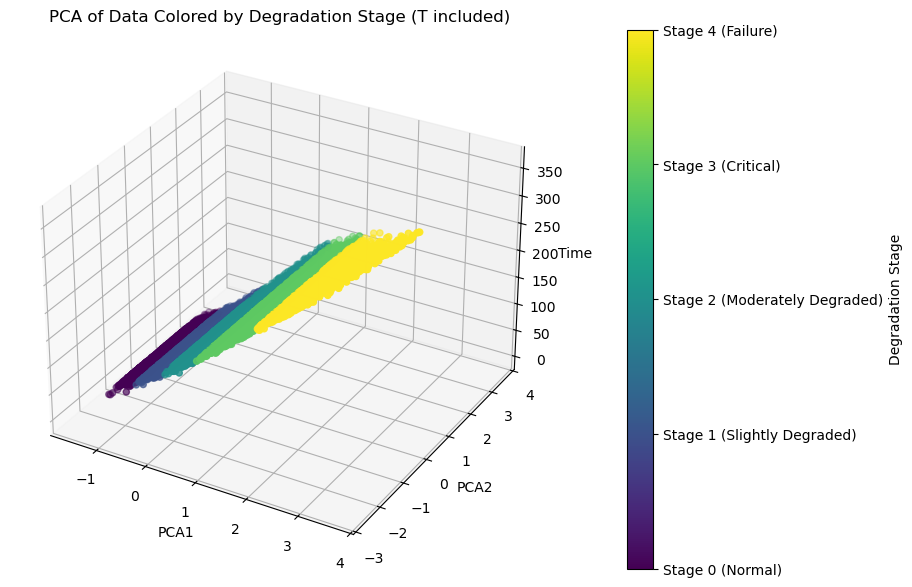

In [10]:
sensor_cols_T = [col for col in df1_cluster_T.columns if col not in [0,'cluster']]
X_T = df1_cluster_T[sensor_cols_T].values
pcat = sk.decomposition.PCA(n_components=2)
X_pca_T = pcat.fit_transform(X_T)


df1_pca_T= df1_cluster_T.copy()
df1_pca_T['PCA1'] = X_pca_T[:, 0]
df1_pca_T['PCA2'] = X_pca_T[:, 1]

# Adjusting cluster names to be assoicated with stages of degradation
cluster_to_stage_T = {
    0: 2,
    1: 1,
    2: 4,
    3: 0,
    4: 3
}
stage_names = {
    0: "Stage 0 (Normal)",
    1: "Stage 1 (Slightly Degraded)",
    2: "Stage 2 (Moderately Degraded)",
    3: "Stage 3 (Critical)",
    4: "Stage 4 (Failure)"
}

# creating a column that associates each sample with its stage
df1_pca_T['stage'] = df1_pca_T['cluster'].map(cluster_to_stage_T)

#plotting
df1_plot_T = df1_pca_T.copy()
scaler = sk.preprocessing.StandardScaler()
df1_plot_T[['PCA1', 'PCA2']] = scaler.fit_transform(df1_plot_T[['PCA1', 'PCA2']])
fig= plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df1_plot_T['PCA1'], df1_plot_T['PCA2'], df1_plot_T[1], c=df1_plot_T['stage'], cmap='viridis', marker='o')
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('Time')
ax.set_title("PCA of Data Colored by Degradation Stage (T included)")
# adding a colorbar with the stage names
cbar = fig.colorbar(scatter, ax=ax, pad=0.1, ticks=range(5))
cbar.ax.set_yticklabels([stage_names[i] for i in range(5)])
cbar.set_label("Degradation Stage")
plt.show()

## *DATA SET 1 AND 3*

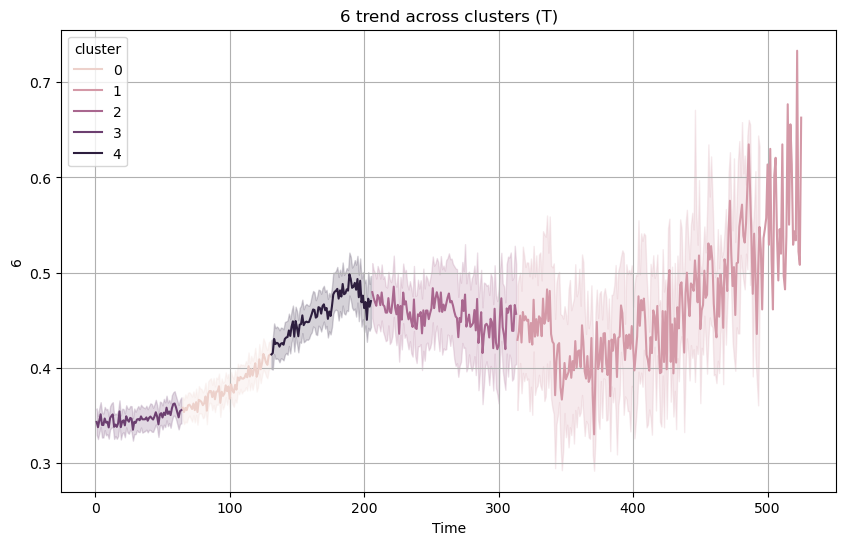

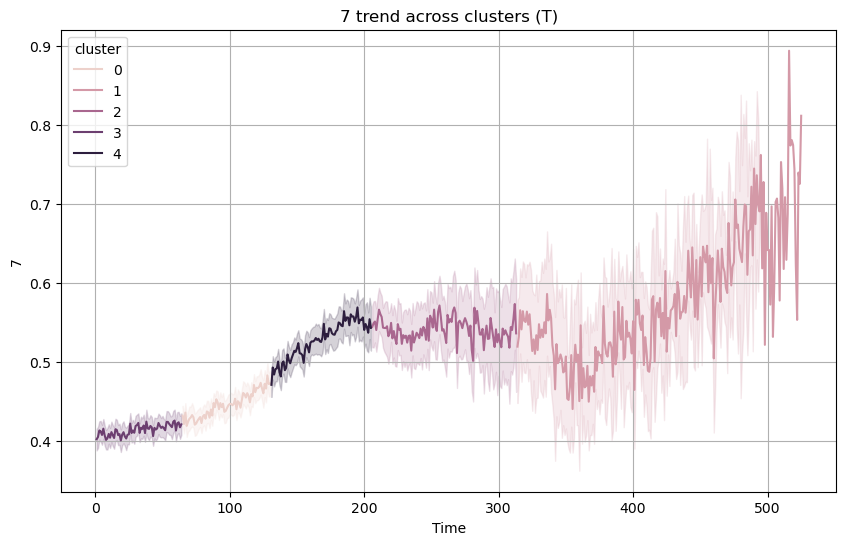

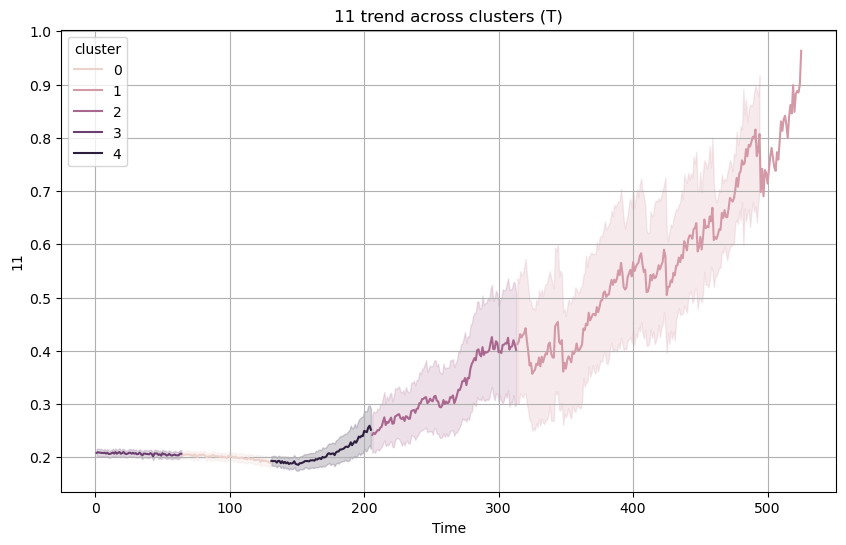

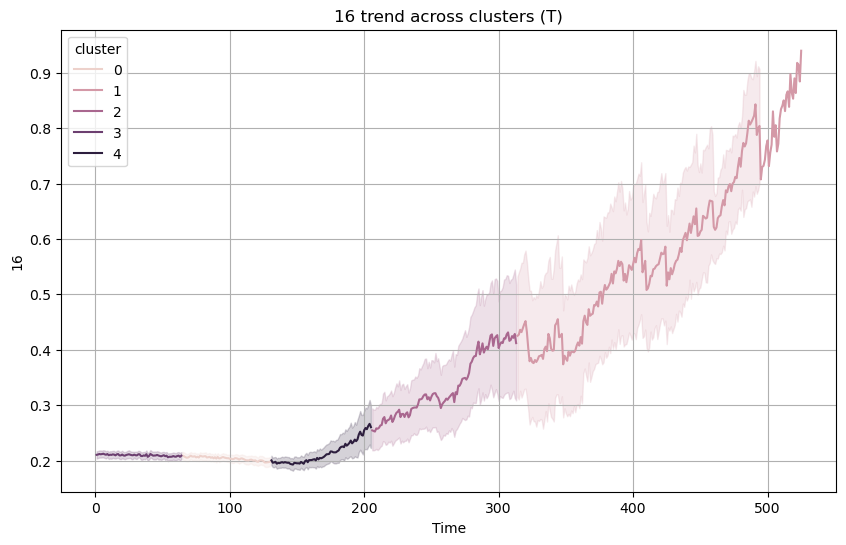

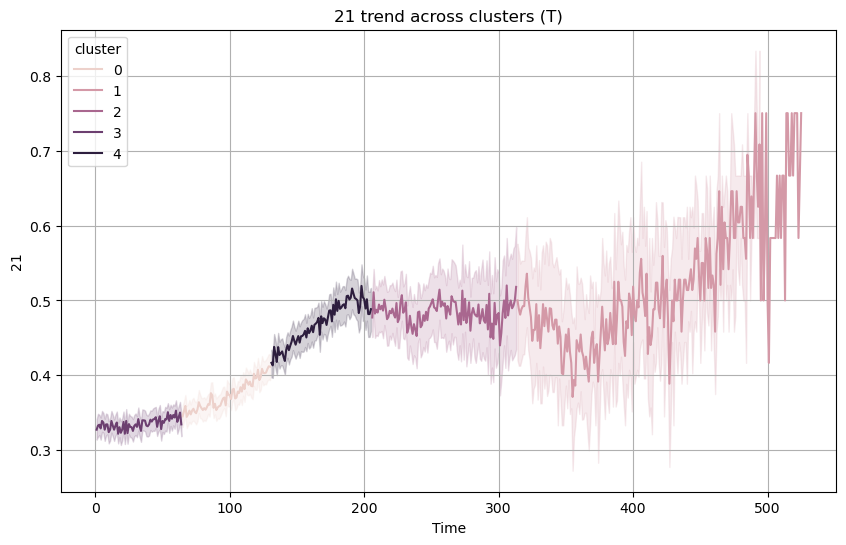

In [11]:
sensors = [6, 7, 11, 16, 21]
for sensor in sensors:
  plt.figure(figsize=(10, 6))
  sns.lineplot(data=df13_cluster_T, x=1, y=sensor, hue='cluster')
  plt.title(f'{sensor} trend across clusters (T)')
  plt.xlabel("Time")
  plt.grid(True)
  plt.show()
  '''
  CLUSTER STAGE
    0     1
    1     4
    2     3
    3     0
    4     2
  '''

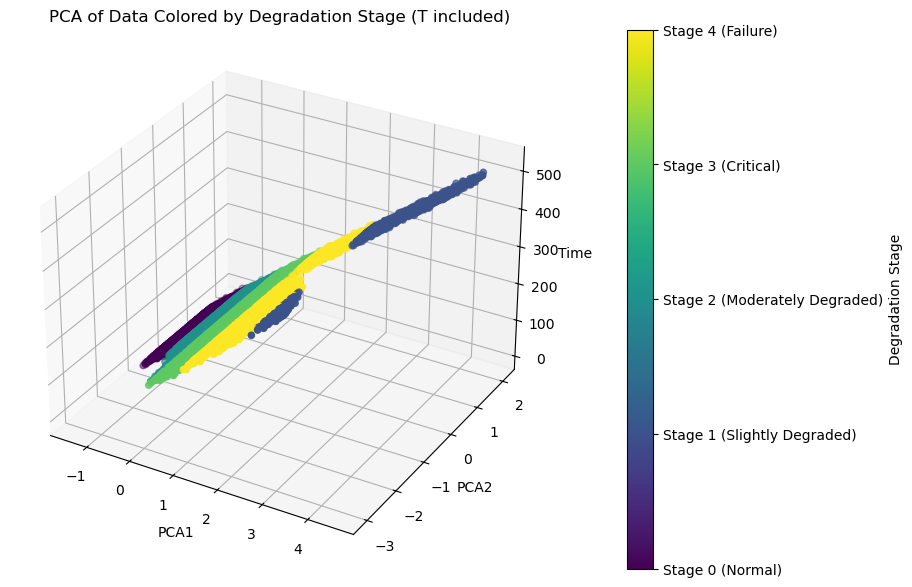

In [12]:
sensor_cols_T13 = [col for col in df13_cluster_T.columns if col not in [0,'cluster']]
X_T13 = df13_cluster_T[sensor_cols_T13].values
pcat = sk.decomposition.PCA(n_components=2)
X_pca_T13 = pcat.fit_transform(X_T13)


df13_pca_T= df13_cluster_T.copy()
df13_pca_T['PCA1'] = X_pca_T13[:, 0]
df13_pca_T['PCA2'] = X_pca_T13[:, 1]

# Adjusting cluster names to be assoicated with stages of degradation
cluster_to_stage_T = {
    0: 2,
    1: 1,
    2: 4,
    3: 0,
    4: 3
}
stage_names = {
    0: "Stage 0 (Normal)",
    1: "Stage 1 (Slightly Degraded)",
    2: "Stage 2 (Moderately Degraded)",
    3: "Stage 3 (Critical)",
    4: "Stage 4 (Failure)"
}

# creating a column that associates each sample with its stage
df13_pca_T['stage'] = df13_pca_T['cluster'].map(cluster_to_stage_T)

#plotting
df13_plot_T = df13_pca_T.copy()
scaler = sk.preprocessing.StandardScaler()
df13_plot_T[['PCA1', 'PCA2']] = scaler.fit_transform(df13_plot_T[['PCA1', 'PCA2']])
fig= plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df13_plot_T['PCA1'], df13_plot_T['PCA2'], df13_plot_T[1], c=df13_plot_T['stage'], cmap='viridis', marker='o')
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('Time')
ax.set_title("PCA of Data Colored by Degradation Stage (T included)")
# adding a colorbar with the stage names
cbar = fig.colorbar(scatter, ax=ax, pad=0.1, ticks=range(5))
cbar.ax.set_yticklabels([stage_names[i] for i in range(5)])
cbar.set_label("Degradation Stage")
plt.show()

## *DATASETS 2 AND 4*

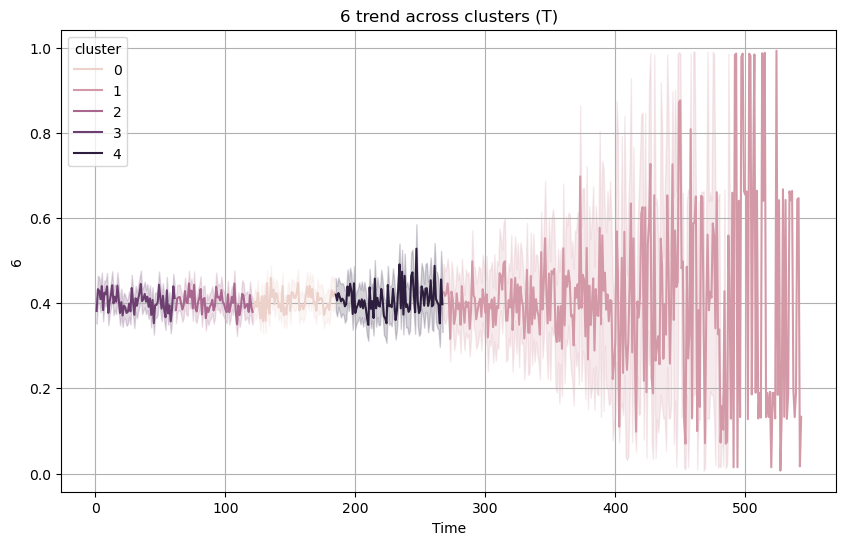

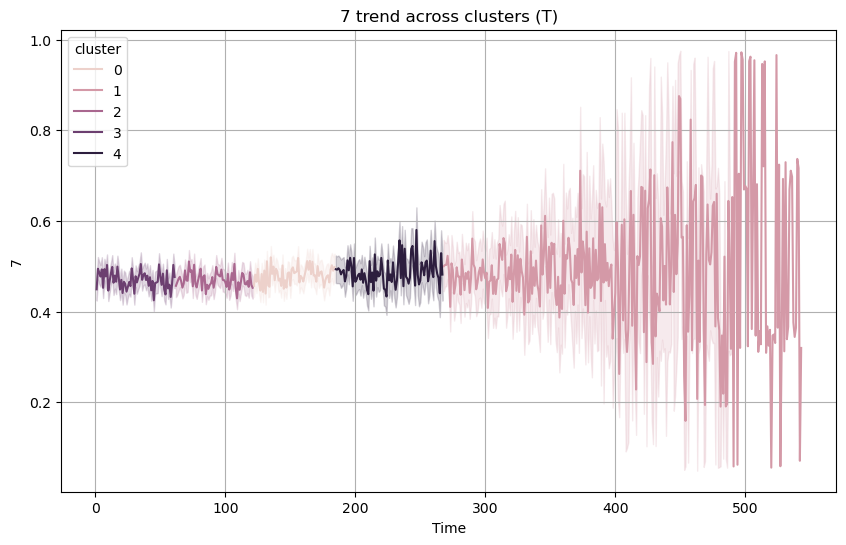

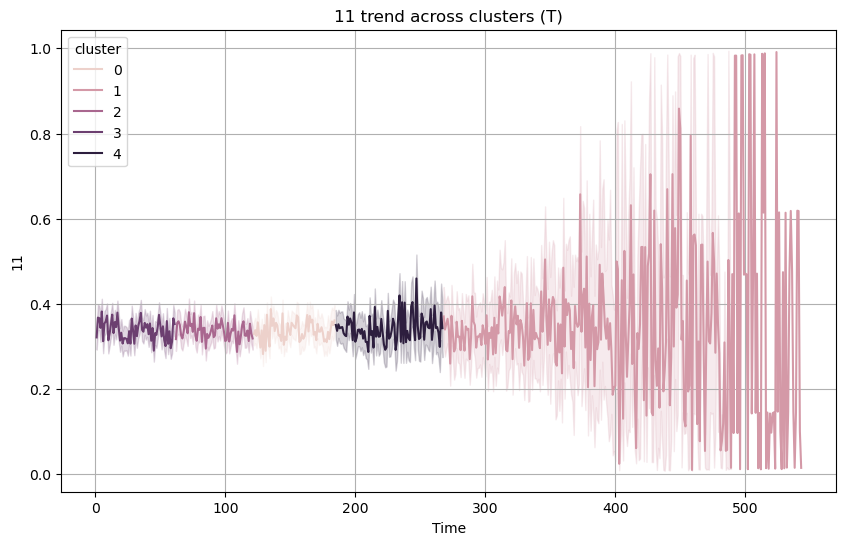

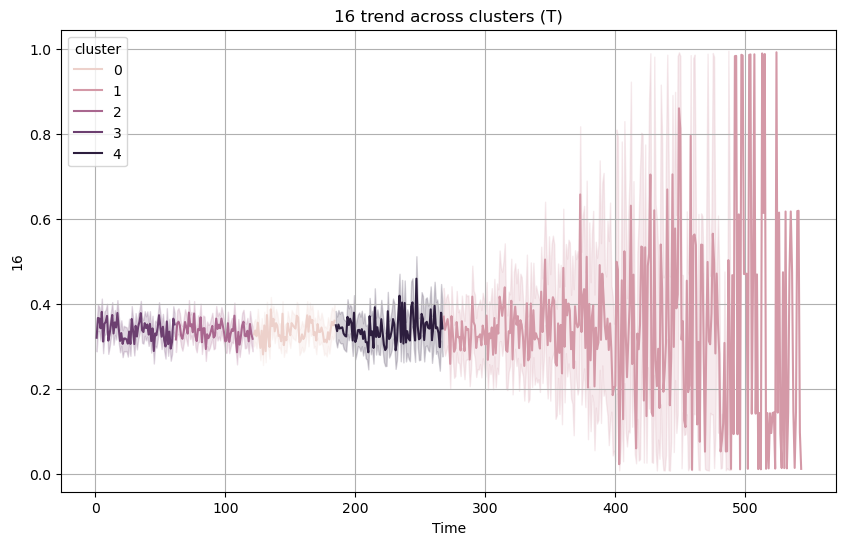

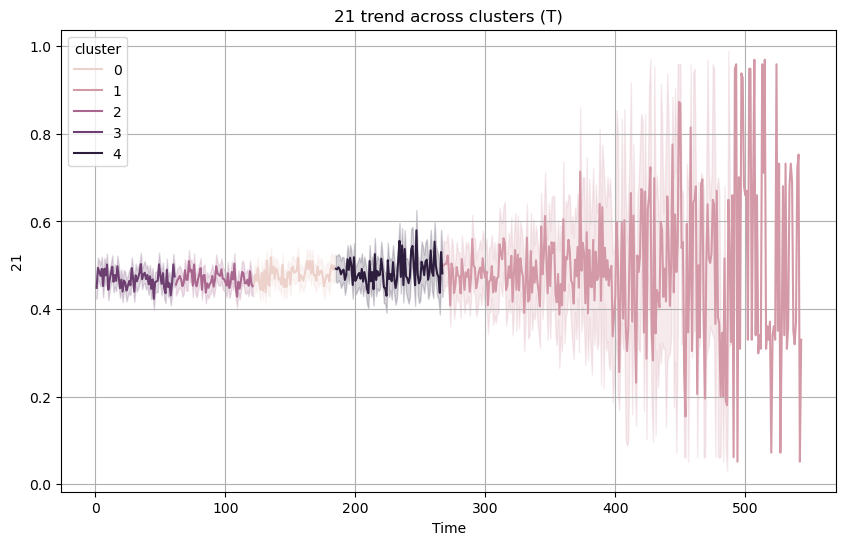

In [13]:
sensors = [6, 7, 11, 16, 21]
for sensor in sensors:
  plt.figure(figsize=(10, 6))
  sns.lineplot(data=df24_cluster_T, x=1, y=sensor, hue='cluster')
  plt.title(f'{sensor} trend across clusters (T)')
  plt.xlabel("Time")
  plt.grid(True)
  plt.show()
  '''
  CLUSTER STAGE
    0     2
    1     4
    2     1
    3     0
    4     3
  '''

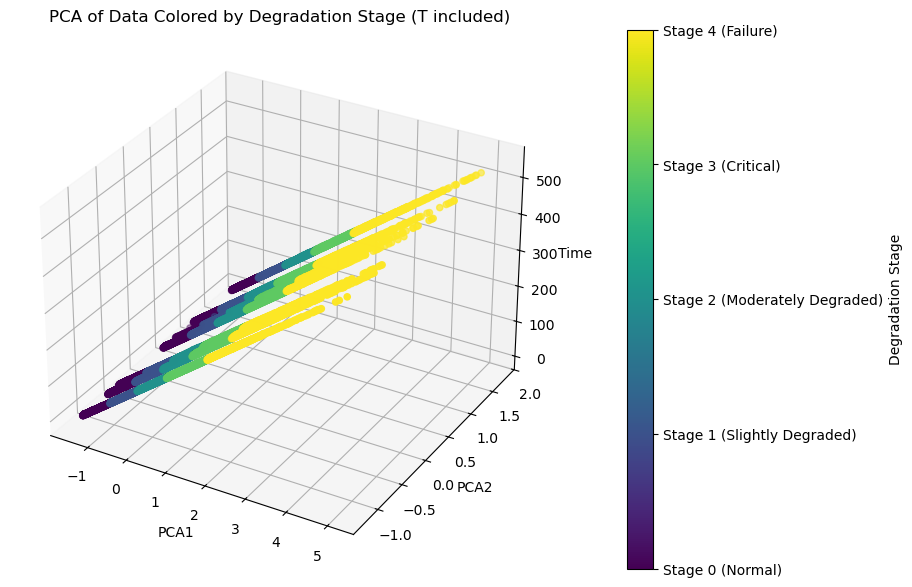

In [14]:
sensor_cols_T24 = [col for col in df24_cluster_T.columns if col not in [0,'cluster']]
X_T24 = df24_cluster_T[sensor_cols_T24].values
pcat = sk.decomposition.PCA(n_components=2)
X_pca_T24 = pcat.fit_transform(X_T24)


df24_pca_T= df24_cluster_T.copy()
df24_pca_T['PCA1'] = X_pca_T24[:, 0]
df24_pca_T['PCA2'] = X_pca_T24[:, 1]

# Adjusting cluster names to be assoicated with stages of degradation
cluster_to_stage_T = {
    0: 2,
    1: 4,
    2: 1,
    3: 0,
    4: 3
}
stage_names = {
    0: "Stage 0 (Normal)",
    1: "Stage 1 (Slightly Degraded)",
    2: "Stage 2 (Moderately Degraded)",
    3: "Stage 3 (Critical)",
    4: "Stage 4 (Failure)"
}

# creating a column that associates each sample with its stage
df24_pca_T['stage'] = df24_pca_T['cluster'].map(cluster_to_stage_T)

#plotting
df24_plot_T = df24_pca_T.copy()
scaler = sk.preprocessing.StandardScaler()
df24_plot_T[['PCA1', 'PCA2']] = scaler.fit_transform(df24_plot_T[['PCA1', 'PCA2']])
fig= plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df24_plot_T['PCA1'], df24_plot_T['PCA2'], df24_plot_T[1], c=df24_plot_T['stage'], cmap='viridis', marker='o')
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('Time')
ax.set_title("PCA of Data Colored by Degradation Stage (T included)")
# adding a colorbar with the stage names
cbar = fig.colorbar(scatter, ax=ax, pad=0.1, ticks=range(5))
cbar.ax.set_yticklabels([stage_names[i] for i in range(5)])
cbar.set_label("Degradation Stage")
plt.show()

## *DATASET ALL*

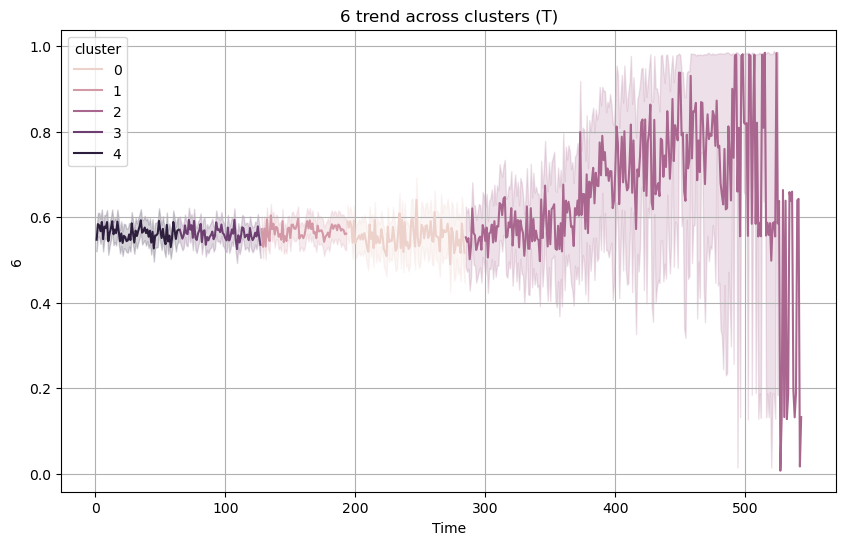

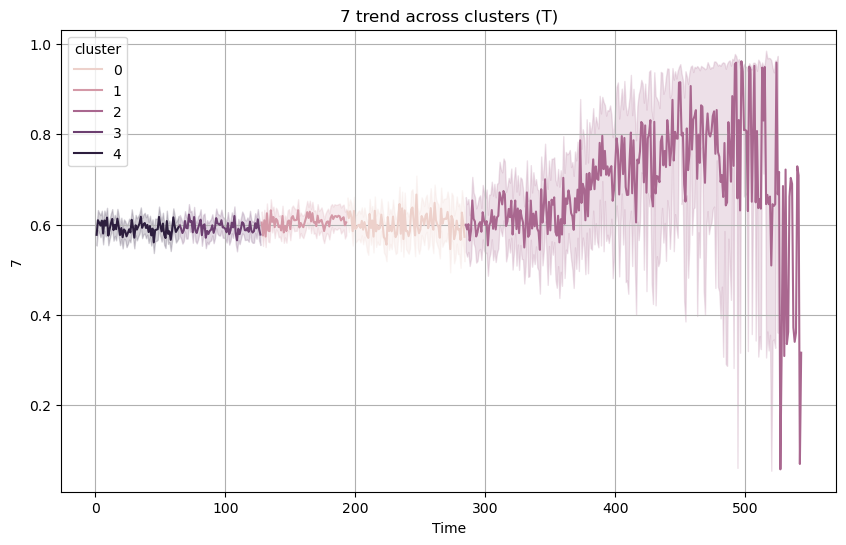

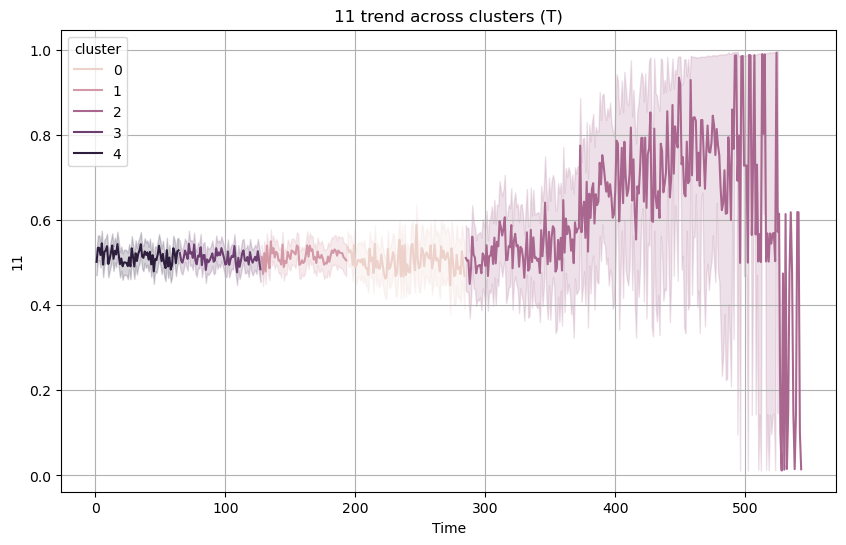

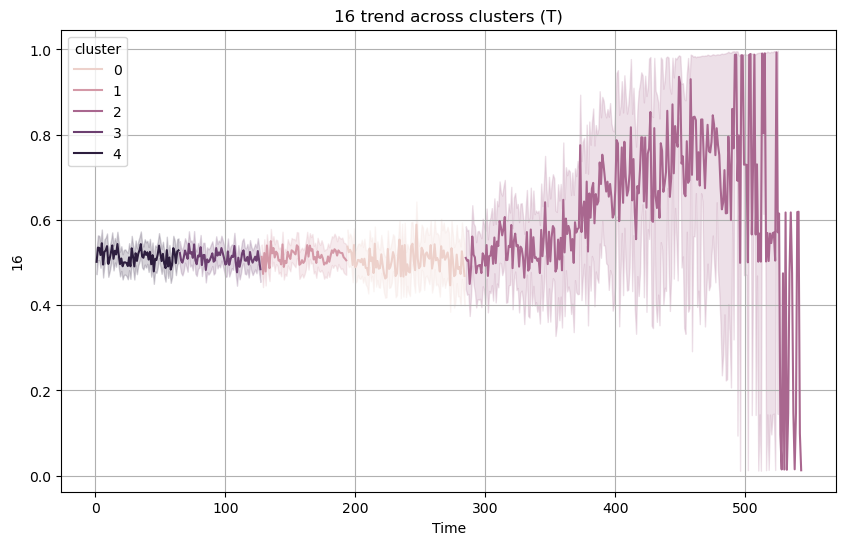

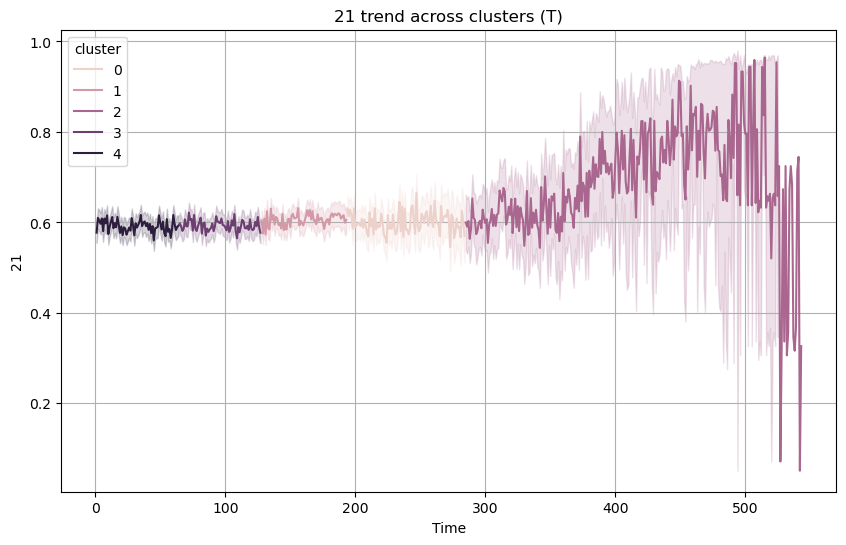

In [15]:
sensors = [6, 7, 11, 16, 21]
for sensor in sensors:
  plt.figure(figsize=(10, 6))
  sns.lineplot(data=df_all_cluster_T, x=1, y=sensor, hue='cluster')
  plt.title(f'{sensor} trend across clusters (T)')
  plt.xlabel("Time")
  plt.grid(True)
  plt.show()
  '''
  CLUSTER STAGE
    0     3
    1     2
    2     4
    3     1
    4     0
  '''

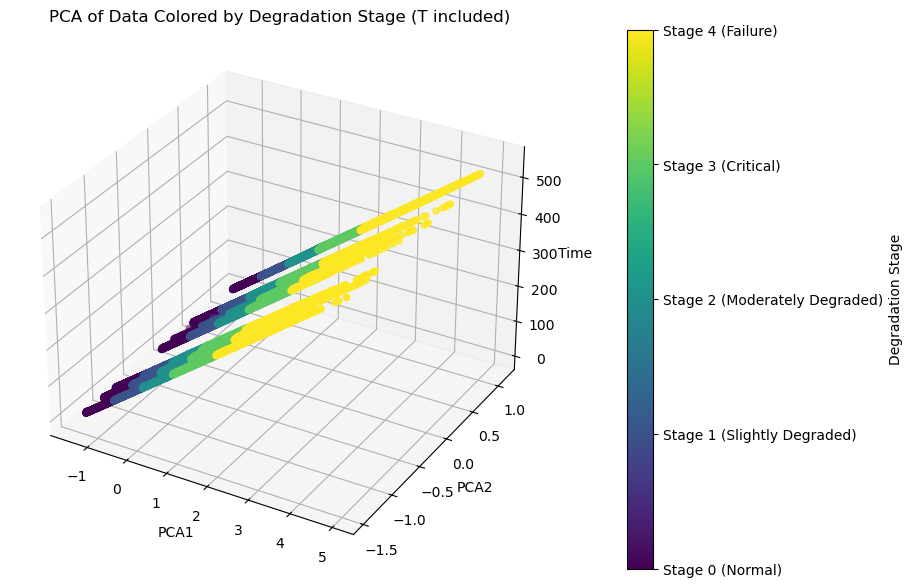

In [16]:
sensor_cols_T_all = [col for col in df_all_cluster_T.columns if col not in [0,'cluster']]
X_T_all = df_all_cluster_T[sensor_cols_T_all].values
pcat = sk.decomposition.PCA(n_components=2)
X_pca_T_all = pcat.fit_transform(X_T_all)


df_all_pca_T= df_all_cluster_T.copy()
df_all_pca_T['PCA1'] = X_pca_T_all[:, 0]
df_all_pca_T['PCA2'] = X_pca_T_all[:, 1]

# Adjusting cluster names to be assoicated with stages of degradation
cluster_to_stage_T = {
    0: 3,
    1: 2,
    2: 4,
    3: 1,
    4: 0
}
stage_names = {
    0: "Stage 0 (Normal)",
    1: "Stage 1 (Slightly Degraded)",
    2: "Stage 2 (Moderately Degraded)",
    3: "Stage 3 (Critical)",
    4: "Stage 4 (Failure)"
}

# creating a column that associates each sample with its stage
df_all_pca_T['stage'] = df_all_pca_T['cluster'].map(cluster_to_stage_T)

#plotting
df_all_plot_T = df_all_pca_T.copy()
scaler = sk.preprocessing.StandardScaler()
df_all_plot_T[['PCA1', 'PCA2']] = scaler.fit_transform(df_all_plot_T[['PCA1', 'PCA2']])
fig= plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_all_plot_T['PCA1'], df_all_plot_T['PCA2'], df_all_plot_T[1], c=df_all_plot_T['stage'], cmap='viridis', marker='o')
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('Time')
ax.set_title("PCA of Data Colored by Degradation Stage (T included)")
# adding a colorbar with the stage names
cbar = fig.colorbar(scatter, ax=ax, pad=0.1, ticks=range(5))
cbar.ax.set_yticklabels([stage_names[i] for i in range(5)])
cbar.set_label("Degradation Stage")
plt.show()

# PHASE 2

In [20]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.utils import resample
import os
import warnings
warnings.filterwarnings('ignore')

In [21]:
# Optimization 1: More efficient function for rolling statistics
def add_rolling_features(df, sensor_cols, window_sizes=[5, 10]):
    """
    More efficient implementation for adding rolling statistics
    """
    df_copy = df.copy()

    # Pre-allocate all columns at once to avoid expensive dataframe resizing
    for col in sensor_cols:
        for window in window_sizes:
            df_copy[f'{col}_mean_{window}'] = np.nan
            df_copy[f'{col}_std_{window}'] = np.nan

    # Calculate rolling statistics for each unit
    for unit in df_copy[0].unique():
        unit_mask = df_copy[0] == unit
        for col in sensor_cols:
            for window in window_sizes:
                # Use numpy for faster calculations
                values = df_copy.loc[unit_mask, col].values
                # Calculate rolling mean
                means = np.convolve(values, np.ones(window)/window, mode='valid')
                # Pad beginning with first value
                means = np.pad(means, (window-1, 0), 'edge')
                df_copy.loc[unit_mask, f'{col}_mean_{window}'] = means

                # Calculate rolling std - standard dev needs at least 2 values
                if window >= 2:
                    # Use numpy's rolling window view for efficiency
                    rolling_std = np.array([np.std(values[max(0, i-window+1):i+1])
                                            for i in range(len(values))])
                    df_copy.loc[unit_mask, f'{col}_std_{window}'] = rolling_std
                else:
                    df_copy.loc[unit_mask, f'{col}_std_{window}'] = 0

    return df_copy

# Optimization 2: More efficient data preparation function
def prepare_data_optimized(df, cluster_to_stage_map):
    """
    Optimized data preparation with reduced memory overhead
    """
    print(f"Preparing data with optimized pipeline...")

    # Map clusters to stages
    df_copy = df.copy()
    df_copy['stage'] = df_copy['cluster'].map(cluster_to_stage_map)

    # Select sensor columns efficiently
    sensor_cols = [col for col in df_copy.columns if isinstance(col, int) and col not in [0, 1]]

    # Add rolling statistics with optimized function
    df_enhanced = add_rolling_features(df_copy, sensor_cols)

    # Get feature columns efficiently
    feature_cols = [col for col in df_enhanced.columns
                   if (isinstance(col, int) and col not in [0, 1]) or
                      (isinstance(col, str) and col not in ['cluster', 'stage'] and ('mean' in col or 'std' in col))]

    # Print information
    print(f"Total samples: {len(df_enhanced)}")
    print(f"Features: {len(feature_cols)}")
    stage_counts = df_enhanced['stage'].value_counts().sort_index()
    print(f"Stage distribution: {stage_counts.to_dict()}")

    # Create X (features) and y (target) - use numpy arrays for efficiency
    X = df_enhanced[feature_cols].values
    y = df_enhanced['stage'].values

    # Split data efficiently
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )

    # Scale features efficiently
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    return X_train, X_test, y_train, y_test, feature_cols

# Optimization 3: Efficient SMOTE application
def apply_smote_optimized(X_train, y_train):
    """
    Apply SMOTE with progress tracking for large datasets
    """
    print("Applying SMOTE to balance classes...")
    start_shape = X_train.shape
    smote = SMOTE(random_state=42)
    X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

    # Print brief summary
    print(f"SMOTE: {start_shape[0]} samples → {X_train_smote.shape[0]} samples")
    return X_train_smote, y_train_smote

# Optimization 4: Efficient model training and evaluation - Fixed for XGBoost
def train_and_evaluate_optimized(model, X_train, y_train, X_test, y_test, model_name, feature_names=None, critical_stages=[3, 4]):
    """
    More efficient training and evaluation of models
    """
    print(f"Training {model_name}...")

    # FIX: For XGBoost, use the correct approach for early stopping and feature importance
    if model_name == 'XGBoost':
        # For multiclass, ensure num_class is set correctly
        num_classes = len(np.unique(y_train))

        # Convert to DMatrix for efficiency in native XGBoost
        dtrain = xgb.DMatrix(X_train, label=y_train)
        dtest = xgb.DMatrix(X_test, label=y_test)

        # Get parameters from model
        params = model.get_params()
        # Clean up parameters
        for param in ['n_estimators', 'use_label_encoder', 'n_jobs', 'random_state',
                      'enable_categorical', 'missing', 'feature_types']:
            if param in params:
                del params[param]

        # Ensure num_class is set correctly
        params['num_class'] = num_classes
        params['objective'] = 'multi:softprob'

        # Set evaluation list
        evallist = [(dtrain, 'train'), (dtest, 'eval')]

        # Train model with early stopping
        num_round = 100  # Number of boosting rounds
        bst = xgb.train(
            params, dtrain, num_round,
            evals=evallist,
            early_stopping_rounds=10,
            verbose_eval=False
        )

        # Make predictions
        y_pred_proba = bst.predict(dtest)
        # Convert probability predictions to class predictions
        y_pred = np.argmax(y_pred_proba.reshape(len(y_test), num_classes), axis=1)

        # For feature importance tracking, save feature map
        if feature_names is not None:
            feature_map_path = 'xgb_feature_map.txt'
            with open(feature_map_path, 'w') as f:
                for i, feat in enumerate(feature_names):
                    f.write(f'{i}\t{feat}\tq\n')
    else:
        # For all other models, use standard scikit-learn API
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

    # Calculate metrics efficiently
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Print basic results
    print(f"{model_name}: Acc={accuracy:.4f}, F1={f1:.4f}")

    # Create confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Get metrics for critical stages
    critical_results = None
    critical_mask = np.isin(y_test, critical_stages)
    if np.any(critical_mask):
        y_test_critical = y_test[critical_mask]
        y_pred_critical = y_pred[critical_mask]

        critical_accuracy = accuracy_score(y_test_critical, y_pred_critical)
        critical_f1 = f1_score(y_test_critical, y_pred_critical, average='weighted')

        print(f"{model_name} (Critical Stages): Acc={critical_accuracy:.4f}, F1={critical_f1:.4f}")

        critical_results = {
            'critical_accuracy': critical_accuracy,
            'critical_f1': critical_f1
        }

    # Store all results
    results = {
        'model': bst if model_name == 'XGBoost' else model,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'confusion_matrix': cm,
        'is_xgboost': model_name == 'XGBoost'  # Flag for XGBoost models
    }

    if critical_results:
        results.update(critical_results)

    return results

# Optimization 5: Efficient visualization functions - Fixed for XGBoost
def plot_confusion_matrix(cm, model_name, classes=None):
    """
    Plot confusion matrix with optimized parameters
    """
    if classes is None:
        classes = ["Stage 0", "Stage 1", "Stage 2", "Stage 3", "Stage 4"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.tight_layout()
    plt.show()

def plot_feature_importance(model_result, feature_names, model_name, top_n=15):
    """
    Fixed plot_feature_importance function for all model types
    """
    model = model_result['model']
    is_xgboost = model_result.get('is_xgboost', False)

    # Handle different model types
    if is_xgboost:
        # For XGBoost native models
        try:
            # Try to get feature scores using the feature map
            feature_map_path = 'xgb_feature_map.txt'
            if os.path.exists(feature_map_path):
                importance = model.get_score(fmap=feature_map_path, importance_type='gain')
            else:
                # If no feature map, use feature index
                importance = model.get_score(importance_type='gain')

            # If empty, try different importance types
            if not importance:
                importance = model.get_score(importance_type='weight')
            if not importance:
                importance = model.get_score(importance_type='cover')

            # Sort by importance
            sorted_importance = sorted(importance.items(), key=lambda x: x[1], reverse=True)[:top_n]

            if sorted_importance:
                # Extract feature names and values
                features = []
                values = []

                for feat, val in sorted_importance:
                    if feat.startswith('f'):
                        # Convert feature index to name
                        idx = int(feat[1:])
                        if idx < len(feature_names):
                            features.append(feature_names[idx])
                        else:
                            features.append(feat)
                    else:
                        # Use feature name directly
                        features.append(feat)
                    values.append(val)

                # Plot
                plt.figure(figsize=(10, 6))
                plt.title(f'Top {len(features)} Features - {model_name}')
                plt.barh(range(len(features)), values)
                plt.yticks(range(len(features)), features)
                plt.xlabel('Importance (Gain)')
                plt.tight_layout()
                plt.show()

                # Print top features
                print(f"\nTop {len(features)} Features for {model_name}:")
                for feature, value in zip(features, values):
                    print(f"{feature}: {value:.4f}")
            else:
                print(f"No feature importance available for {model_name}")

        except Exception as e:
            print(f"Error getting XGBoost feature importance: {e}")
            # Fallback: Print feature names only
            print("\nFeatures used in model:")
            for i, feature in enumerate(feature_names[:10]):
                print(f"{i}: {feature}")

    elif hasattr(model, 'feature_importances_'):
        # For scikit-learn models with feature_importances_ (Random Forest, etc.)
        importances = model.feature_importances_
        indices = np.argsort(importances)[-top_n:][::-1]

        # Plot
        plt.figure(figsize=(10, 6))
        plt.title(f'Top {min(top_n, len(indices))} Features - {model_name}')
        plt.barh(range(len(indices)), importances[indices])
        plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
        plt.xlabel('Importance')
        plt.tight_layout()
        plt.show()

        # Print top features
        print(f"\nTop {min(top_n, len(indices))} Features for {model_name}:")
        for i in range(min(top_n, len(indices))):
            print(f"{feature_names[indices[i]]}: {importances[indices[i]]:.4f}")

    elif hasattr(model, 'coef_'):
        # For linear models (Logistic Regression, LinearSVC)
        coef = model.coef_
        importances = np.mean(np.abs(coef), axis=0) if coef.ndim > 1 else np.abs(coef)

        # Get top features
        indices = np.argsort(importances)[-top_n:][::-1]

        # Plot
        plt.figure(figsize=(10, 6))
        plt.title(f'Top {min(top_n, len(indices))} Features - {model_name}')
        plt.barh(range(len(indices)), importances[indices])
        plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
        plt.xlabel('Coefficient Magnitude')
        plt.tight_layout()
        plt.show()

        # Print top features
        print(f"\nTop {min(top_n, len(indices))} Features for {model_name}:")
        for i in range(min(top_n, len(indices))):
            print(f"{feature_names[indices[i]]}: {importances[indices[i]]:.4f}")
    else:
        print(f"Feature importance not available for {model_name}")

# Main function with SVM optimization
def run_phase2_optimized(dataset_name, df, cluster_to_stage_map, skip_svm=True, sample_size_svm=3000):
    """
    Optimized implementation of Phase 2 for a given dataset
    """
    print(f"\n{'='*50}")
    print(f"Phase 2 Classification: {dataset_name}")
    print(f"{'='*50}")

    # Prepare data with optimized pipeline
    X_train, X_test, y_train, y_test, feature_cols = prepare_data_optimized(df, cluster_to_stage_map)

    # Apply SMOTE efficiently
    X_train_smote, y_train_smote = apply_smote_optimized(X_train, y_train)

    # Initialize models with optimized parameters
    models = {
        'Logistic Regression': LogisticRegression(max_iter=1000, class_weight='balanced',
                                                 solver='saga', n_jobs=-1, random_state=42),

        'Random Forest': RandomForestClassifier(n_estimators=100, class_weight='balanced',
                                               n_jobs=-1, random_state=42),

        'KNN': KNeighborsClassifier(n_neighbors=5, n_jobs=-1),

        'XGBoost': xgb.XGBClassifier(
            objective='multi:softprob',
            num_class=5,  # 5 classes for stages 0-4
            eval_metric='mlogloss',
            use_label_encoder=False,
            n_jobs=-1,
            n_estimators=100,
            learning_rate=0.1,
            random_state=42
        )
    }

    # Add optimized SVM if not skipped
    if not skip_svm:
        # Use LinearSVC for faster training
        models['LinearSVM'] = LinearSVC(
            class_weight='balanced',
            dual=False,
            C=1.0,
            max_iter=1000,
            random_state=42
        )

        # Create smaller dataset for regular SVM
        print(f"Creating reduced dataset for SVM training ({sample_size_svm} samples)...")
        X_train_small, y_train_small = resample(
            X_train_smote, y_train_smote,
            n_samples=min(sample_size_svm, len(X_train_smote)),
            stratify=y_train_smote,
            random_state=42
        )

        # Add sampled SVM to models dictionary with a custom function
        def train_evaluate_sampled_svm(X_test, y_test, feature_names=None):
            print(f"Training SVM on sampled data ({len(X_train_small)} samples)...")

            model = SVC(
                class_weight='balanced',
                kernel='rbf',
                C=1.0,
                gamma='scale',
                cache_size=2000,
                max_iter=1000,
                probability=False,
                random_state=42
            )

            # Fit the model
            model.fit(X_train_small, y_train_small)

            # Predict
            y_pred = model.predict(X_test)

            # Calculate metrics
            accuracy = accuracy_score(y_test, y_pred)
            precision = precision_score(y_test, y_pred, average='weighted')
            recall = recall_score(y_test, y_pred, average='weighted')
            f1 = f1_score(y_test, y_pred, average='weighted')

            # Print results
            print(f"SVM-Sampled: Acc={accuracy:.4f}, F1={f1:.4f}")

            # Get metrics for critical stages
            critical_stages = [3, 4]
            critical_mask = np.isin(y_test, critical_stages)
            critical_results = {}

            if np.any(critical_mask):
                y_test_critical = y_test[critical_mask]
                y_pred_critical = y_pred[critical_mask]

                critical_accuracy = accuracy_score(y_test_critical, y_pred_critical)
                critical_f1 = f1_score(y_test_critical, y_pred_critical, average='weighted')

                print(f"SVM-Sampled (Critical Stages): Acc={critical_accuracy:.4f}, F1={critical_f1:.4f}")

                critical_results = {
                    'critical_accuracy': critical_accuracy,
                    'critical_f1': critical_f1
                }

            # Create confusion matrix
            cm = confusion_matrix(y_test, y_pred)

            # Store results
            results = {
                'model': model,
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1_score': f1,
                'confusion_matrix': cm
            }

            if critical_results:
                results.update(critical_results)

            return results

    # Train and evaluate each model efficiently
    results = {}
    for name, model in models.items():
        # Pass feature names to the training function
        results[name] = train_and_evaluate_optimized(
            model, X_train_smote, y_train_smote, X_test, y_test, name, feature_cols
        )

    # Add SVM-Sampled if not skipped
    if not skip_svm:
        results['SVM-Sampled'] = train_evaluate_sampled_svm(X_test, y_test, feature_cols)

    # Plot confusion matrices
    print("\nGenerating visualizations...")
    for name, result in results.items():
        plot_confusion_matrix(result['confusion_matrix'], name)

    # Visualize feature importance for selected models
    for name in ['Random Forest', 'XGBoost', 'Logistic Regression']:
        if name in results:
            plot_feature_importance(results[name], feature_cols, name)

    # Determine best model
    models_with_critical = {name: result for name, result in results.items() if 'critical_f1' in result}

    if models_with_critical:
        best_model_name = max(models_with_critical.items(), key=lambda x: x[1]['critical_f1'])[0]
    else:
        best_model_name = max(results.items(), key=lambda x: x[1]['f1_score'])[0]

    print(f"\nBest model for {dataset_name}: {best_model_name}")

    return results, best_model_name


Phase 2 Classification: Dataset 1
Preparing data with optimized pipeline...
Total samples: 20631
Features: 85
Stage distribution: {0: 5000, 1: 5000, 2: 5117, 3: 4158, 4: 1356}
Applying SMOTE to balance classes...
SMOTE: 14441 samples → 17910 samples
Creating reduced dataset for SVM training (3000 samples)...
Training Logistic Regression...
Logistic Regression: Acc=0.4708, F1=0.4702
Logistic Regression (Critical Stages): Acc=0.4870, F1=0.5639
Training Random Forest...
Random Forest: Acc=0.8414, F1=0.8408
Random Forest (Critical Stages): Acc=0.8502, F1=0.9011
Training KNN...
KNN: Acc=0.8481, F1=0.8490
KNN (Critical Stages): Acc=0.8894, F1=0.9128
Training XGBoost...
XGBoost: Acc=0.6987, F1=0.6983
XGBoost (Critical Stages): Acc=0.7100, F1=0.7869
Training LinearSVM...
LinearSVM: Acc=0.4360, F1=0.4184
LinearSVM (Critical Stages): Acc=0.4906, F1=0.5424
Training SVM on sampled data (3000 samples)...
SVM-Sampled: Acc=0.5118, F1=0.5108
SVM-Sampled (Critical Stages): Acc=0.5184, F1=0.6065

Gener

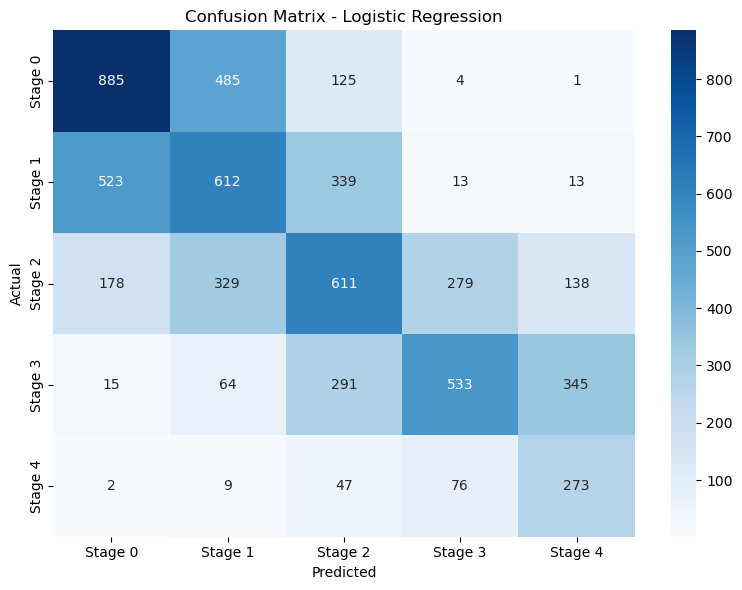

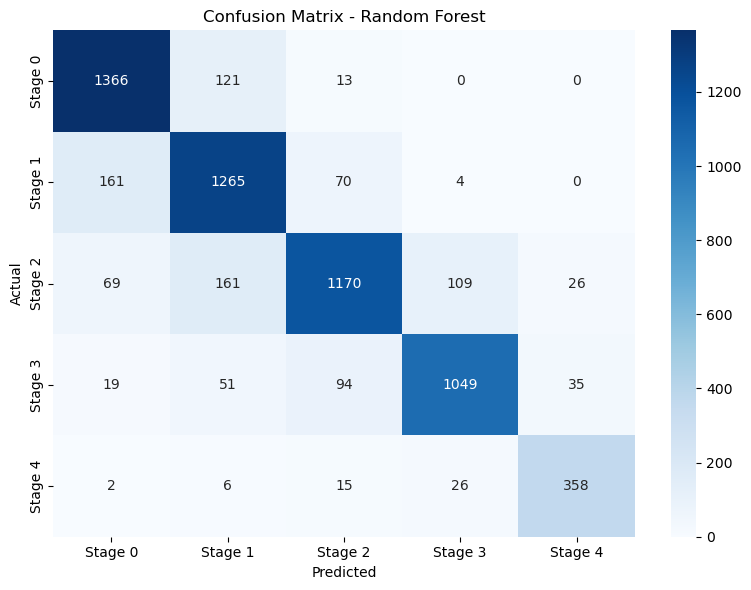

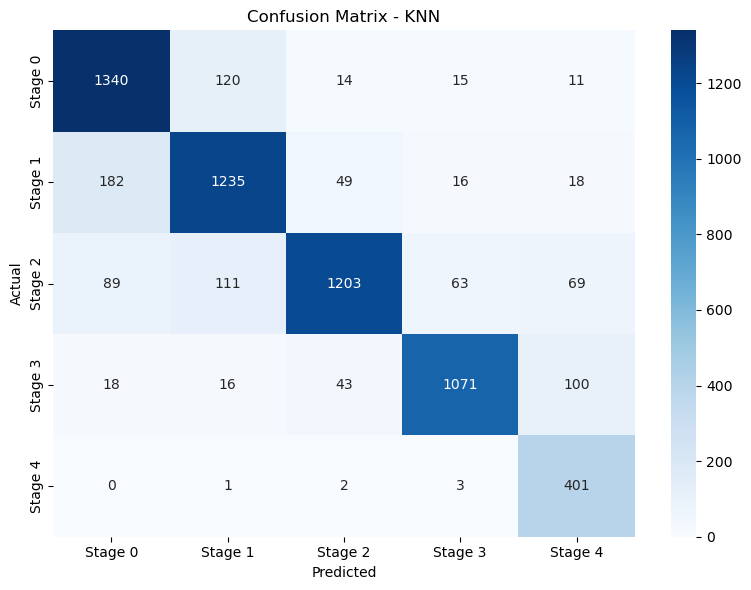

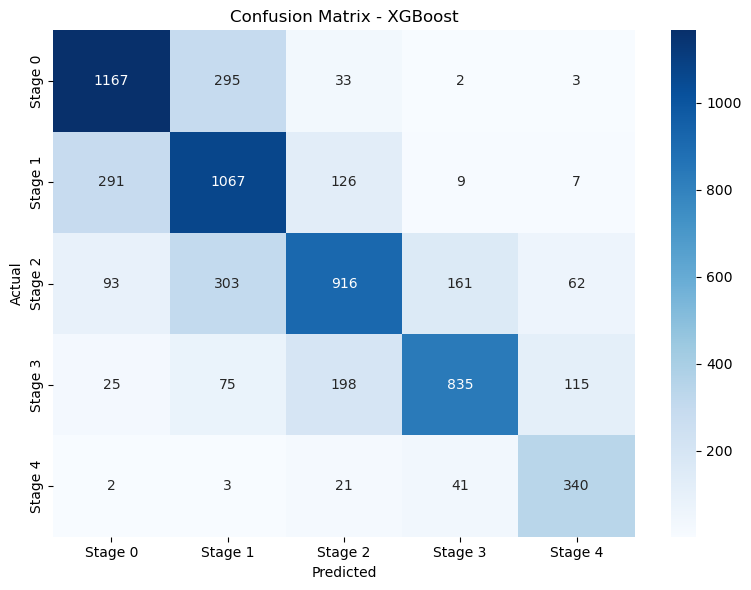

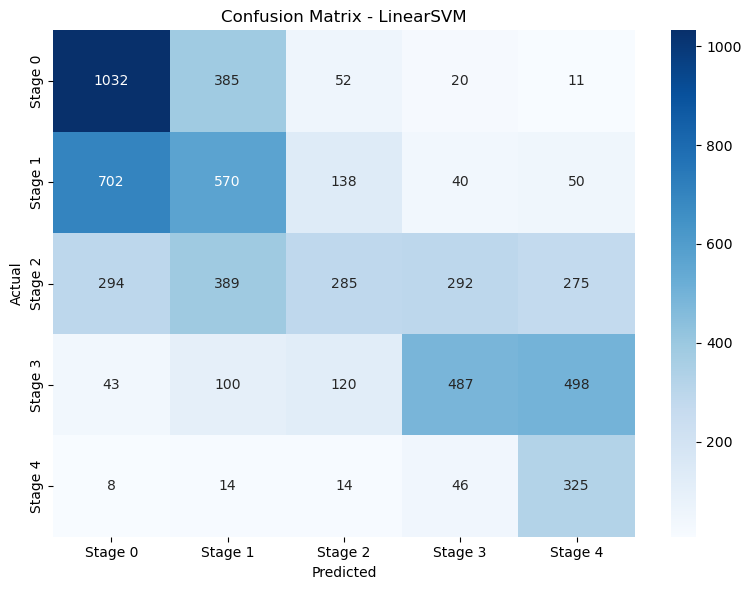

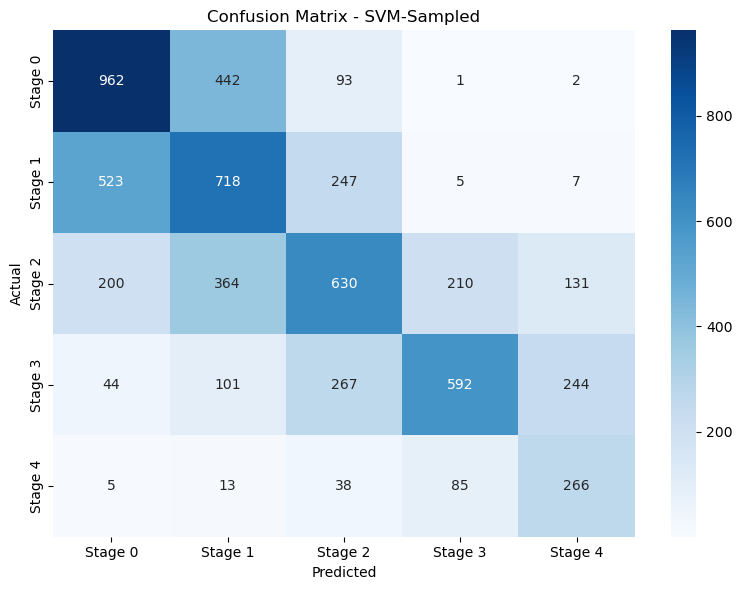

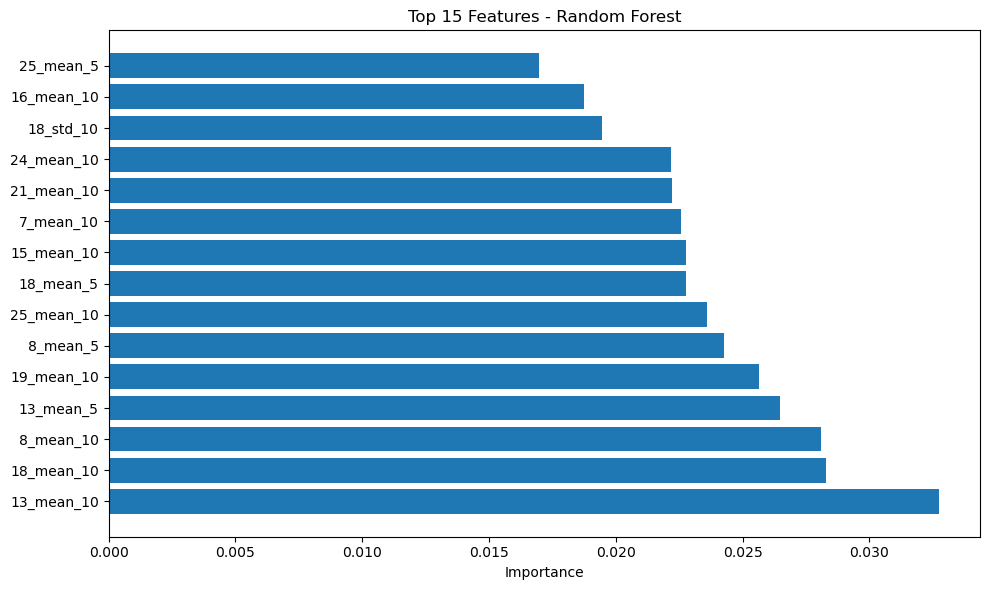


Top 15 Features for Random Forest:
13_mean_10: 0.0327
18_mean_10: 0.0283
8_mean_10: 0.0281
13_mean_5: 0.0265
19_mean_10: 0.0256
8_mean_5: 0.0243
25_mean_10: 0.0236
18_mean_5: 0.0228
15_mean_10: 0.0228
7_mean_10: 0.0226
21_mean_10: 0.0222
24_mean_10: 0.0222
18_std_10: 0.0194
16_mean_10: 0.0188
25_mean_5: 0.0170


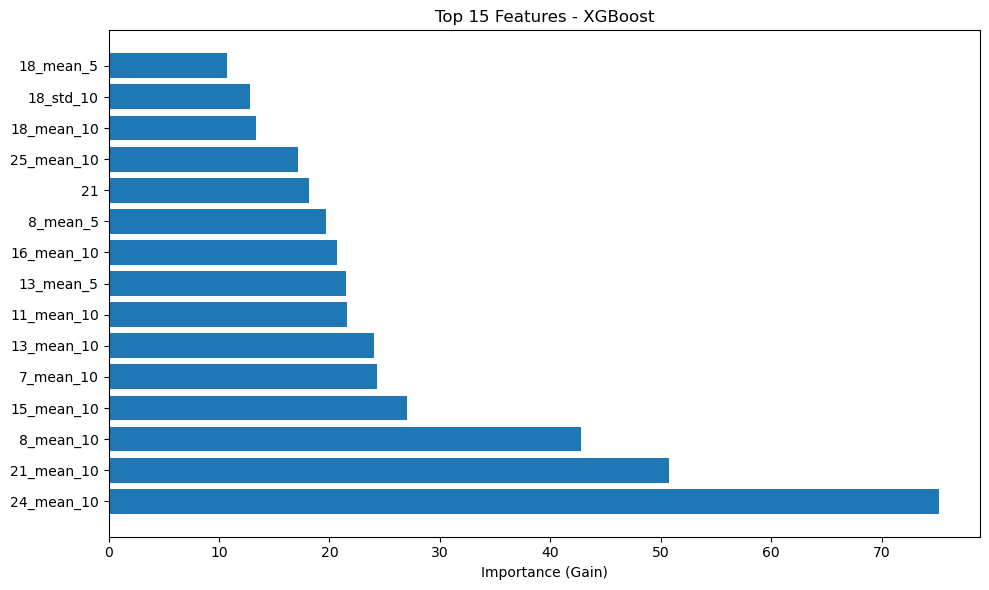


Top 15 Features for XGBoost:
24_mean_10: 75.1411
21_mean_10: 50.7602
8_mean_10: 42.7510
15_mean_10: 27.0029
7_mean_10: 24.3270
13_mean_10: 24.0581
11_mean_10: 21.6195
13_mean_5: 21.4510
16_mean_10: 20.6598
8_mean_5: 19.7208
21: 18.1797
25_mean_10: 17.1368
18_mean_10: 13.3206
18_std_10: 12.8414
18_mean_5: 10.7611


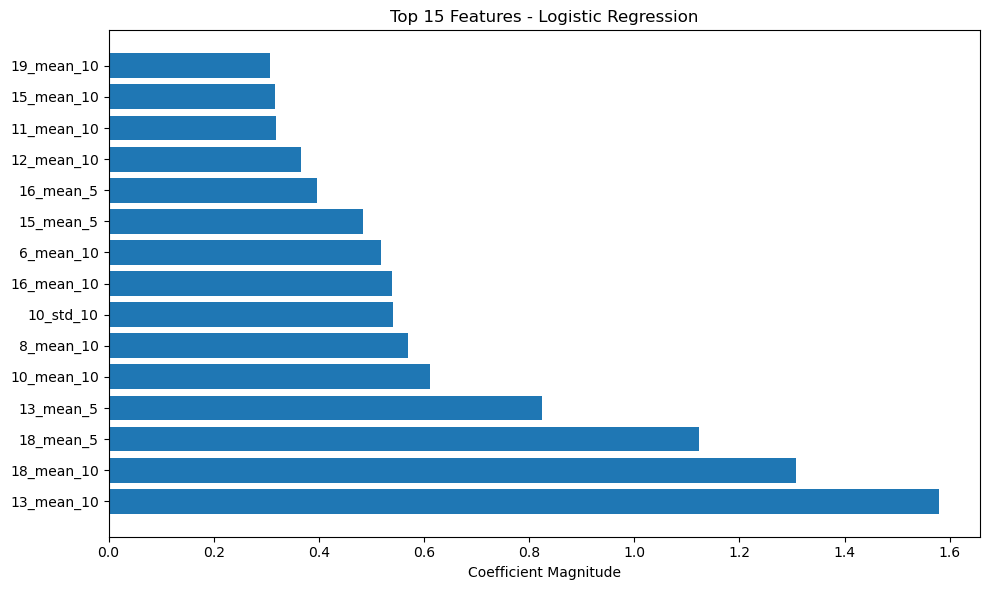


Top 15 Features for Logistic Regression:
13_mean_10: 1.5786
18_mean_10: 1.3075
18_mean_5: 1.1239
13_mean_5: 0.8236
10_mean_10: 0.6115
8_mean_10: 0.5694
10_std_10: 0.5406
16_mean_10: 0.5393
6_mean_10: 0.5172
15_mean_5: 0.4845
16_mean_5: 0.3968
12_mean_10: 0.3669
11_mean_10: 0.3177
15_mean_10: 0.3169
19_mean_10: 0.3067

Best model for Dataset 1: KNN

Phase 2 Classification: Dataset 1 & 3
Preparing data with optimized pipeline...
Total samples: 45351
Features: 90
Stage distribution: {0: 12800, 1: 13198, 2: 12298, 3: 5393, 4: 1662}
Applying SMOTE to balance classes...
SMOTE: 31745 samples → 46190 samples
Creating reduced dataset for SVM training (3000 samples)...
Training Logistic Regression...
Logistic Regression: Acc=0.5531, F1=0.5523
Logistic Regression (Critical Stages): Acc=0.5805, F1=0.6671
Training Random Forest...
Random Forest: Acc=0.8495, F1=0.8490
Random Forest (Critical Stages): Acc=0.8734, F1=0.9237
Training KNN...
KNN: Acc=0.8146, F1=0.8142
KNN (Critical Stages): Acc=0.9466,

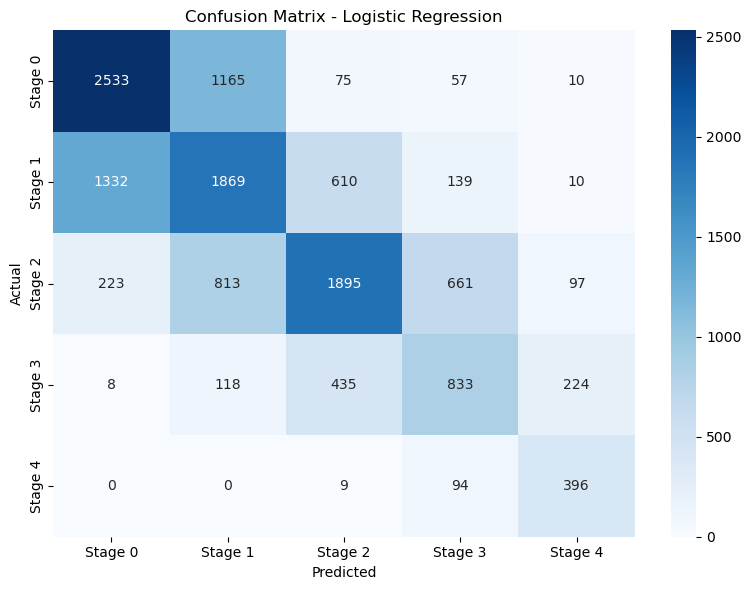

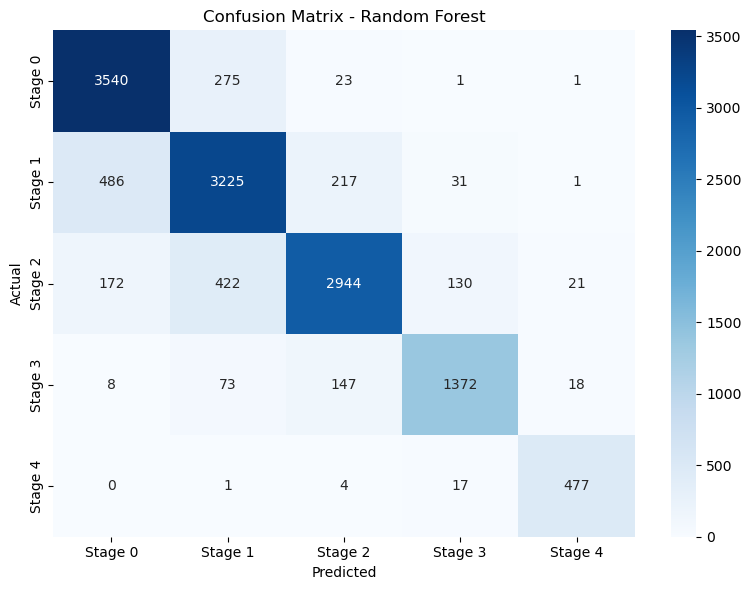

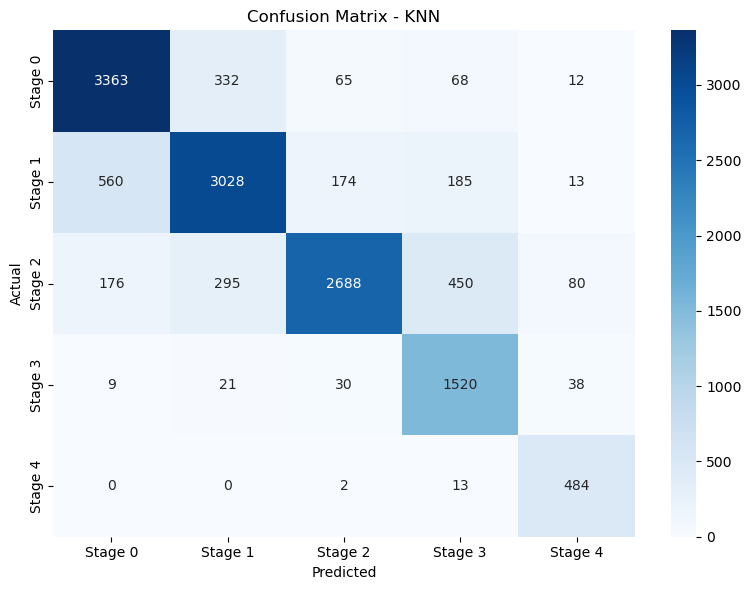

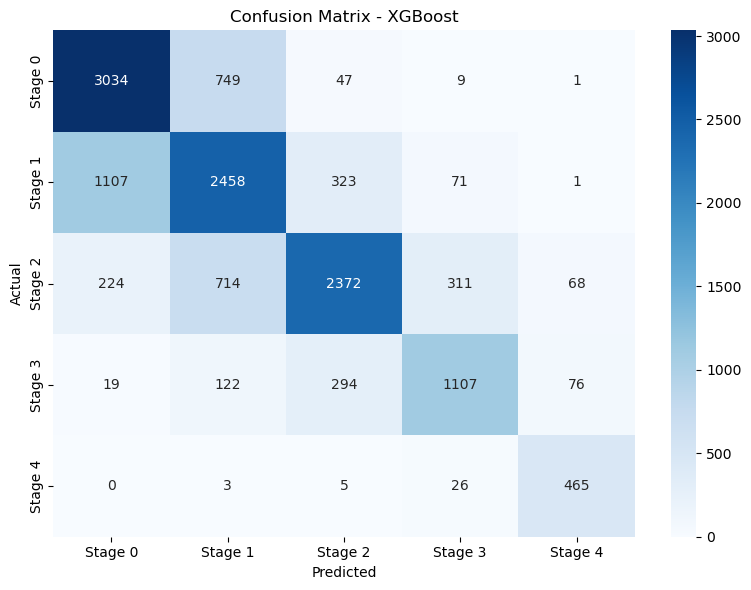

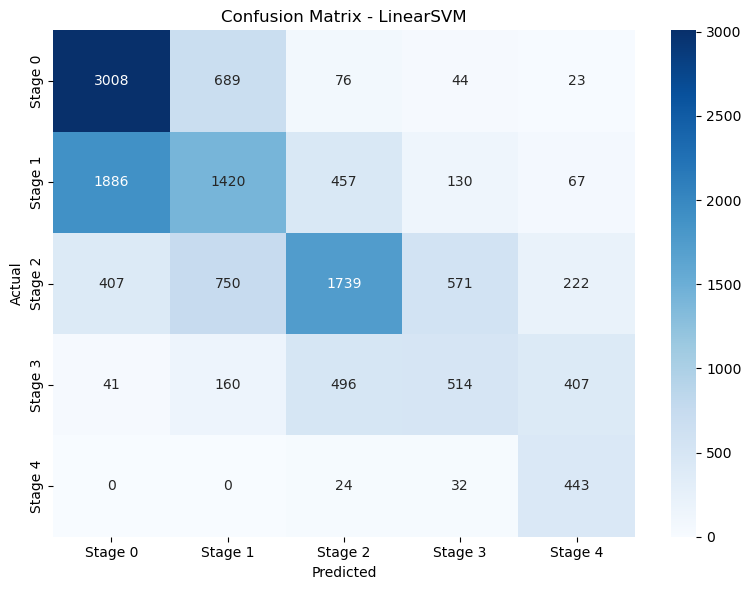

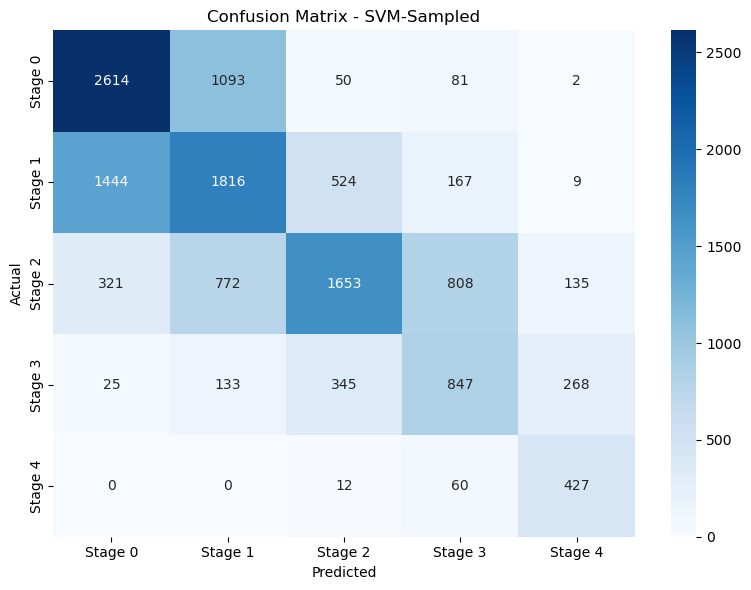

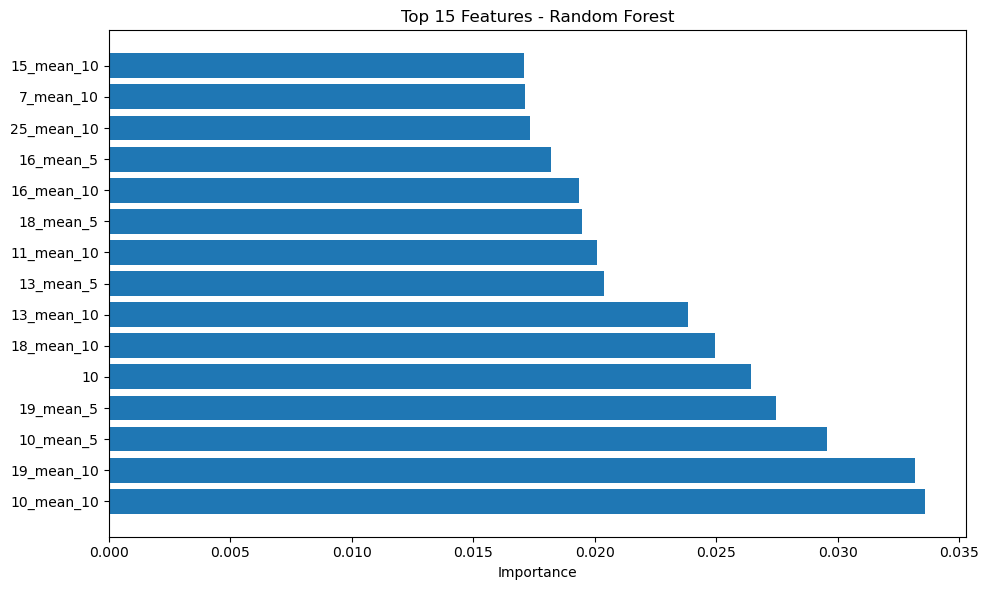


Top 15 Features for Random Forest:
10_mean_10: 0.0336
19_mean_10: 0.0332
10_mean_5: 0.0296
19_mean_5: 0.0274
10: 0.0264
18_mean_10: 0.0249
13_mean_10: 0.0238
13_mean_5: 0.0204
11_mean_10: 0.0201
18_mean_5: 0.0195
16_mean_10: 0.0194
16_mean_5: 0.0182
25_mean_10: 0.0173
7_mean_10: 0.0171
15_mean_10: 0.0171


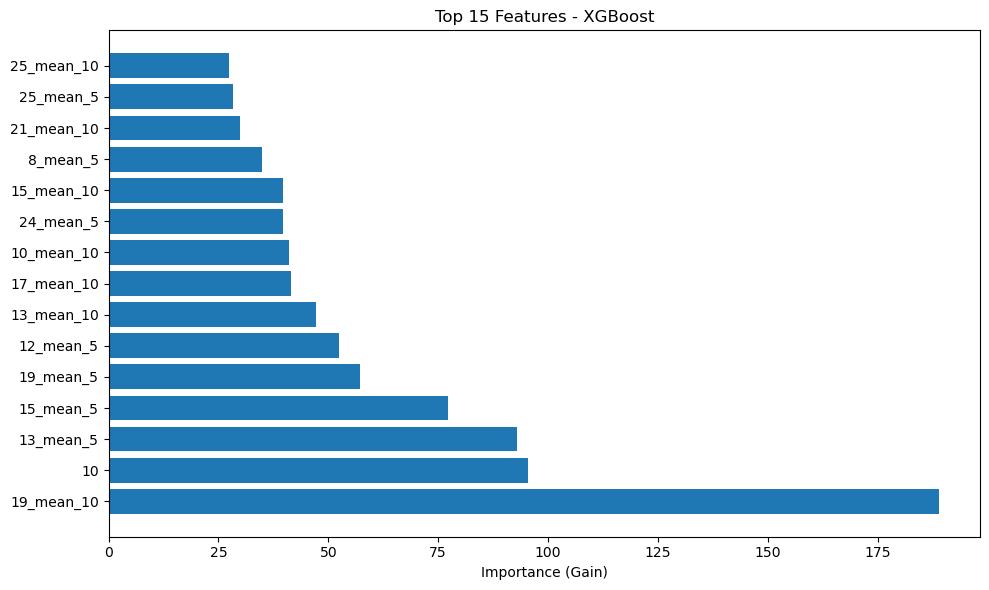


Top 15 Features for XGBoost:
19_mean_10: 188.8352
10: 95.4205
13_mean_5: 92.8797
15_mean_5: 77.3335
19_mean_5: 57.1523
12_mean_5: 52.3476
13_mean_10: 47.2295
17_mean_10: 41.5335
10_mean_10: 41.0190
24_mean_5: 39.7744
15_mean_10: 39.6988
8_mean_5: 34.8954
21_mean_10: 30.0072
25_mean_5: 28.3870
25_mean_10: 27.3284


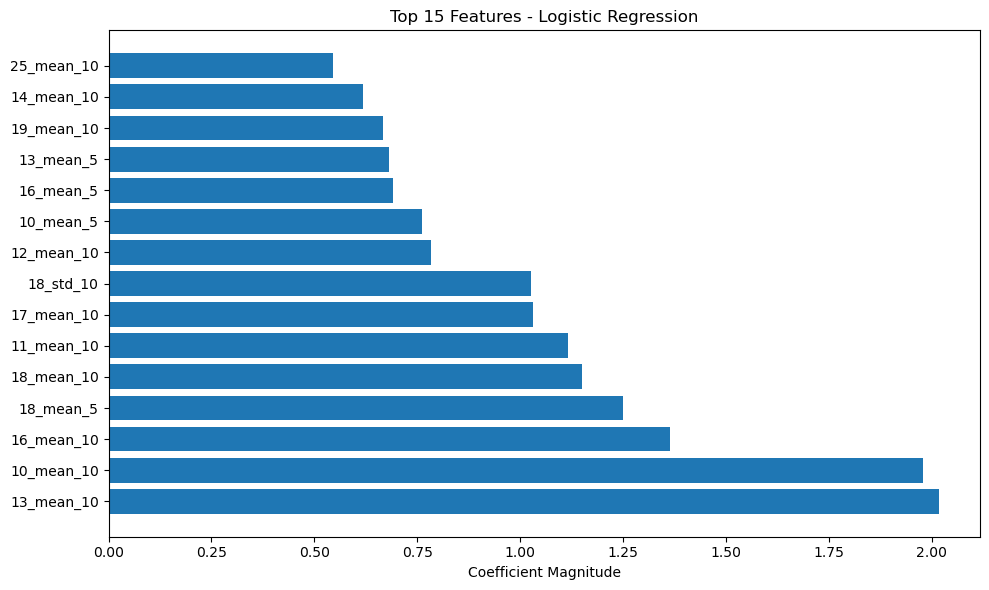


Top 15 Features for Logistic Regression:
13_mean_10: 2.0165
10_mean_10: 1.9791
16_mean_10: 1.3646
18_mean_5: 1.2488
18_mean_10: 1.1499
11_mean_10: 1.1166
17_mean_10: 1.0317
18_std_10: 1.0260
12_mean_10: 0.7842
10_mean_5: 0.7618
16_mean_5: 0.6911
13_mean_5: 0.6812
19_mean_10: 0.6671
14_mean_10: 0.6189
25_mean_10: 0.5442

Best model for Dataset 1 & 3: KNN

Phase 2 Classification: Dataset 2 & 4
Preparing data with optimized pipeline...
Total samples: 115008
Features: 120
Stage distribution: {0: 31049, 1: 30540, 2: 29061, 3: 18082, 4: 6276}
Applying SMOTE to balance classes...
SMOTE: 80505 samples → 108670 samples
Creating reduced dataset for SVM training (3000 samples)...
Training Logistic Regression...
Logistic Regression: Acc=0.4681, F1=0.4654
Logistic Regression (Critical Stages): Acc=0.4454, F1=0.5307
Training Random Forest...
Random Forest: Acc=0.5781, F1=0.5752
Random Forest (Critical Stages): Acc=0.5211, F1=0.6182
Training KNN...
KNN: Acc=0.4022, F1=0.4010
KNN (Critical Stages): A

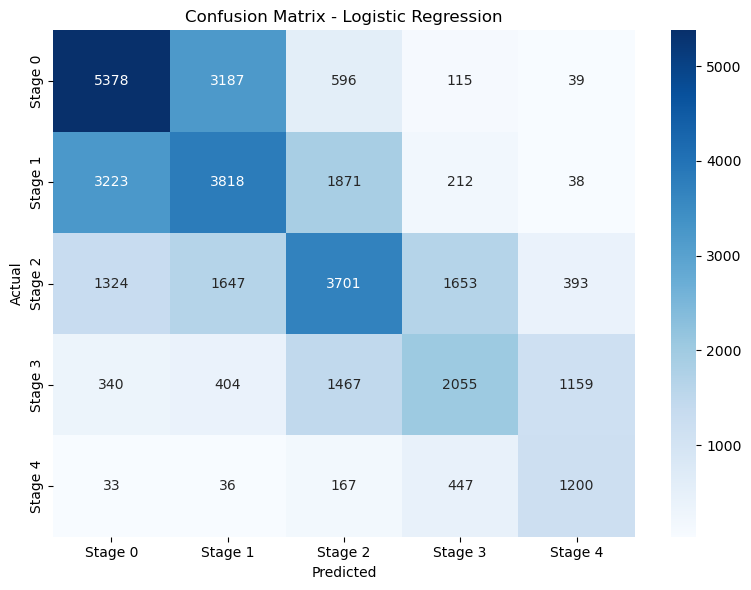

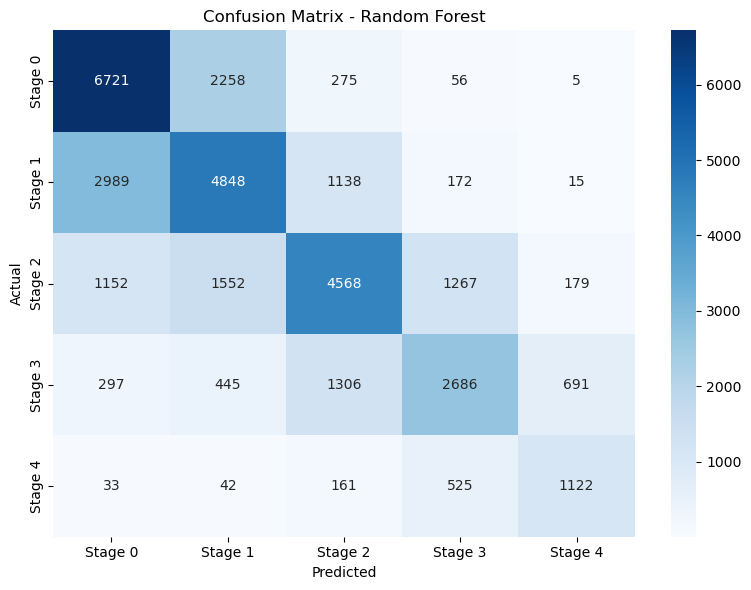

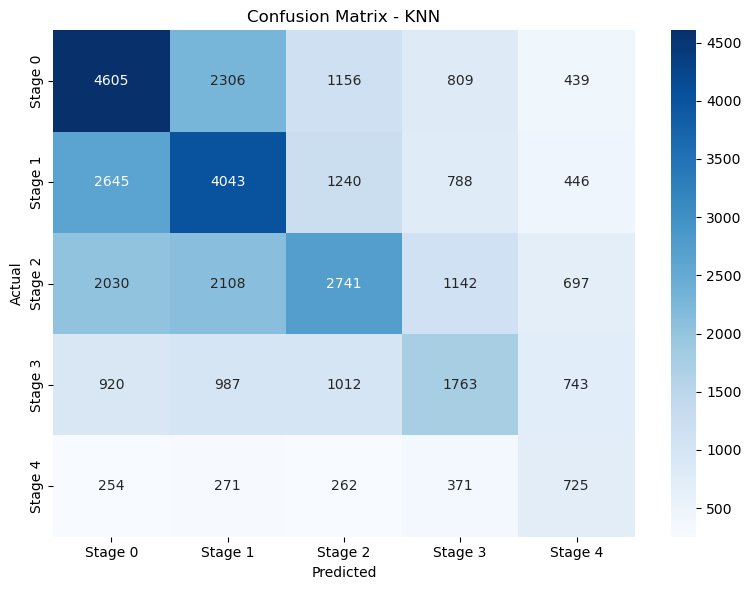

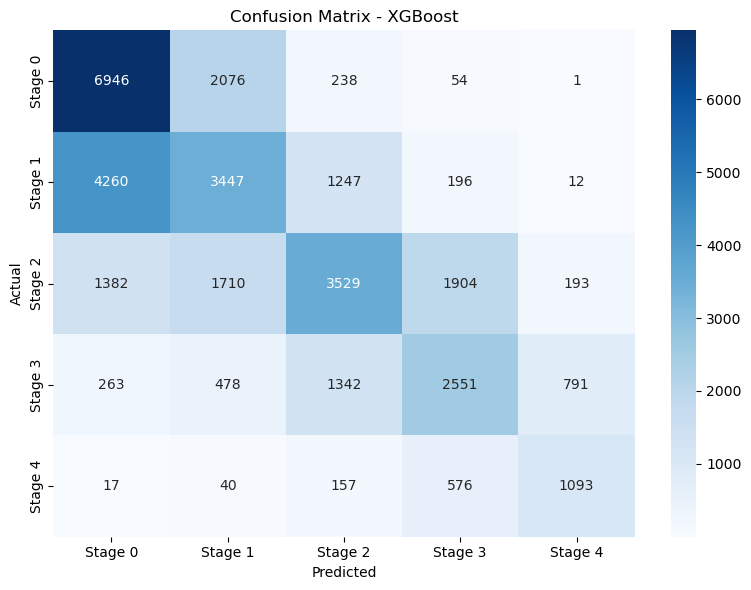

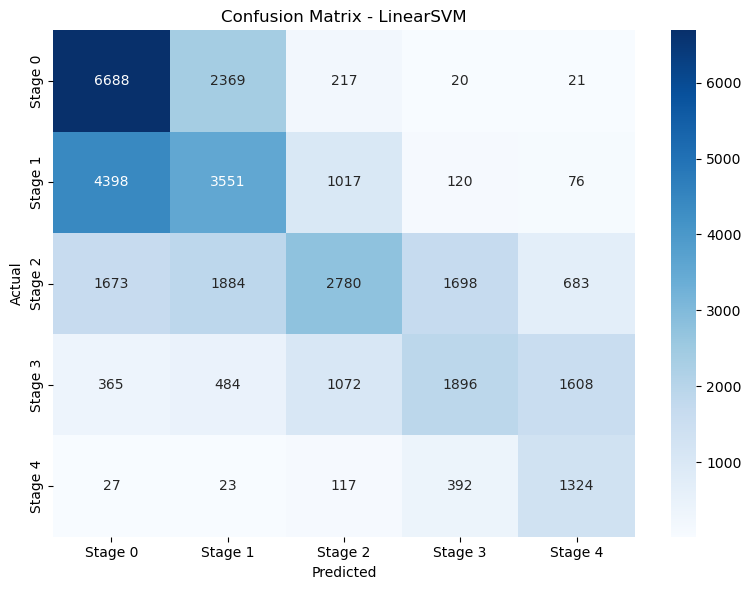

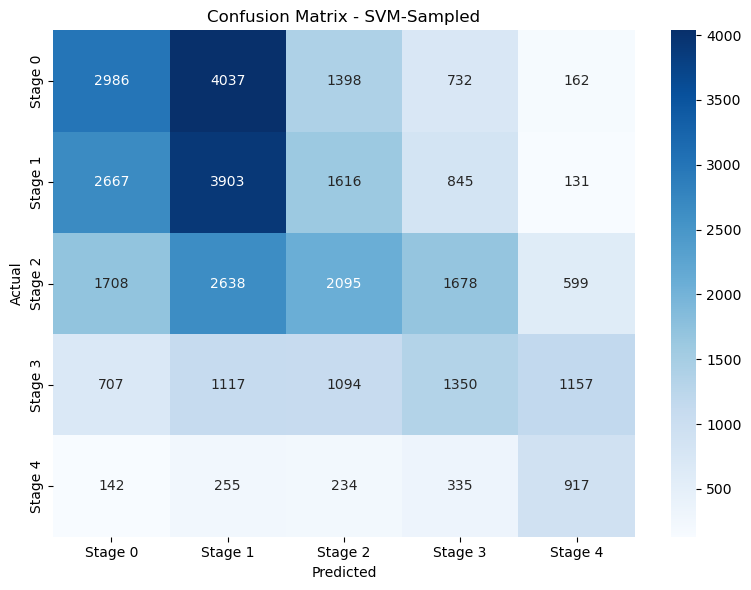

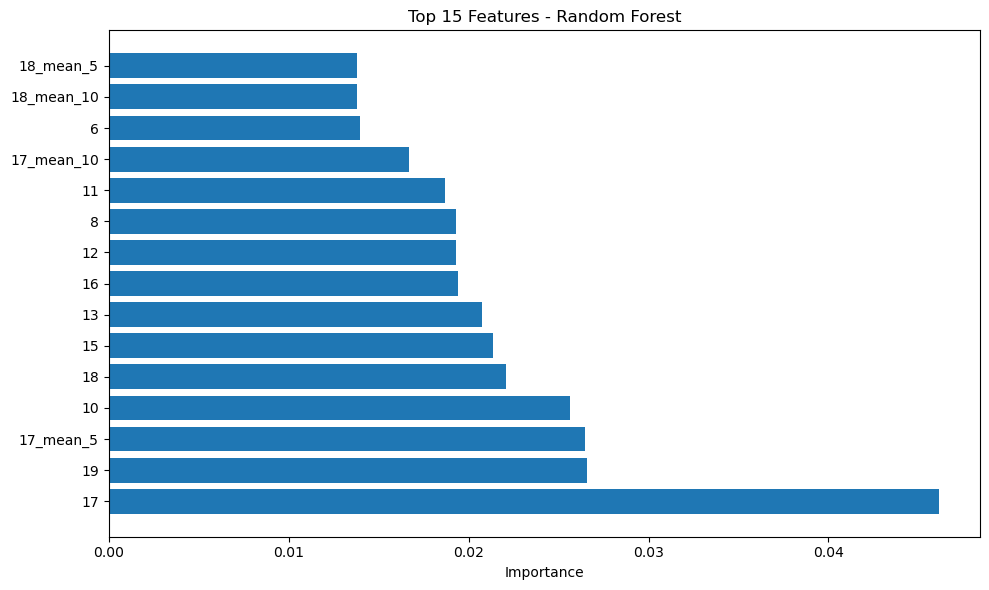


Top 15 Features for Random Forest:
17: 0.0461
19: 0.0266
17_mean_5: 0.0265
10: 0.0257
18: 0.0221
15: 0.0213
13: 0.0207
16: 0.0194
12: 0.0193
8: 0.0193
11: 0.0187
17_mean_10: 0.0167
6: 0.0140
18_mean_10: 0.0138
18_mean_5: 0.0138


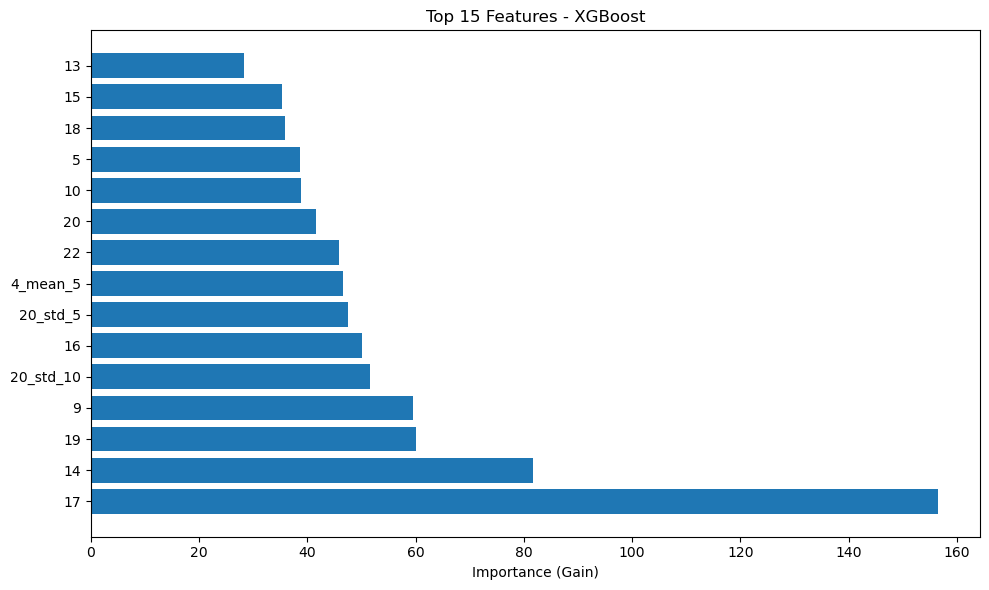


Top 15 Features for XGBoost:
17: 156.4669
14: 81.7887
19: 60.1352
9: 59.4714
20_std_10: 51.6656
16: 50.1914
20_std_5: 47.4490
4_mean_5: 46.5032
22: 45.8601
20: 41.5410
10: 38.7959
5: 38.6673
18: 35.9116
15: 35.3314
13: 28.3135


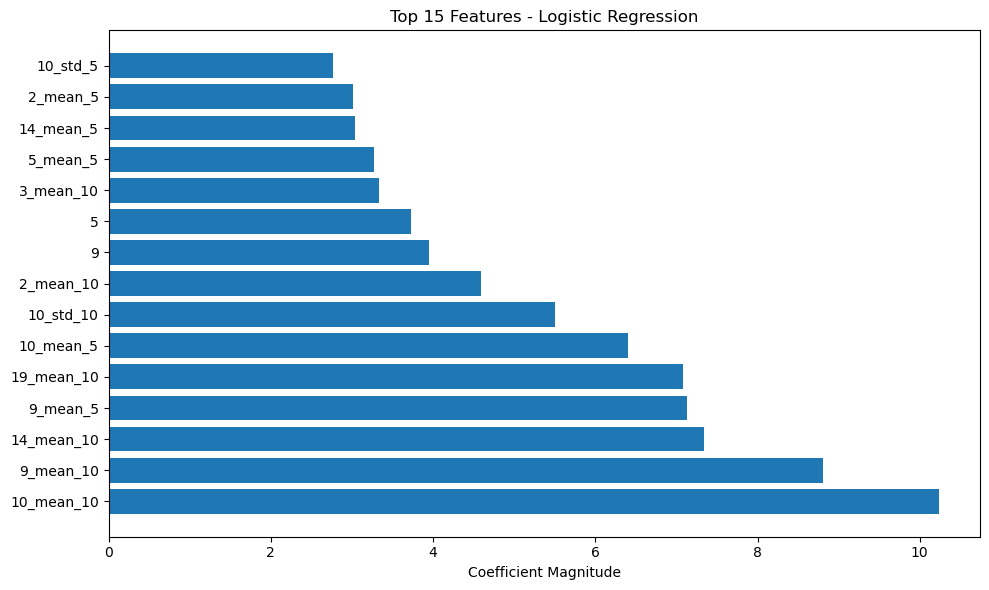


Top 15 Features for Logistic Regression:
10_mean_10: 10.2309
9_mean_10: 8.8113
14_mean_10: 7.3358
9_mean_5: 7.1361
19_mean_10: 7.0853
10_mean_5: 6.4017
10_std_10: 5.5065
2_mean_10: 4.5903
9: 3.9551
5: 3.7267
3_mean_10: 3.3343
5_mean_5: 3.2671
14_mean_5: 3.0420
2_mean_5: 3.0083
10_std_5: 2.7665

Best model for Dataset 2 & 4: Random Forest

Phase 2 Classification: All Datasets
Preparing data with optimized pipeline...
Total samples: 160359
Features: 120
Stage distribution: {0: 45376, 1: 44667, 2: 40673, 3: 22648, 4: 6995}
Applying SMOTE to balance classes...
SMOTE: 112251 samples → 158815 samples
Creating reduced dataset for SVM training (3000 samples)...
Training Logistic Regression...
Logistic Regression: Acc=0.4636, F1=0.4610
Logistic Regression (Critical Stages): Acc=0.4123, F1=0.4938
Training Random Forest...
Random Forest: Acc=0.6549, F1=0.6523
Random Forest (Critical Stages): Acc=0.6206, F1=0.7144
Training KNN...
KNN: Acc=0.4859, F1=0.4850
KNN (Critical Stages): Acc=0.4703, F1=0.

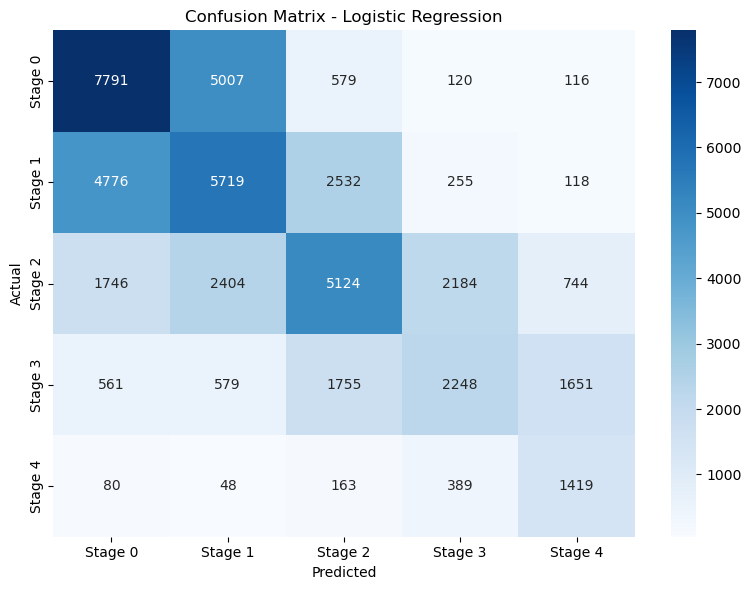

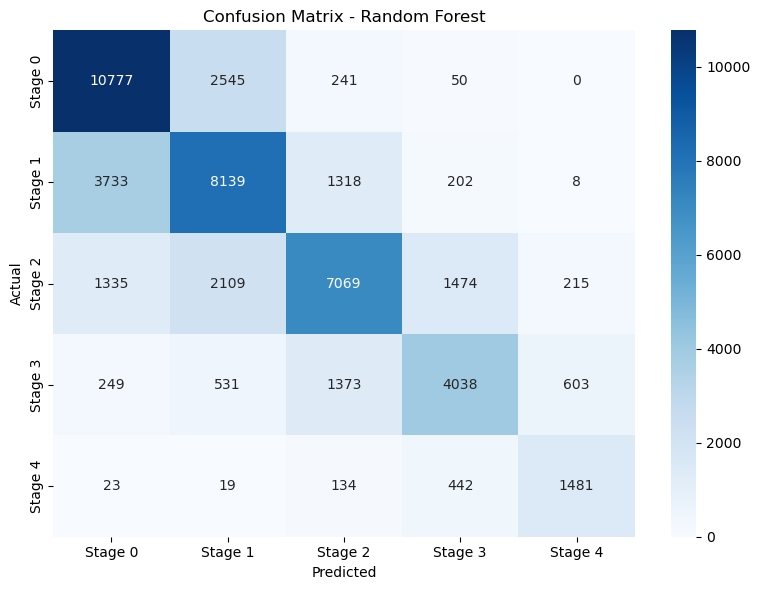

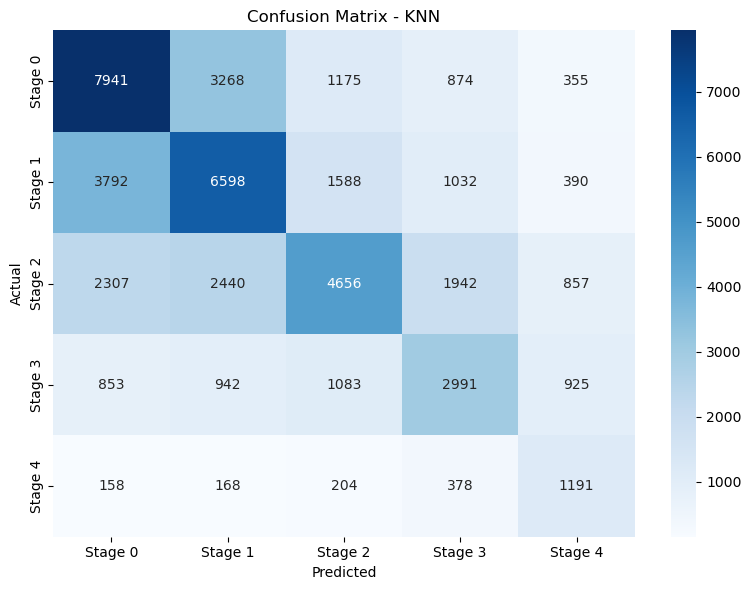

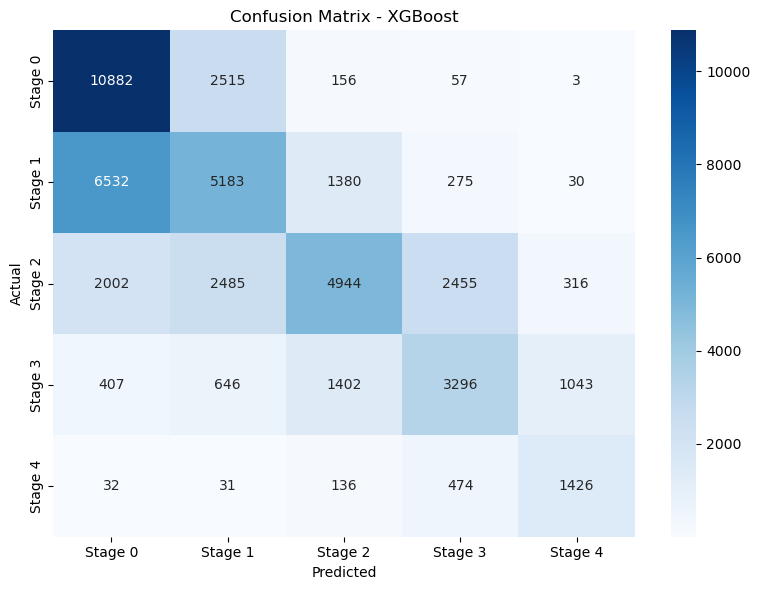

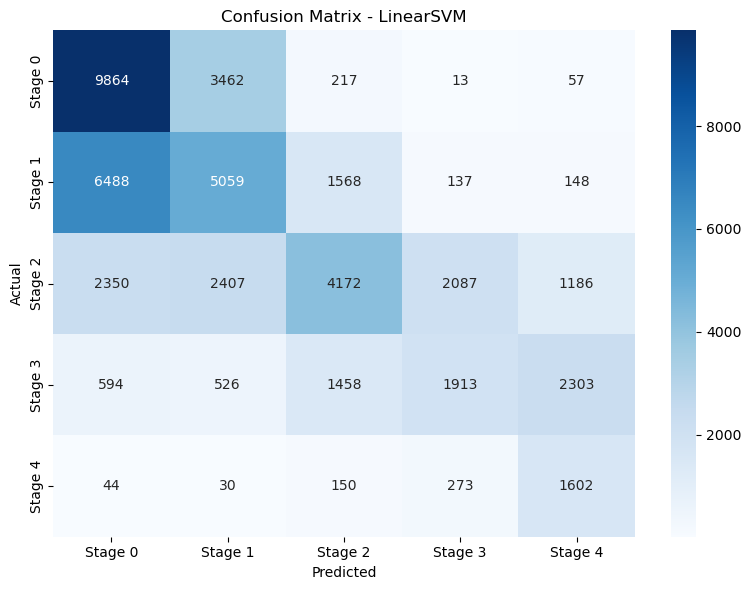

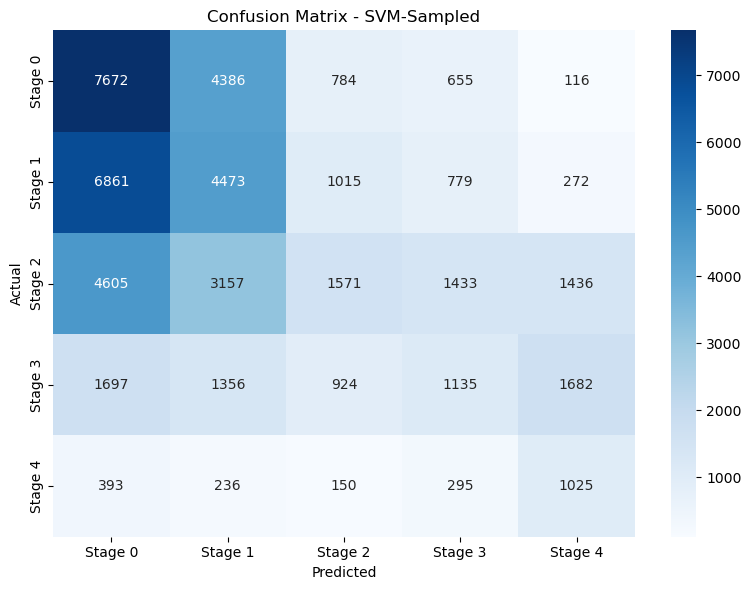

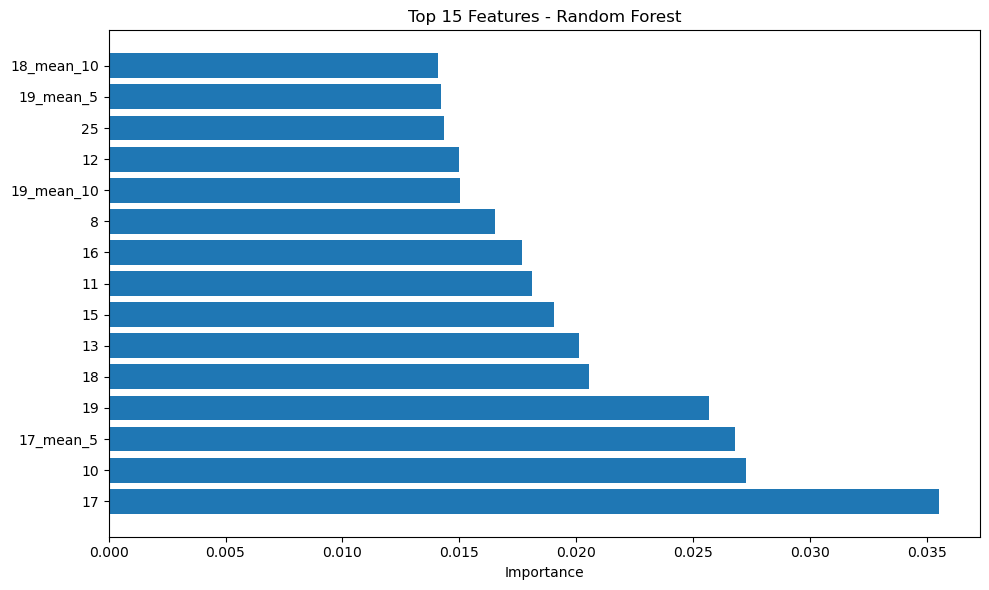


Top 15 Features for Random Forest:
17: 0.0355
10: 0.0273
17_mean_5: 0.0268
19: 0.0257
18: 0.0206
13: 0.0201
15: 0.0191
11: 0.0181
16: 0.0177
8: 0.0165
19_mean_10: 0.0150
12: 0.0150
25: 0.0143
19_mean_5: 0.0142
18_mean_10: 0.0141


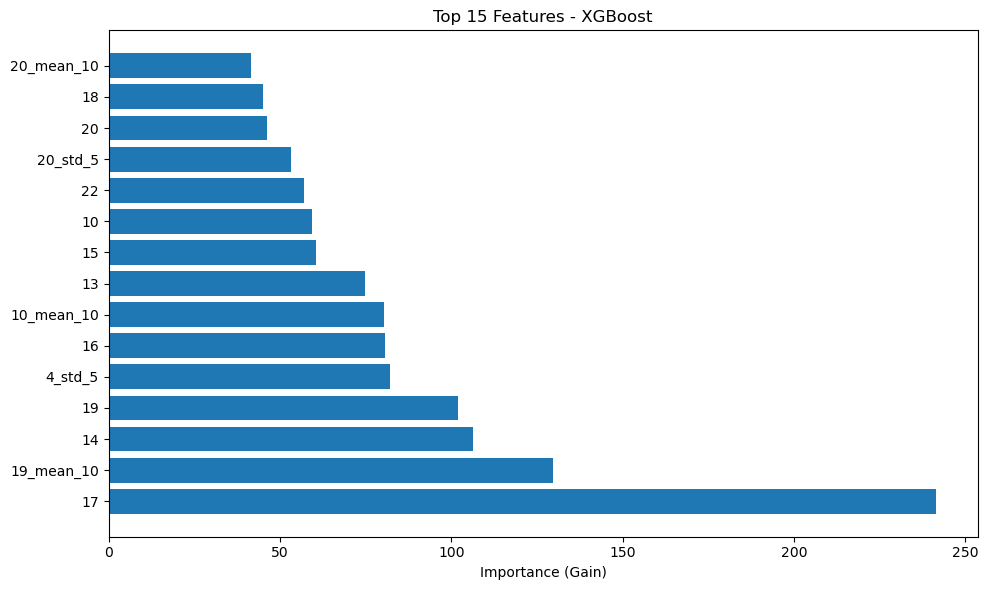


Top 15 Features for XGBoost:
17: 241.5087
19_mean_10: 129.6115
14: 106.2684
19: 101.9049
4_std_5: 82.0771
16: 80.5408
10_mean_10: 80.2796
13: 74.7138
15: 60.4582
10: 59.2767
22: 57.0013
20_std_5: 53.2069
20: 46.2684
18: 45.0122
20_mean_10: 41.6114


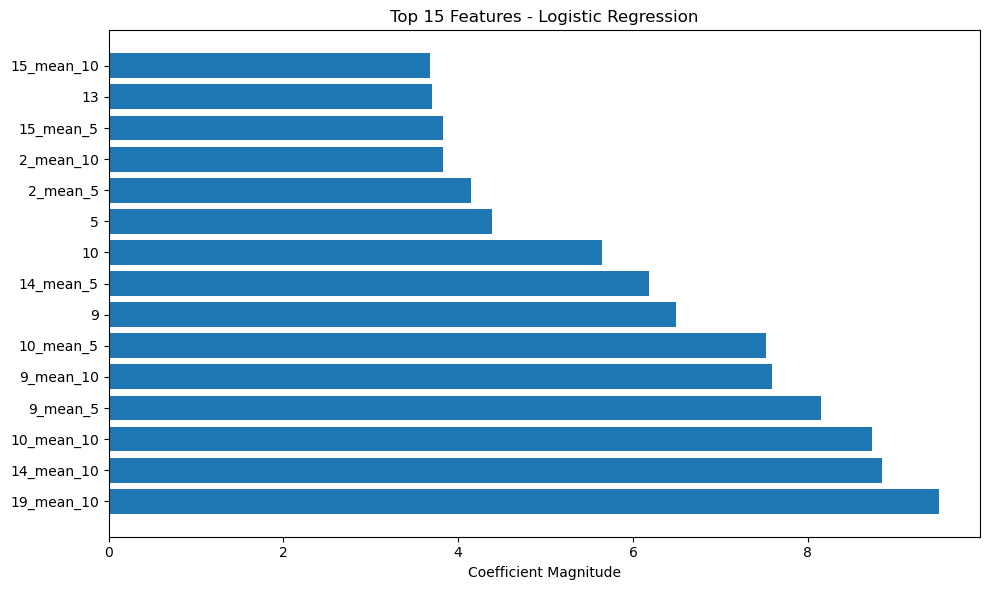


Top 15 Features for Logistic Regression:
19_mean_10: 9.4965
14_mean_10: 8.8513
10_mean_10: 8.7371
9_mean_5: 8.1525
9_mean_10: 7.5925
10_mean_5: 7.5240
9: 6.4888
14_mean_5: 6.1822
10: 5.6421
5: 4.3879
2_mean_5: 4.1459
2_mean_10: 3.8288
15_mean_5: 3.8216
13: 3.6971
15_mean_10: 3.6832

Best model for All Datasets: Random Forest


In [22]:
# Define cluster-to-stage mappings
cluster_mappings = {
    'Dataset 1': {
        0: 2,  # Moderately Degraded
        1: 1,  # Slightly Degraded
        2: 4,  # Failure
        3: 0,  # Normal
        4: 3   # Critical
    },
    'Dataset 1 & 3': {
        0: 1,  # Slightly Degraded
        1: 4,  # Failure
        2: 3,  # Critical
        3: 0,  # Normal
        4: 2   # Moderately Degraded
    },
    'Dataset 2 & 4': {
        0: 2,  # Moderately Degraded
        1: 4,  # Failure
        2: 1,  # Slightly Degraded
        3: 0,  # Normal
        4: 3   # Critical
    },
    'All Datasets': {
        0: 3,  # Critical
        1: 2,  # Moderately Degraded
        2: 4,  # Failure
        3: 1,  # Slightly Degraded
        4: 0   # Normal
    }
}

results_1, best_model_1 = run_phase2_optimized('Dataset 1', df1_cluster_T, cluster_mappings['Dataset 1'], skip_svm=False)
results_13, best_model_13 = run_phase2_optimized('Dataset 1 & 3', df13_cluster_T, cluster_mappings['Dataset 1 & 3'], skip_svm=False)
results_24, best_model_24 = run_phase2_optimized('Dataset 2 & 4', df24_cluster_T, cluster_mappings['Dataset 2 & 4'], skip_svm=False)
results_all, best_model_all = run_phase2_optimized('All Datasets', df_all_cluster_T, cluster_mappings['All Datasets'], skip_svm=False)

In [ ]:
# Final comparison
print("\n" + "="*80)
print(f"{'PHASE 2 SUMMARY: BEST MODELS ACROSS DATASETS':^80}")
print("="*80)
print(f"{'Dataset':<15} {'Best Model':<20} {'Overall F1':<12} {'Critical F1':<12}")
print("-"*80)

dataset_results = [
    ('Dataset 1', results_1, best_model_1),
    ('Dataset 1 & 3', results_13, best_model_13),
    ('Dataset 2 & 4', results_24, best_model_24),
    ('All Datasets', results_all, best_model_all)
]

for dataset_name, results, best_model in dataset_results:
    critical_f1 = results[best_model].get('critical_f1', 'N/A')
    critical_f1_str = f"{critical_f1:.4f}" if isinstance(critical_f1, float) else critical_f1
    print(f"{dataset_name:<15} {best_model:<20} {results[best_model]['f1_score']:.4f} {critical_f1_str}")

print("="*80)


                  PHASE 2 SUMMARY: BEST MODELS ACROSS DATASETS                  
Dataset         Best Model           Overall F1   Critical F1 
--------------------------------------------------------------------------------
Dataset 1       KNN                  0.8490 0.9128
Dataset 1 & 3   KNN                  0.8142 0.9608
Dataset 2 & 4   Random Forest        0.5752 0.6182
All Datasets    Random Forest        0.6523 0.7144


# Phase 3

In [23]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import time

In [24]:
def prepare_regression_data(df, cluster_to_stage_map):
    """
    Prepare data for regression by calculating time-to-next-stage for each data point
    """
    print(f"Preparing regression data...")

    # Map clusters to stages (reusing from Phase 2)
    df_copy = df.copy()
    df_copy['stage'] = df_copy['cluster'].map(cluster_to_stage_map)

    # Select sensor columns efficiently
    sensor_cols = [col for col in df_copy.columns if isinstance(col, int) and col not in [0, 1]]

    # Add rolling statistics with optimized function from Phase 2
    df_enhanced = add_rolling_features(df_copy, sensor_cols)

    # Get feature columns efficiently (reusing from Phase 2)
    feature_cols = [col for col in df_enhanced.columns
                   if (isinstance(col, int) and col not in [0, 1]) or
                      (isinstance(col, str) and col not in ['cluster', 'stage', 'time_to_next_stage'] and ('mean' in col or 'std' in col))]

    # Calculate time-to-next-stage for each unit
    print("Calculating time-to-next-stage for each unit...")
    df_enhanced['time_to_next_stage'] = np.nan

    # For each unit
    for unit in df_enhanced[0].unique():
        unit_data = df_enhanced[df_enhanced[0] == unit].copy()

        # Sort by cycle
        unit_data = unit_data.sort_values(by=1)

        # Get the stages for this unit
        stages = unit_data['stage'].values

        # For each cycle
        for i in range(len(stages)):
            current_stage = stages[i]

            # Find the next higher stage after this point
            next_stage_indices = np.where(stages[i:] > current_stage)[0]

            if len(next_stage_indices) > 0:
                # Next stage exists, calculate remaining cycles
                next_stage_idx = next_stage_indices[0] + i
                remaining_cycles = next_stage_idx - i
                unit_data.iloc[i, unit_data.columns.get_loc('time_to_next_stage')] = remaining_cycles
            else:
                # No next stage (at max stage or already at end of life)
                # Set a default value or keep as NaN
                if current_stage == 4:  # Already at failure stage
                    unit_data.iloc[i, unit_data.columns.get_loc('time_to_next_stage')] = 0
                else:
                    # Not at failure but won't reach a higher stage
                    # Set to remaining cycles until end of life
                    remaining_cycles = len(stages) - i - 1
                    unit_data.iloc[i, unit_data.columns.get_loc('time_to_next_stage')] = remaining_cycles

        # Update the main dataframe
        df_enhanced.loc[df_enhanced[0] == unit, 'time_to_next_stage'] = unit_data['time_to_next_stage'].values

    # Filter out rows with NaN target values
    df_enhanced = df_enhanced.dropna(subset=['time_to_next_stage'])

    # Print information
    print(f"Total samples for regression: {len(df_enhanced)}")
    print(f"Features: {len(feature_cols)}")

    # Create X (features) and y (target) for regression
    X = df_enhanced[feature_cols].values
    y = df_enhanced['time_to_next_stage'].values

    # Calculate statistics on target variable
    print(f"Target variable (time_to_next_stage) statistics:")
    print(f"  Min: {y.min():.0f} cycles")
    print(f"  Max: {y.max():.0f} cycles")
    print(f"  Mean: {y.mean():.2f} cycles")
    print(f"  Median: {np.median(y):.0f} cycles")

    # Plot histogram of time-to-next-stage
    plt.figure(figsize=(10, 6))
    plt.hist(y, bins=50, color='skyblue', edgecolor='black')
    plt.title('Distribution of Time-to-Next-Stage')
    plt.xlabel('Cycles Remaining Until Next Stage')
    plt.ylabel('Frequency')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42
    )

    # Scale features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    return X_train, X_test, y_train, y_test, feature_cols

def train_and_evaluate_regressor(model, X_train, y_train, X_test, y_test, model_name, feature_cols=None):
    """
    Train and evaluate a regression model
    """
    print(f"\nTraining {model_name}...")
    start_time = time.time()

    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Training time
    training_time = time.time() - start_time

    print(f"{model_name} Results:")
    print(f"  RMSE: {rmse:.2f} cycles")
    print(f"  MAE: {mae:.2f} cycles")
    print(f"  R² Score: {r2:.4f}")
    print(f"  Training Time: {training_time:.2f} seconds")

    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
    plt.title(f'{model_name}: Actual vs Predicted')
    plt.xlabel('Actual Time-to-Next-Stage (cycles)')
    plt.ylabel('Predicted Time-to-Next-Stage (cycles)')
    plt.tight_layout()
    plt.show()

    # Plot error distribution
    errors = y_pred - y_test
    plt.figure(figsize=(10, 6))
    plt.hist(errors, bins=50, color='skyblue', edgecolor='black')
    plt.title(f'{model_name}: Error Distribution')
    plt.xlabel('Prediction Error (cycles)')
    plt.ylabel('Frequency')
    plt.axvline(x=0, color='r', linestyle='--')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Feature importance for tree-based models
    if hasattr(model, 'feature_importances_') and feature_cols is not None:
        # Get top 15 features
        importances = model.feature_importances_
        indices = np.argsort(importances)[-15:][::-1]

        # Convert feature indices to feature names
        feature_names = [str(feature_cols[i]) for i in indices]

        plt.figure(figsize=(10, 6))
        plt.title(f'Top 15 Feature Importances - {model_name}')
        plt.barh(range(len(indices)), importances[indices])
        plt.yticks(range(len(indices)), feature_names)
        plt.xlabel('Relative Importance')
        plt.tight_layout()
        plt.show()

    # Return results
    return {
        'model': model,
        'rmse': rmse,
        'mae': mae,
        'r2': r2,
        'training_time': training_time,
        'predictions': y_pred
    }

def run_phase3_regression(dataset_name, df, cluster_to_stage_map):
    """
    Run Phase 3 regression for a dataset
    """
    print(f"\n{'='*50}")
    print(f"Phase 3 Regression: {dataset_name}")
    print(f"{'='*50}")

    # Prepare regression data
    X_train, X_test, y_train, y_test, feature_cols = prepare_regression_data(df, cluster_to_stage_map)

    # Initialize regression models
    regression_models = {
        'Ridge Regression': Ridge(alpha=1.0, random_state=42),

        'Random Forest Regressor': RandomForestRegressor(
            n_estimators=100,
            max_depth=None,
            min_samples_split=2,
            min_samples_leaf=1,
            n_jobs=-1,
            random_state=42
        ),

        'SVR': SVR(
            kernel='rbf',
            C=1.0,
            epsilon=0.1,
            gamma='scale',
            cache_size=1000
        )
    }

    # Train and evaluate each model
    results = {}
    for name, model in regression_models.items():
        # Pass feature_cols to the training function
        results[name] = train_and_evaluate_regressor(
            model, X_train, y_train, X_test, y_test, name, feature_cols
        )

    # Determine best model based on RMSE
    best_model_name = min(results.items(), key=lambda x: x[1]['rmse'])[0]

    print(f"\nBest regression model for {dataset_name}: {best_model_name}")
    print(f"  RMSE: {results[best_model_name]['rmse']:.2f} cycles")

    return results, best_model_name

def plot_regression_comparison(results_dict):
    """
    Compare regression models across datasets
    """
    # Prepare data for plotting
    datasets = list(results_dict.keys())
    model_names = list(results_dict[datasets[0]].keys())

    # Plot RMSE comparison
    plt.figure(figsize=(12, 6))
    bar_width = 0.25
    positions = np.arange(len(datasets))

    for i, model in enumerate(model_names):
        rmse_values = [results_dict[dataset][model]['rmse'] for dataset in datasets]
        plt.bar(positions + i*bar_width, rmse_values, width=bar_width, label=model)

    plt.title('RMSE Comparison Across Datasets')
    plt.xlabel('Dataset')
    plt.ylabel('RMSE (cycles)')
    plt.xticks(positions + bar_width, datasets)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot R² comparison
    plt.figure(figsize=(12, 6))

    for i, model in enumerate(model_names):
        r2_values = [results_dict[dataset][model]['r2'] for dataset in datasets]
        plt.bar(positions + i*bar_width, r2_values, width=bar_width, label=model)

    plt.title('R² Score Comparison Across Datasets')
    plt.xlabel('Dataset')
    plt.ylabel('R² Score')
    plt.xticks(positions + bar_width, datasets)
    plt.legend()
    plt.tight_layout()
    plt.show()


Phase 3 Regression: Dataset 1
Preparing regression data...
Calculating time-to-next-stage for each unit...
Total samples for regression: 20631
Features: 85
Target variable (time_to_next_stage) statistics:
  Min: 0 cycles
  Max: 65 cycles
  Mean: 24.31 cycles
  Median: 24 cycles


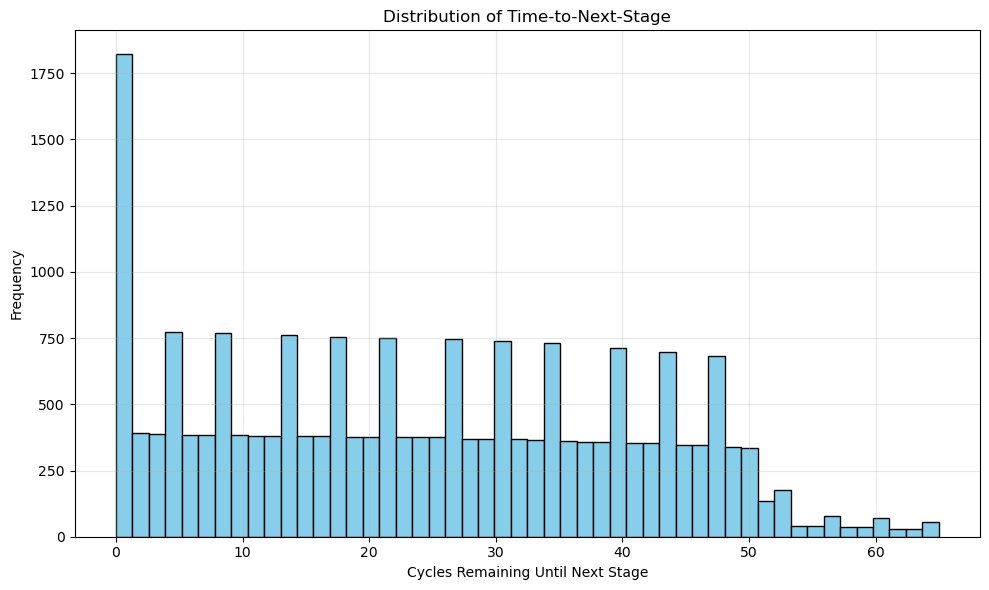


Training Ridge Regression...
Ridge Regression Results:
  RMSE: 14.82 cycles
  MAE: 12.39 cycles
  R² Score: 0.1560
  Training Time: 0.04 seconds


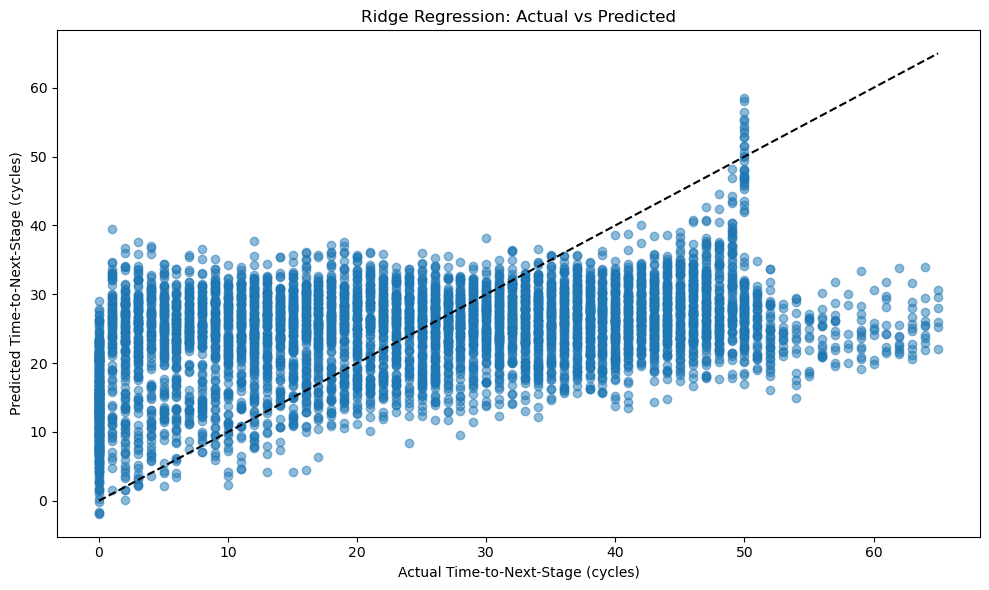

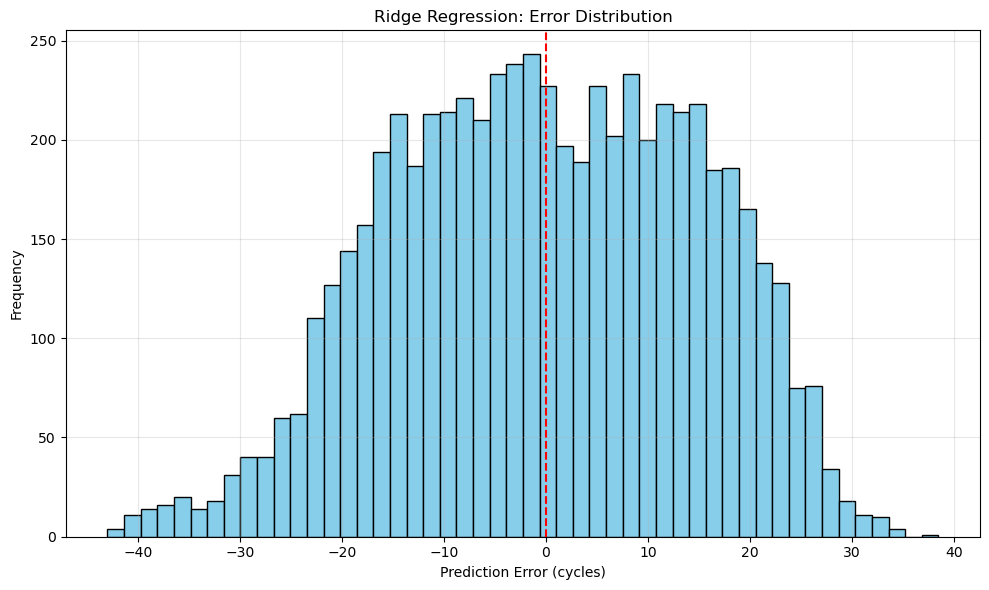


Training Random Forest Regressor...
Random Forest Regressor Results:
  RMSE: 11.54 cycles
  MAE: 9.26 cycles
  R² Score: 0.4884
  Training Time: 5.46 seconds


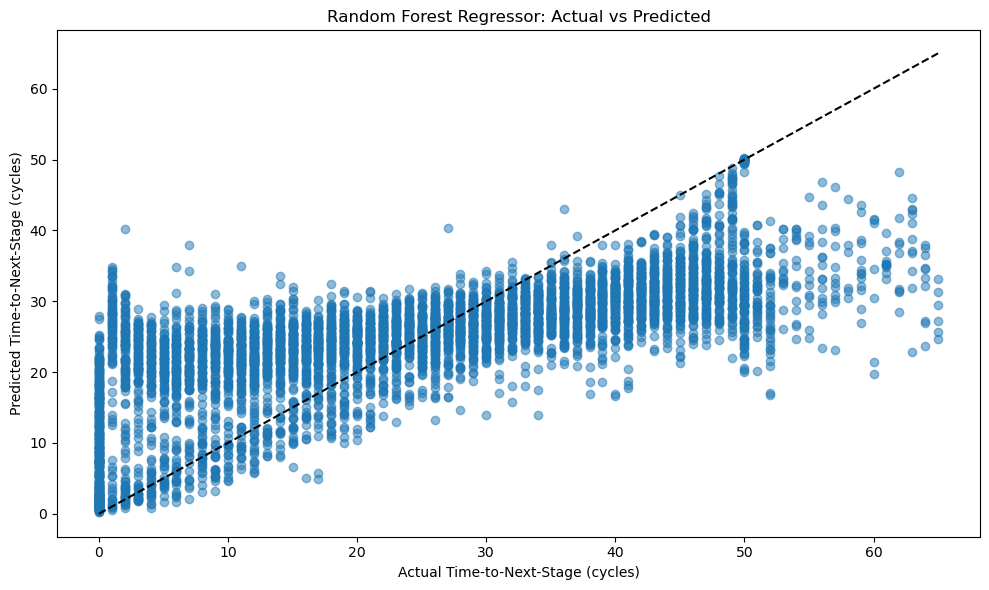

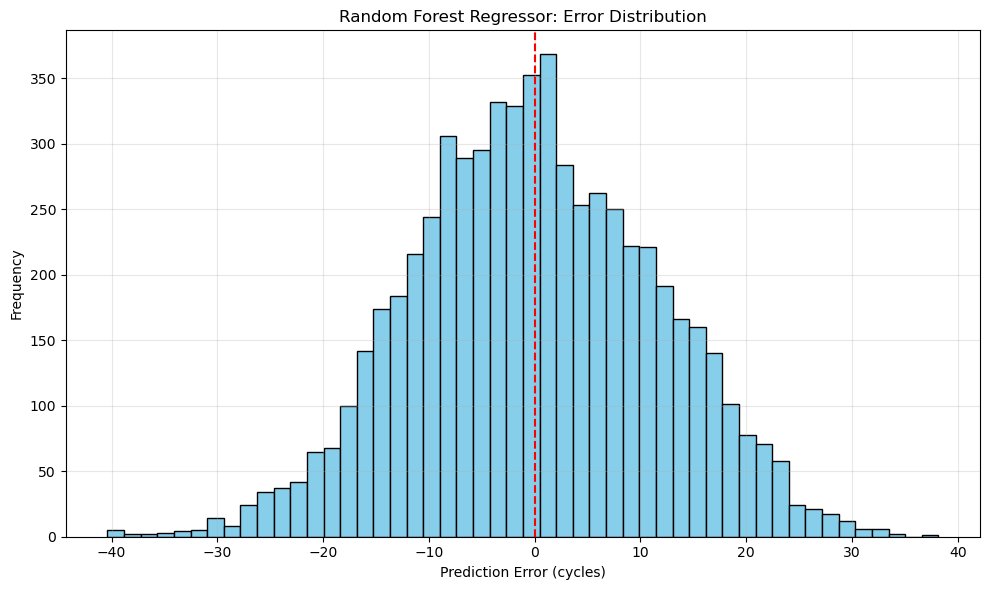

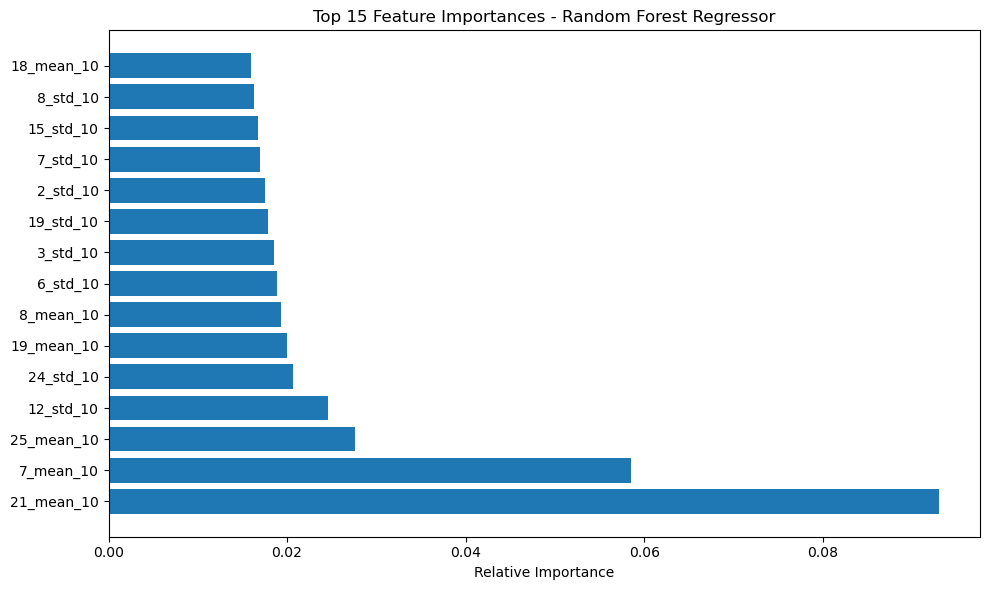


Training SVR...
SVR Results:
  RMSE: 14.25 cycles
  MAE: 11.70 cycles
  R² Score: 0.2191
  Training Time: 9.48 seconds


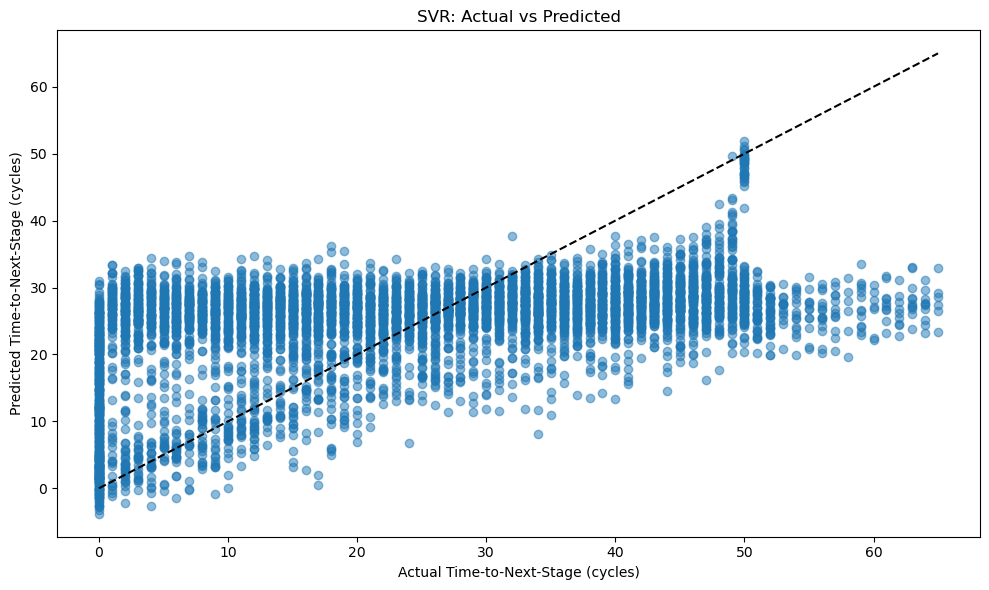

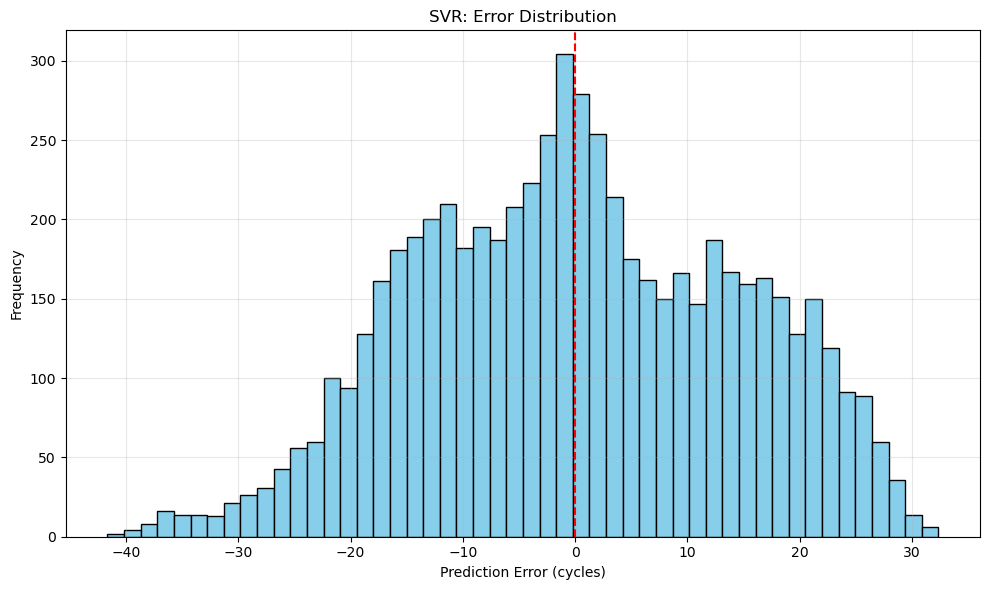


Best regression model for Dataset 1: Random Forest Regressor
  RMSE: 11.54 cycles

Phase 3 Regression: Dataset 1 & 3
Preparing regression data...
Calculating time-to-next-stage for each unit...
Total samples for regression: 45351
Features: 90
Target variable (time_to_next_stage) statistics:
  Min: 0 cycles
  Max: 216 cycles
  Mean: 61.52 cycles
  Median: 60 cycles


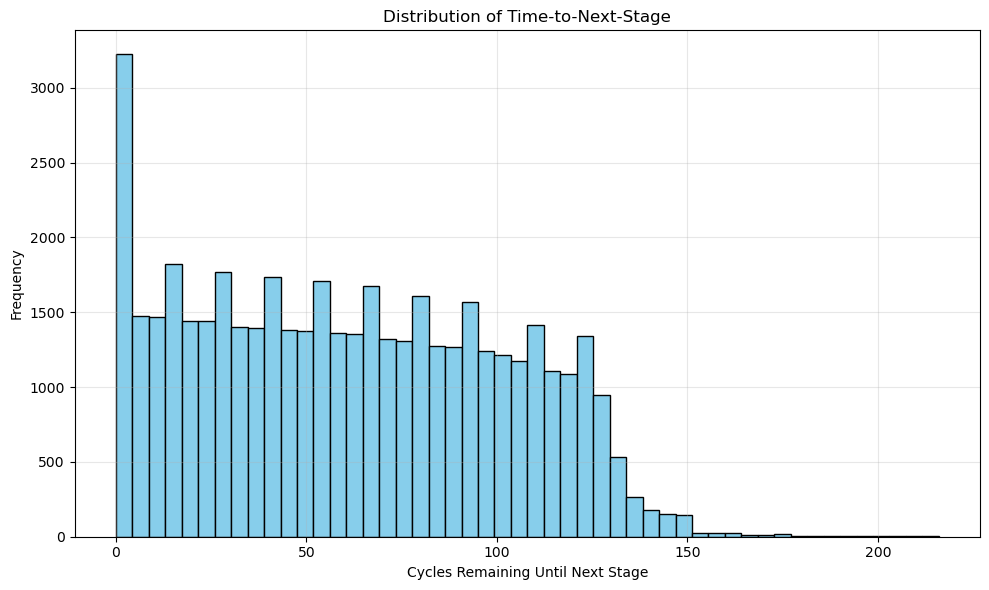


Training Ridge Regression...
Ridge Regression Results:
  RMSE: 37.12 cycles
  MAE: 31.32 cycles
  R² Score: 0.1385
  Training Time: 0.01 seconds


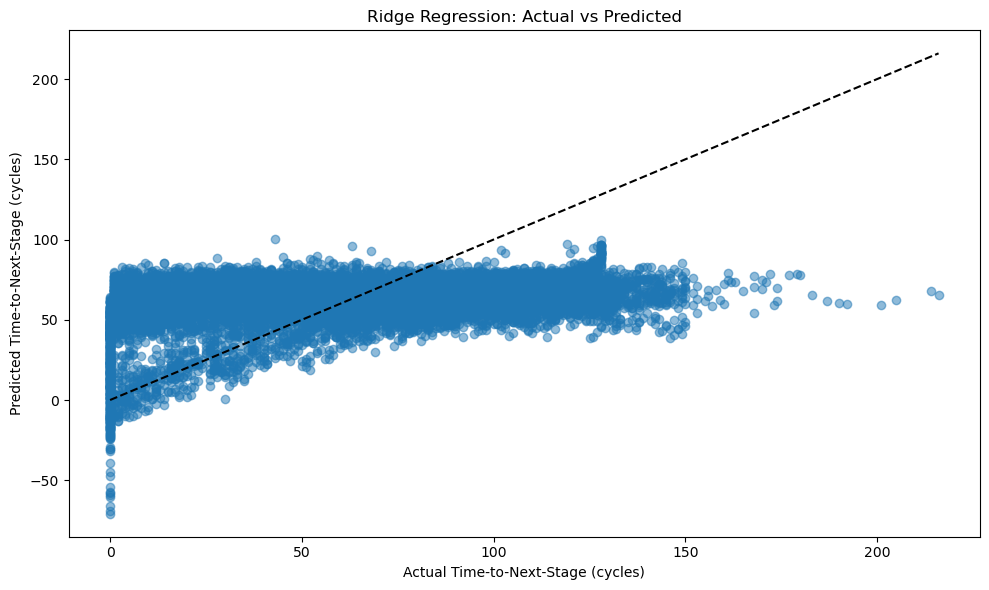

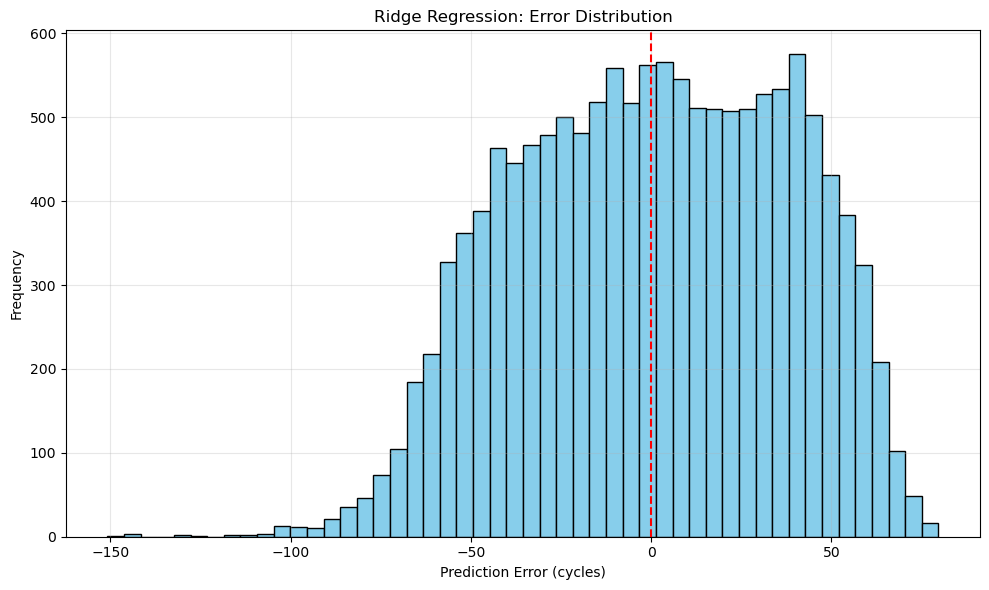


Training Random Forest Regressor...
Random Forest Regressor Results:
  RMSE: 27.97 cycles
  MAE: 22.59 cycles
  R² Score: 0.5111
  Training Time: 13.12 seconds


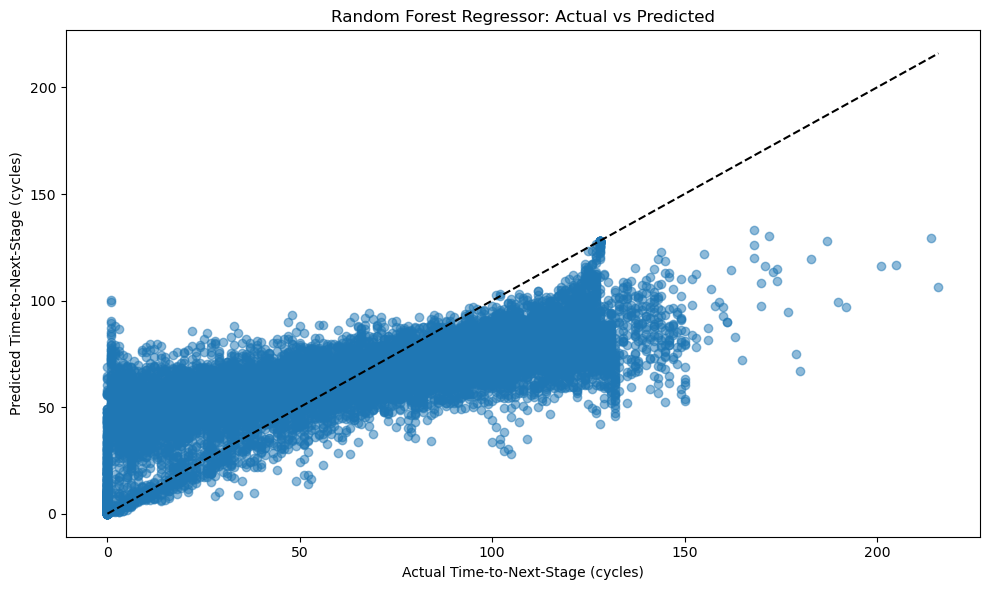

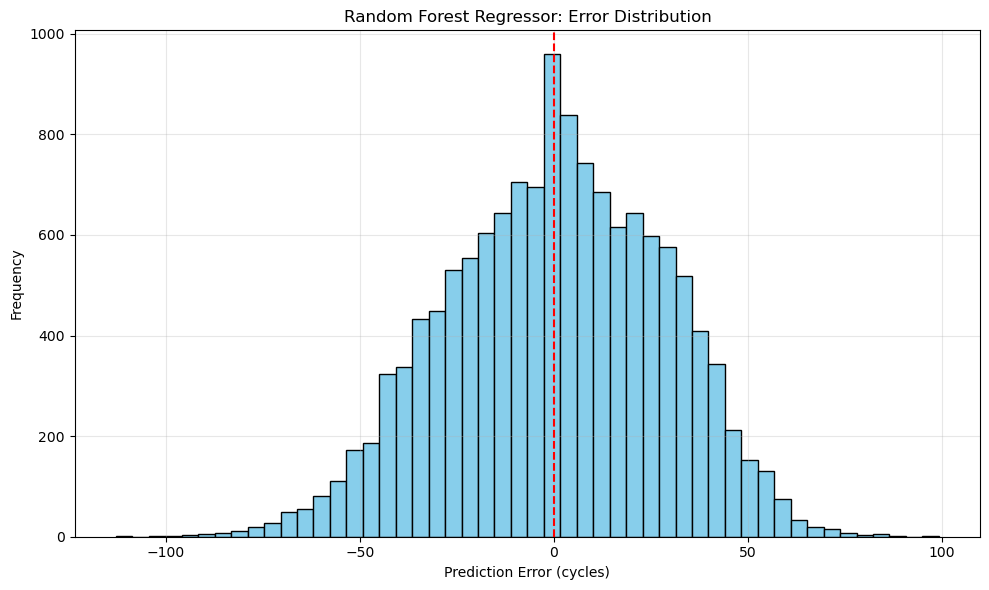

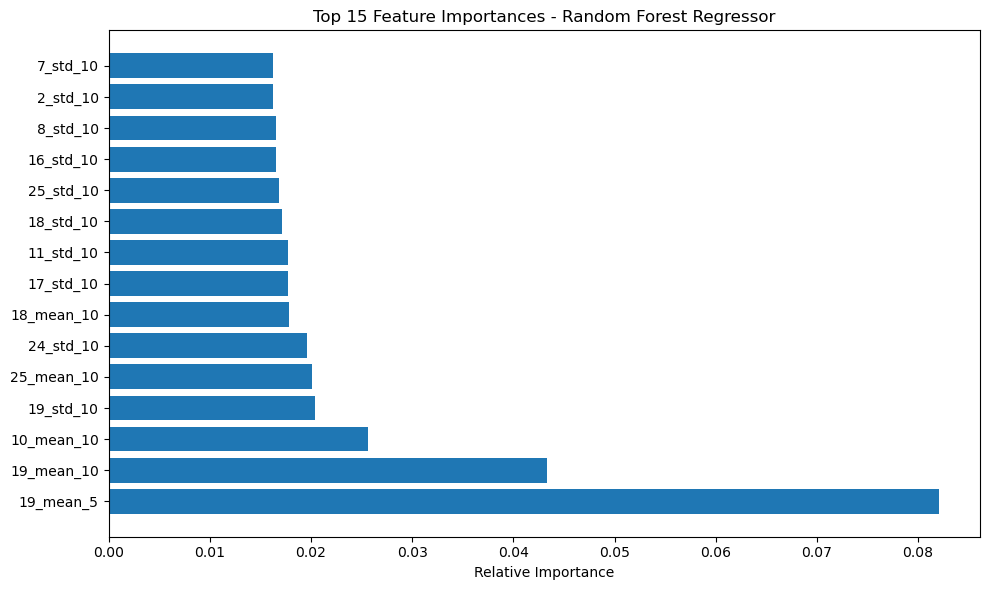


Training SVR...
SVR Results:
  RMSE: 36.78 cycles
  MAE: 30.53 cycles
  R² Score: 0.1543
  Training Time: 59.13 seconds


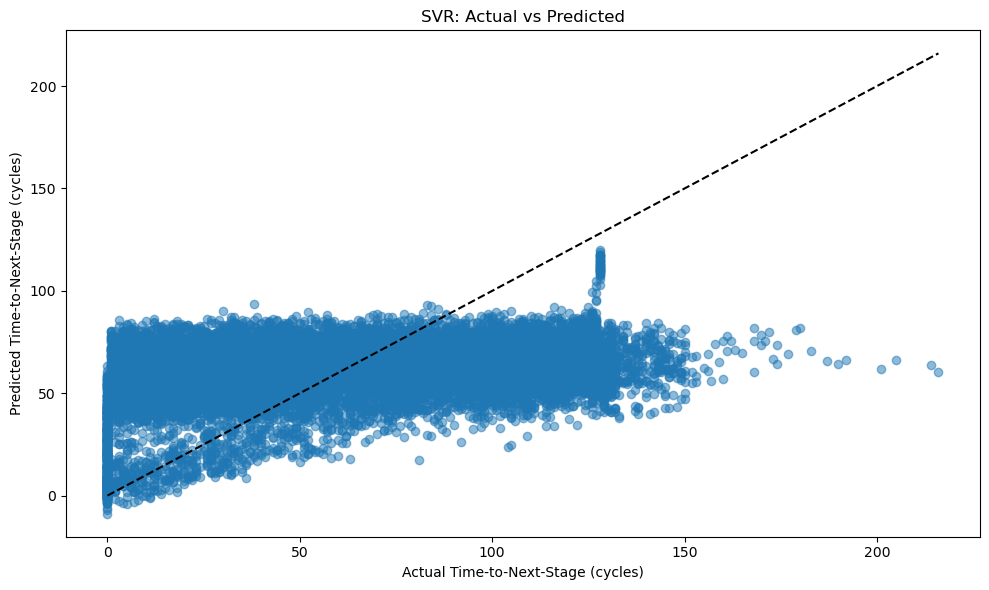

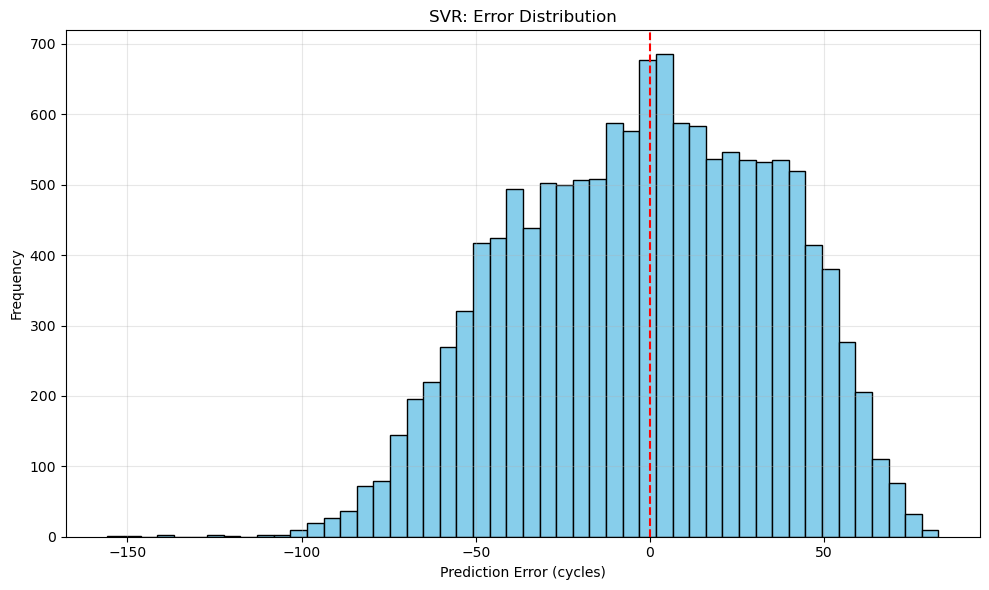


Best regression model for Dataset 1 & 3: Random Forest Regressor
  RMSE: 27.97 cycles

Phase 3 Regression: Dataset 2 & 4
Preparing regression data...
Calculating time-to-next-stage for each unit...
Total samples for regression: 115008
Features: 120
Target variable (time_to_next_stage) statistics:
  Min: 0 cycles
  Max: 166 cycles
  Mean: 55.21 cycles
  Median: 53 cycles


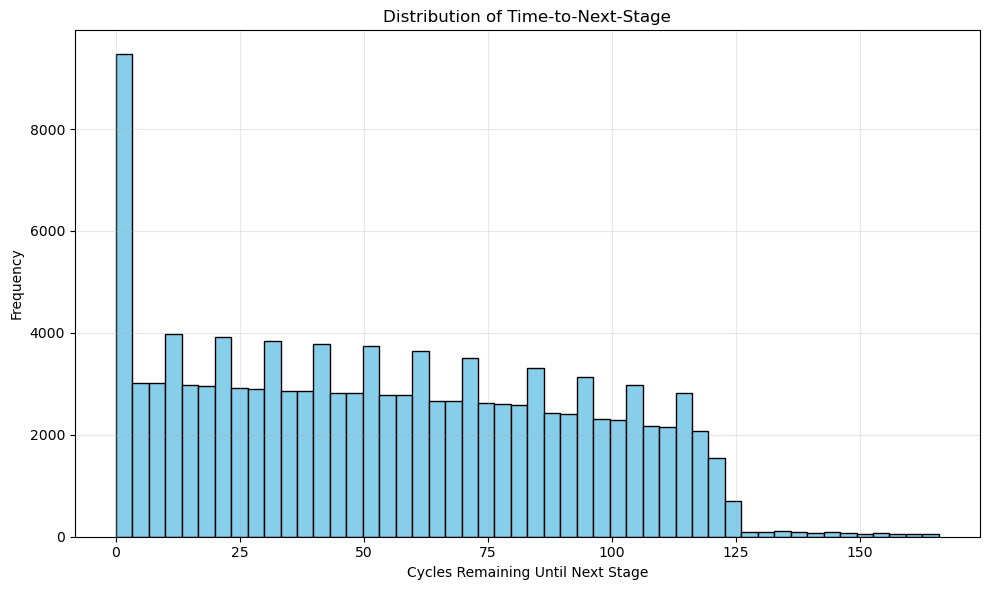


Training Ridge Regression...
Ridge Regression Results:
  RMSE: 34.16 cycles
  MAE: 28.97 cycles
  R² Score: 0.1459
  Training Time: 0.05 seconds


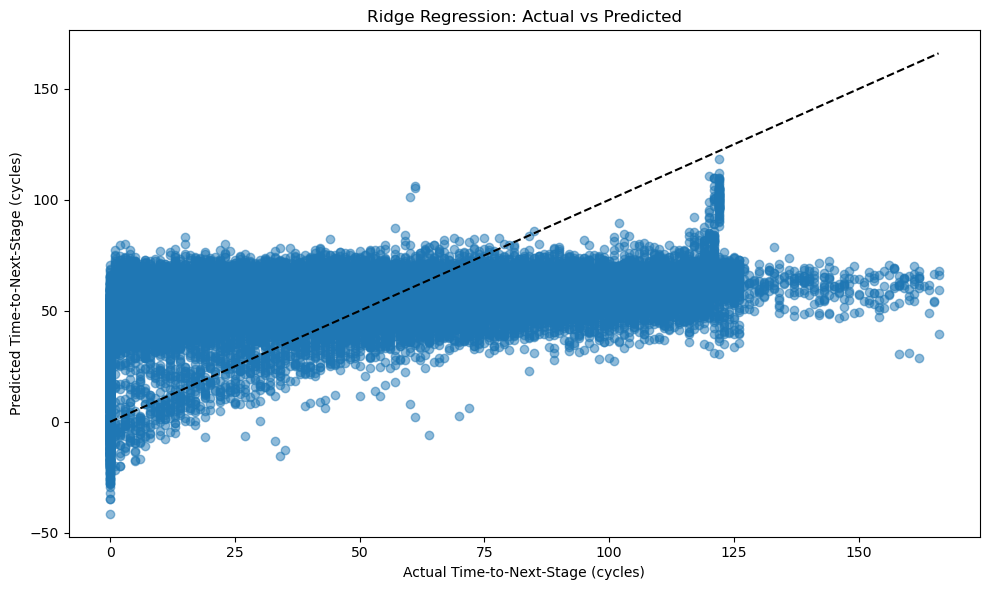

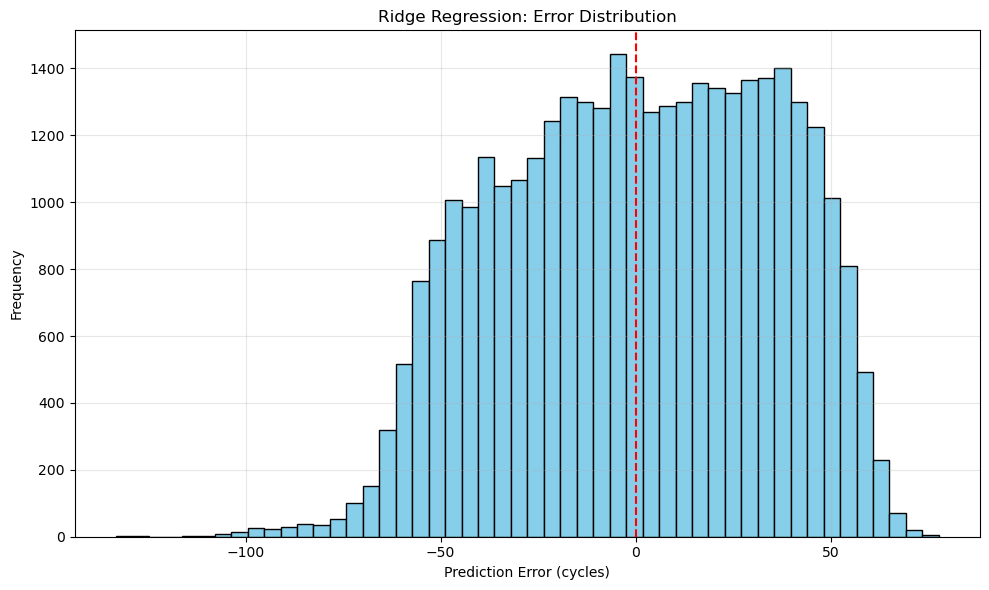


Training Random Forest Regressor...
Random Forest Regressor Results:
  RMSE: 33.98 cycles
  MAE: 28.57 cycles
  R² Score: 0.1548
  Training Time: 76.63 seconds


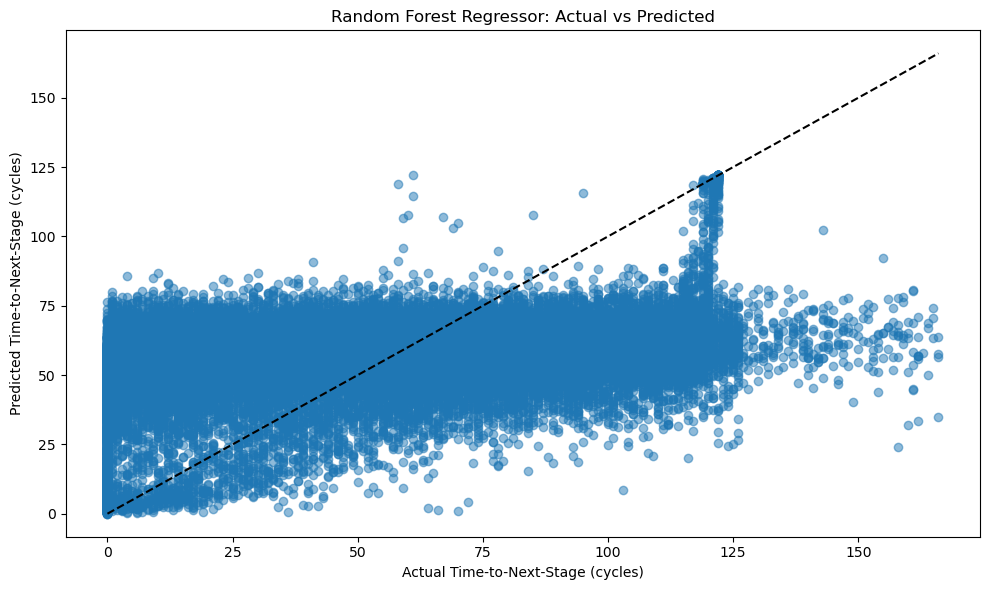

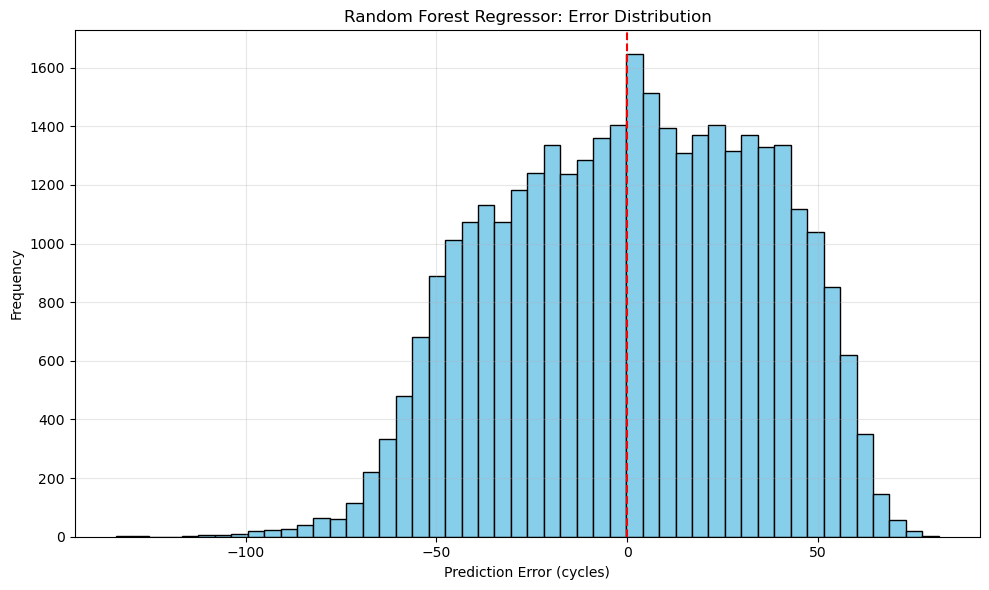

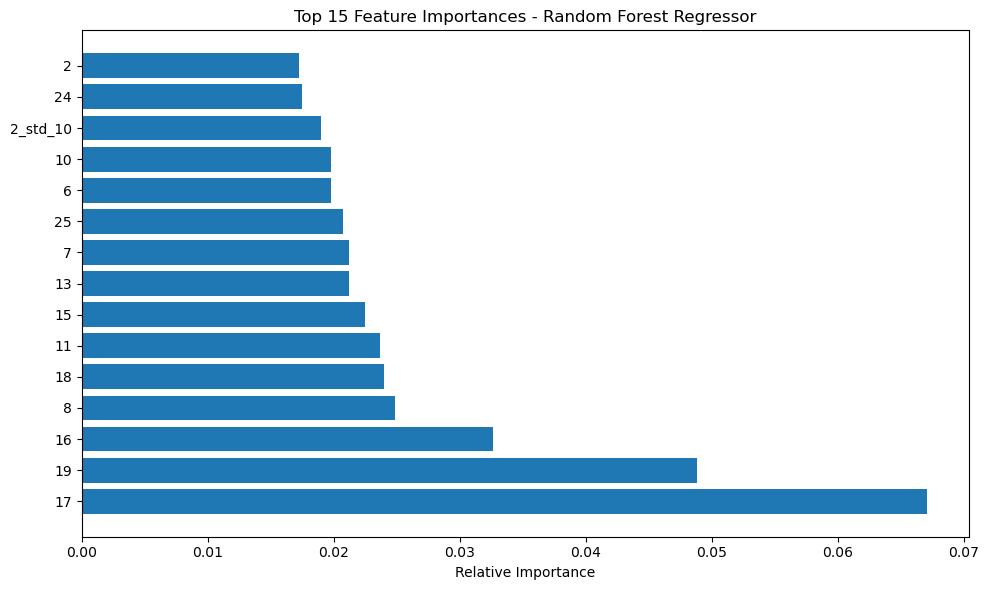


Training SVR...
SVR Results:
  RMSE: 35.37 cycles
  MAE: 30.07 cycles
  R² Score: 0.0845
  Training Time: 592.00 seconds


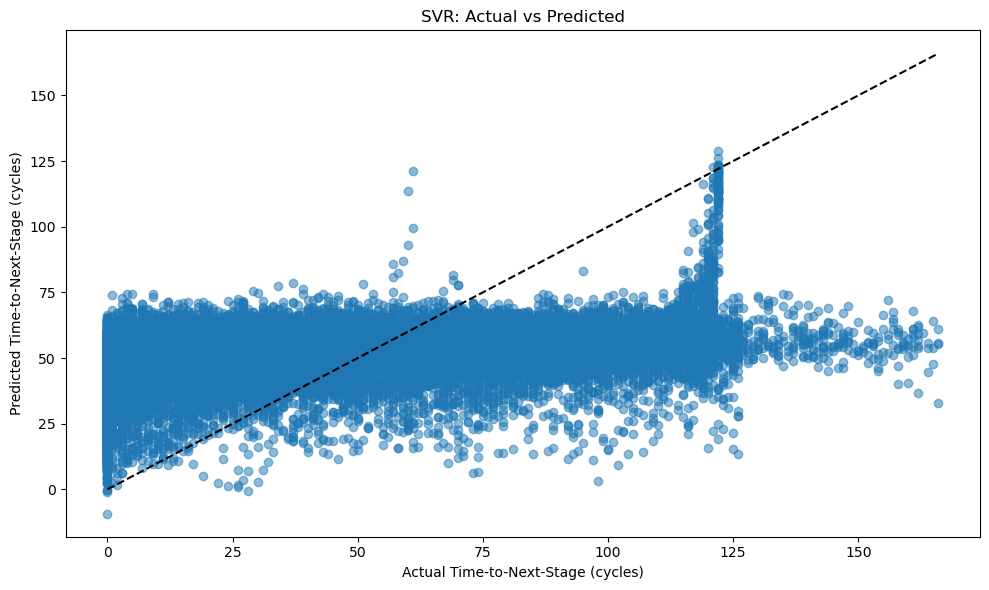

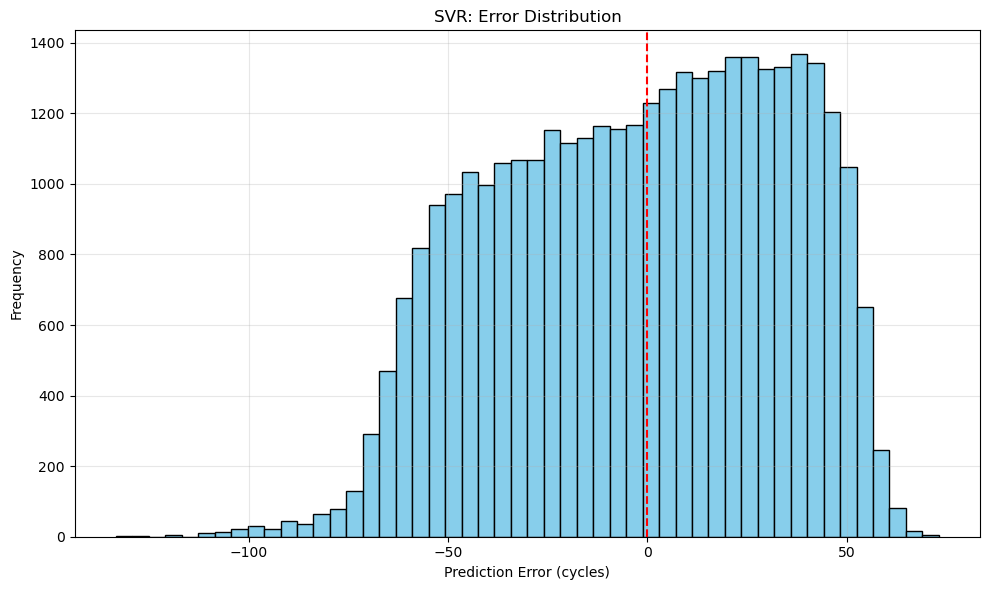


Best regression model for Dataset 2 & 4: Random Forest Regressor
  RMSE: 33.98 cycles

Phase 3 Regression: All Datasets
Preparing regression data...
Calculating time-to-next-stage for each unit...
Total samples for regression: 160359
Features: 120
Target variable (time_to_next_stage) statistics:
  Min: 0 cycles
  Max: 318 cycles
  Mean: 89.05 cycles
  Median: 77 cycles


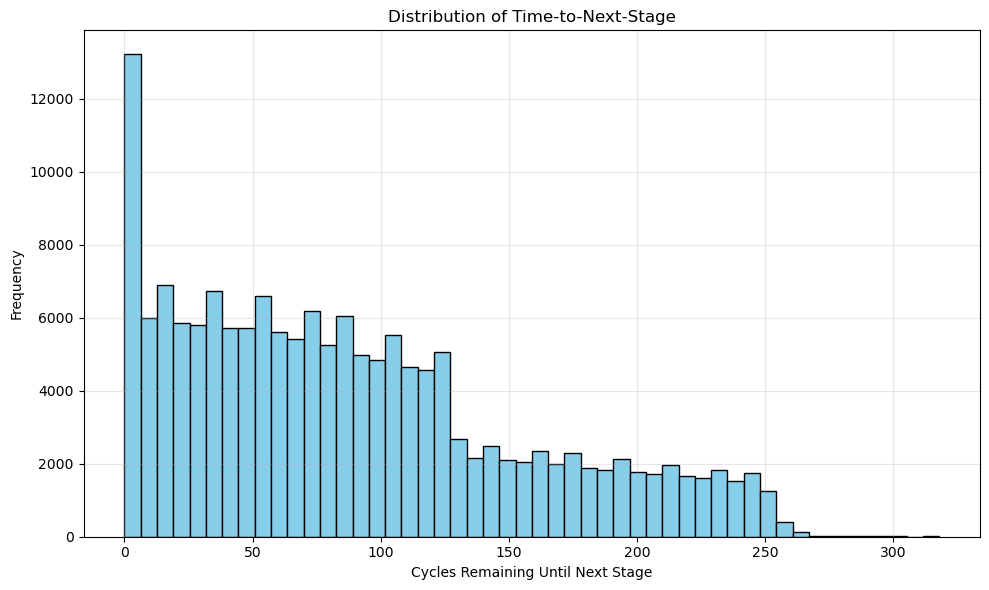


Training Ridge Regression...
Ridge Regression Results:
  RMSE: 58.86 cycles
  MAE: 46.87 cycles
  R² Score: 0.2354
  Training Time: 0.06 seconds


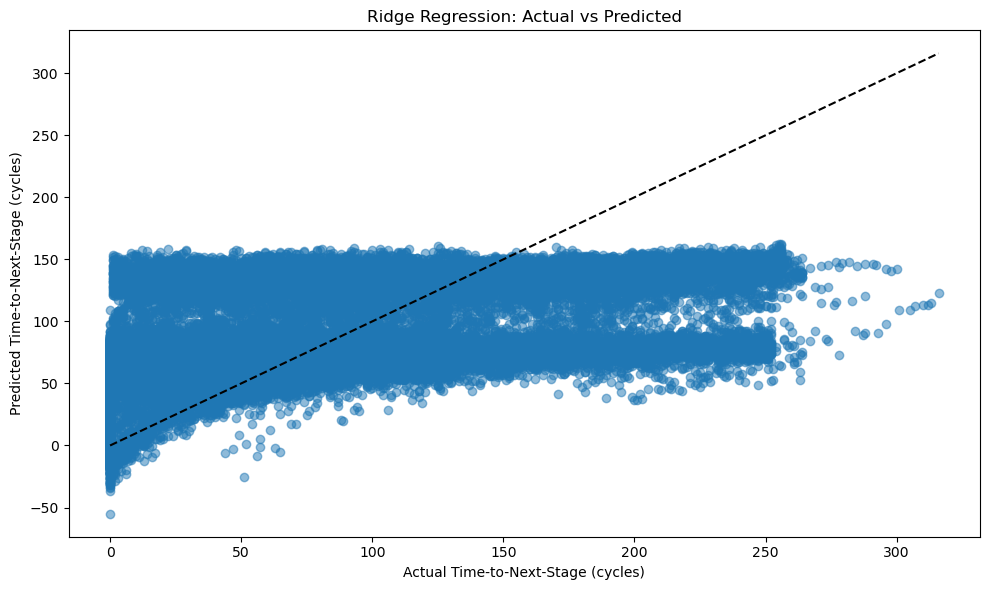

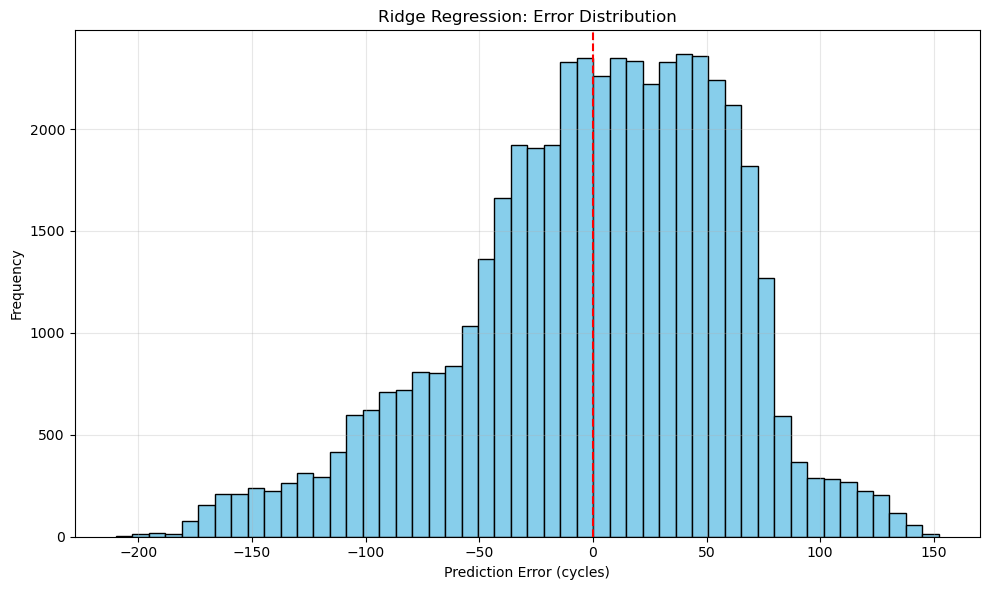


Training Random Forest Regressor...
Random Forest Regressor Results:
  RMSE: 52.60 cycles
  MAE: 41.03 cycles
  R² Score: 0.3894
  Training Time: 101.72 seconds


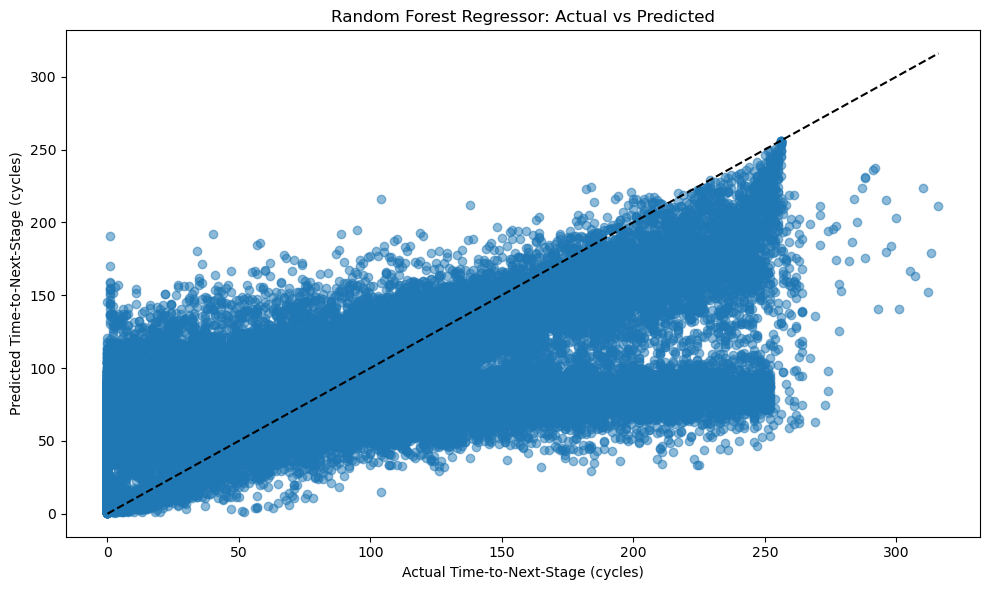

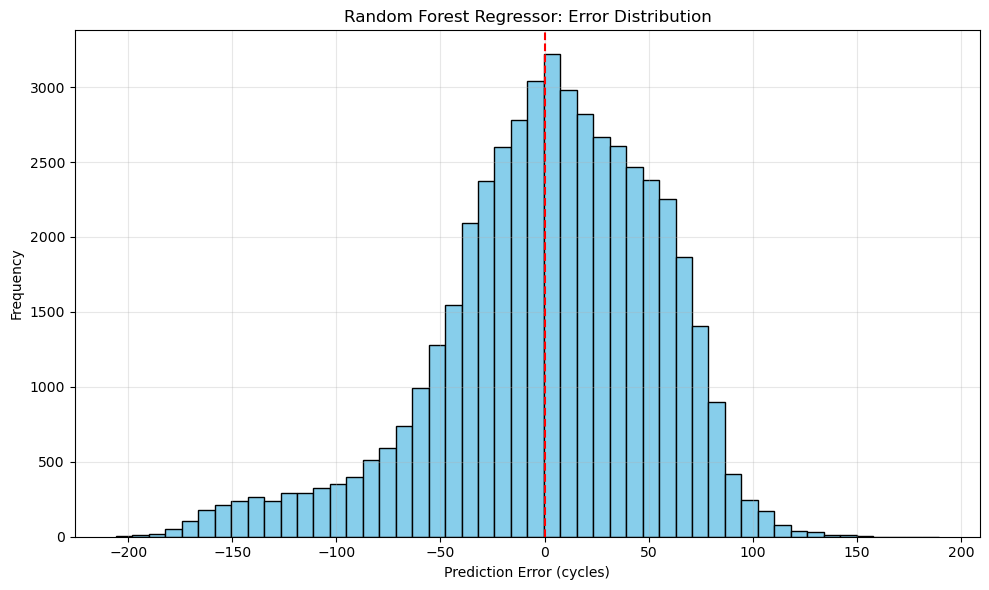

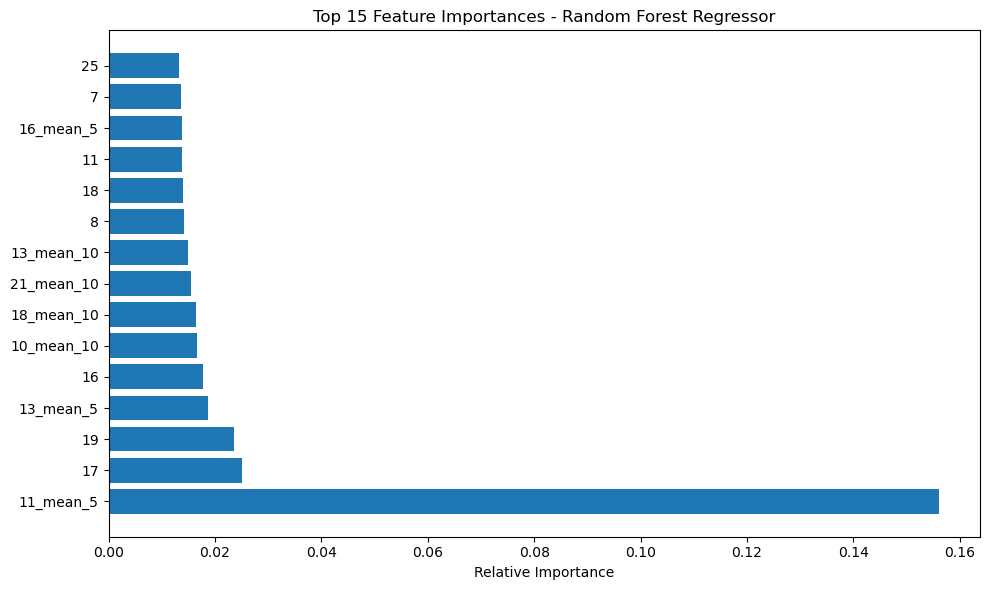


Training SVR...
SVR Results:
  RMSE: 60.83 cycles
  MAE: 47.65 cycles
  R² Score: 0.1835
  Training Time: 1166.74 seconds


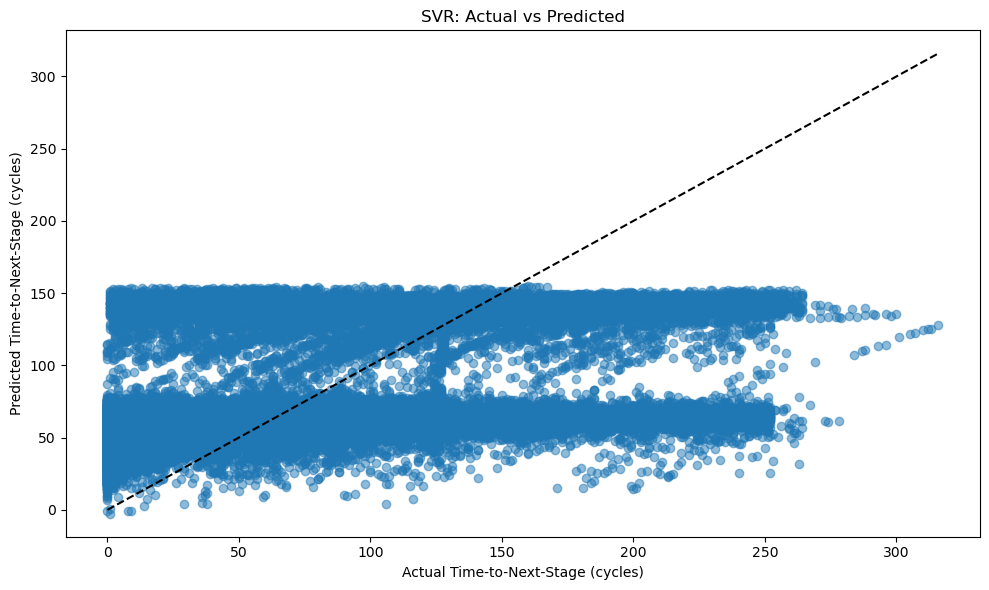

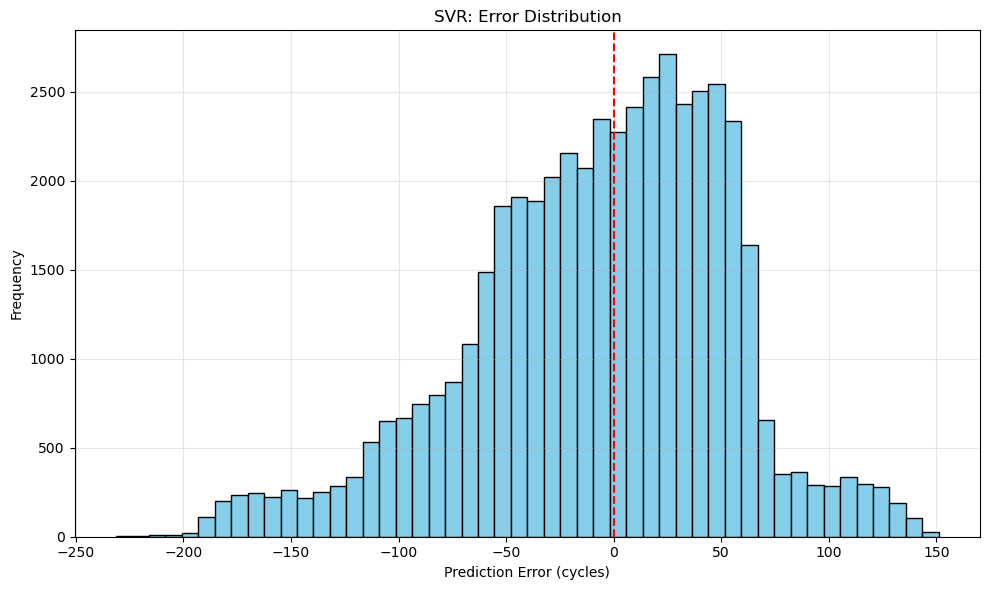


Best regression model for All Datasets: Random Forest Regressor
  RMSE: 52.60 cycles


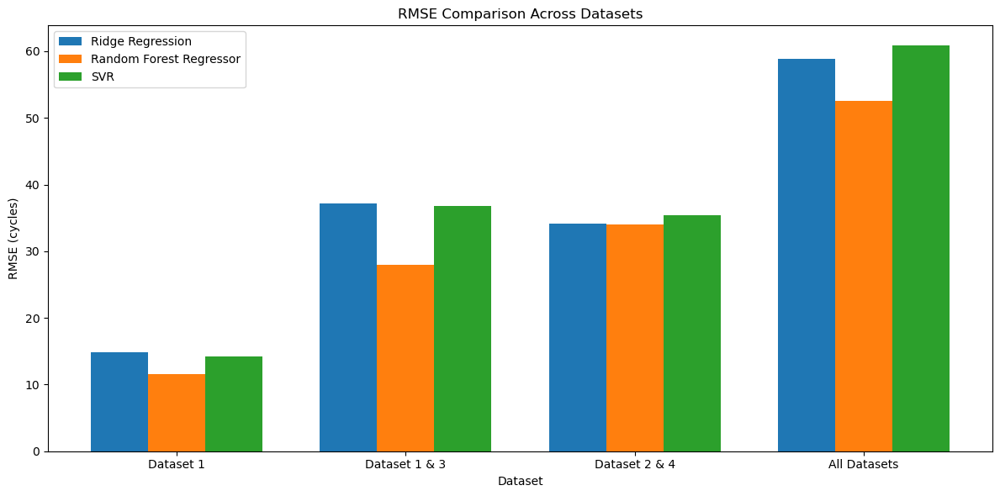

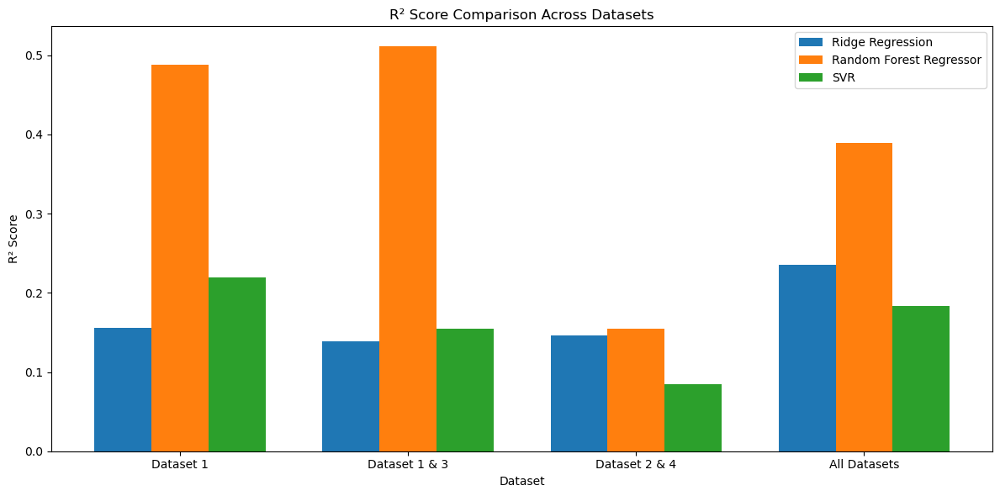

In [25]:
# Initialize dictionary to store regression results
regression_results = {}

# Dataset 1
results_reg_1, best_reg_model_1 = run_phase3_regression('Dataset 1', df1_cluster_T, cluster_mappings['Dataset 1'])
regression_results['Dataset 1'] = results_reg_1

# Dataset 1 & 3
results_reg_13, best_reg_model_13 = run_phase3_regression('Dataset 1 & 3', df13_cluster_T, cluster_mappings['Dataset 1 & 3'])
regression_results['Dataset 1 & 3'] = results_reg_13

# Dataset 2 & 4
results_reg_24, best_reg_model_24 = run_phase3_regression('Dataset 2 & 4', df24_cluster_T, cluster_mappings['Dataset 2 & 4'])
regression_results['Dataset 2 & 4'] = results_reg_24

# All Datasets
results_reg_all, best_reg_model_all = run_phase3_regression('All Datasets', df_all_cluster_T, cluster_mappings['All Datasets'])
regression_results['All Datasets'] = results_reg_all

# Compare regression results across datasets
plot_regression_comparison(regression_results)

In [26]:
# Final summary table
print("\n" + "="*80)
print(f"{'PHASE 3 SUMMARY: BEST REGRESSION MODELS ACROSS DATASETS':^80}")
print("="*80)
print(f"{'Dataset':<15} {'Best Model':<25} {'RMSE':<10} {'MAE':<10} {'R²':<10}")
print("-"*80)

dataset_reg_results = [
    ('Dataset 1', results_reg_1, best_reg_model_1),
    ('Dataset 1 & 3', results_reg_13, best_reg_model_13),
    ('Dataset 2 & 4', results_reg_24, best_reg_model_24),
    ('All Datasets', results_reg_all, best_reg_model_all)
]

for dataset_name, results, best_model in dataset_reg_results:
    print(f"{dataset_name:<15} {best_model:<25} {results[best_model]['rmse']:<10.2f} {results[best_model]['mae']:<10.2f} {results[best_model]['r2']:<10.4f}")

print("="*80)


            PHASE 3 SUMMARY: BEST REGRESSION MODELS ACROSS DATASETS             
Dataset         Best Model                RMSE       MAE        R²        
--------------------------------------------------------------------------------
Dataset 1       Random Forest Regressor   11.54      9.26       0.4884    
Dataset 1 & 3   Random Forest Regressor   27.97      22.59      0.5111    
Dataset 2 & 4   Random Forest Regressor   33.98      28.57      0.1548    
All Datasets    Random Forest Regressor   52.60      41.03      0.3894    


# Phase 4

In [27]:
from sklearn.metrics import precision_recall_curve, auc, average_precision_score
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from sklearn.calibration import CalibratedClassifierCV

In [ ]:
def extract_failure_probability(classifier, X, is_xgboost=False, stage4_label=4):
    """
    Extract probability of Stage 4 (failure) from classifier
    """
    if is_xgboost:
        if hasattr(classifier, 'predict_proba'):
            probas = classifier.predict_proba(X)
            class_idx = list(classifier.classes_).index(stage4_label)
            return probas[:, class_idx]
        else:
            dmat = xgb.DMatrix(X)
            probas = classifier.predict(dmat)
            probas = probas.reshape(X.shape[0], -1)
            return probas[:, stage4_label]
    else:
        if hasattr(classifier, 'predict_proba'):
            probas = classifier.predict_proba(X)
            if hasattr(classifier, 'classes_'):
                class_idx = list(classifier.classes_).index(stage4_label)
            else:
                class_idx = stage4_label
            return probas[:, class_idx]
        elif hasattr(classifier, 'decision_function'):
            decision_vals = classifier.decision_function(X)
            if decision_vals.ndim > 1 and decision_vals.shape[1] > stage4_label:
                return np.exp(decision_vals[:, stage4_label]) / np.sum(np.exp(decision_vals), axis=1)
            else:
                from scipy.special import expit
                return expit(decision_vals)
        else:
            preds = classifier.predict(X)
            return (preds == stage4_label).astype(float)


Phase 4 Risk Assessment: Dataset 1
Calculating failure probabilities...
Predicting time to failure...
Computing risk scores...
Alerts generated: 25 (0.12% of observations)

Top 10 highest risk points:
Unit 81, Cycle 4: Risk = 1.0000, Stage = 0, Probability = 0.8000, Time Left = 44.1 cycles
  🚨 MAINTENANCE ALERT!
Unit 81, Cycle 171: Risk = 0.9490, Stage = 3, Probability = 0.8000, Time Left = 41.9 cycles
  🚨 MAINTENANCE ALERT!
Unit 76, Cycle 3: Risk = 0.9186, Stage = 0, Probability = 0.8000, Time Left = 40.5 cycles
  🚨 MAINTENANCE ALERT!
Unit 84, Cycle 167: Risk = 0.9119, Stage = 3, Probability = 0.8000, Time Left = 40.2 cycles
  🚨 MAINTENANCE ALERT!
Unit 20, Cycle 157: Risk = 0.8343, Stage = 3, Probability = 0.6000, Time Left = 49.1 cycles
  🚨 MAINTENANCE ALERT!
Unit 92, Cycle 161: Risk = 0.8328, Stage = 3, Probability = 0.6000, Time Left = 49.0 cycles
  🚨 MAINTENANCE ALERT!
Unit 93, Cycle 111: Risk = 0.8298, Stage = 2, Probability = 0.8000, Time Left = 36.6 cycles
  🚨 MAINTENANCE ALER

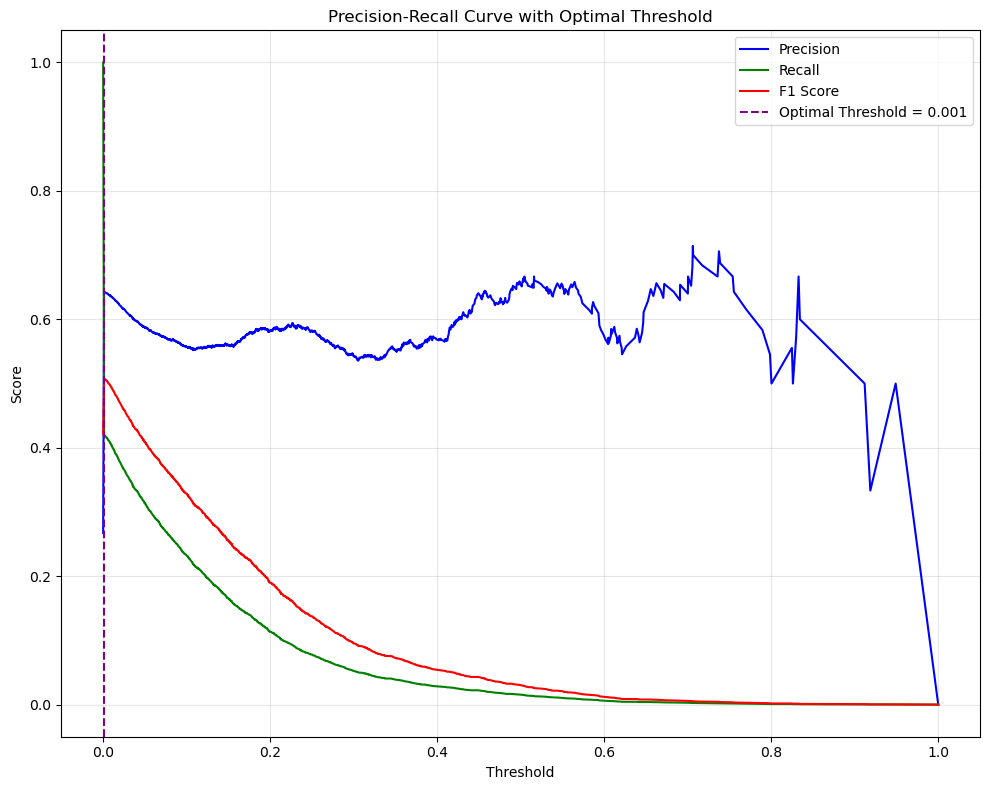

Alerts with optimized threshold: 3596 (17.43% of observations)

Plotting risk evolution for sample units...


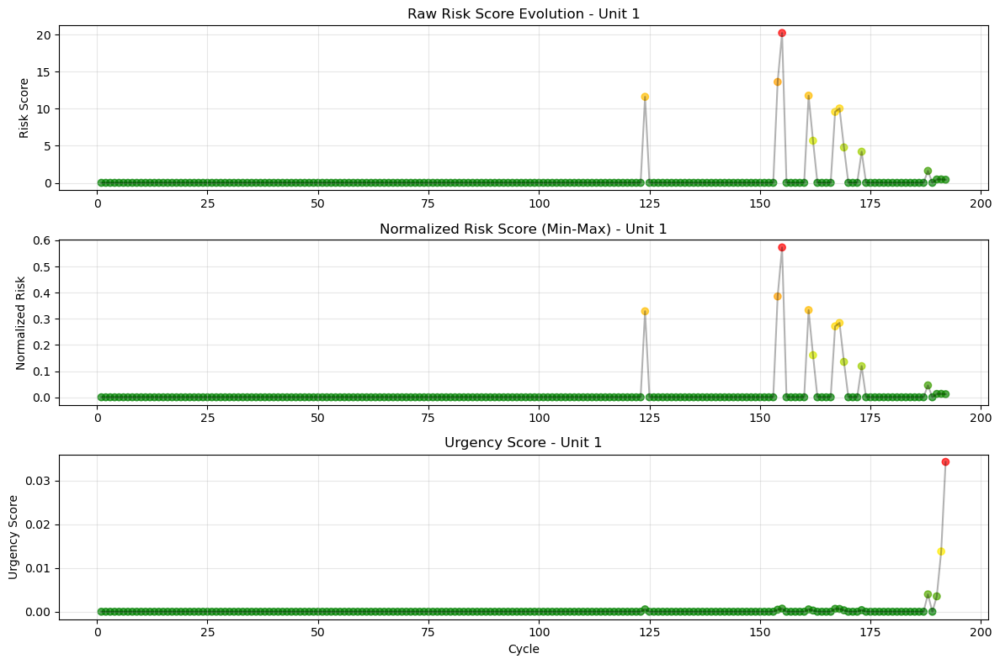

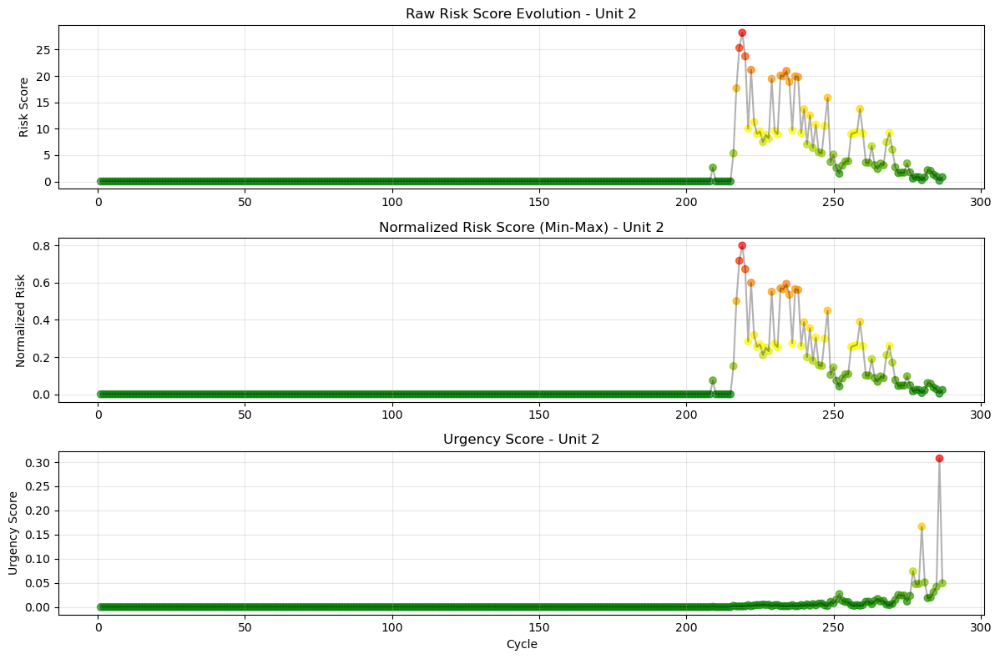

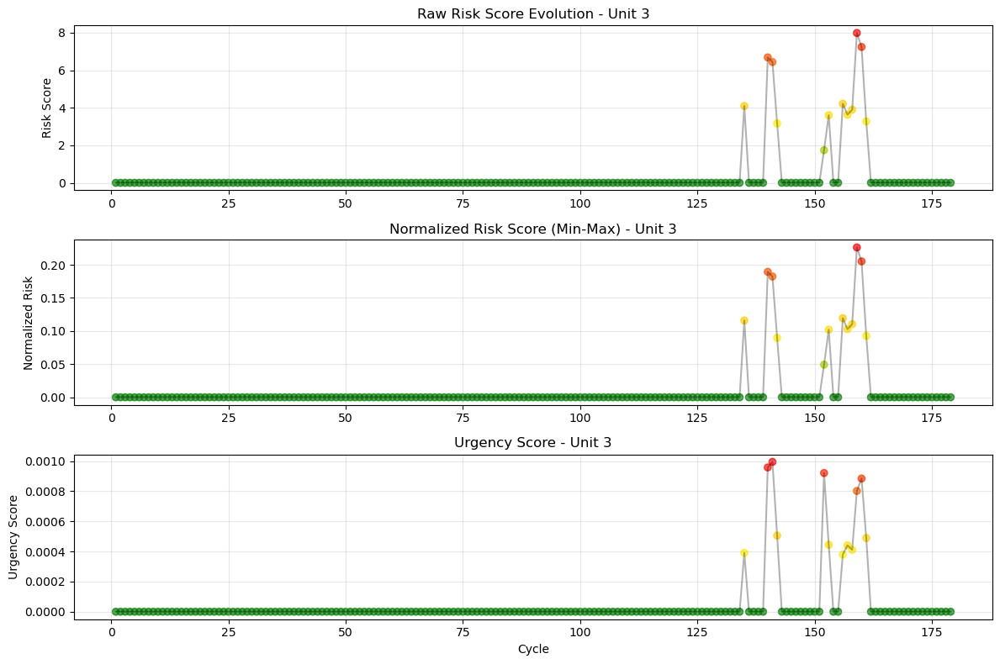

Generating unit-cycle risk heatmap...


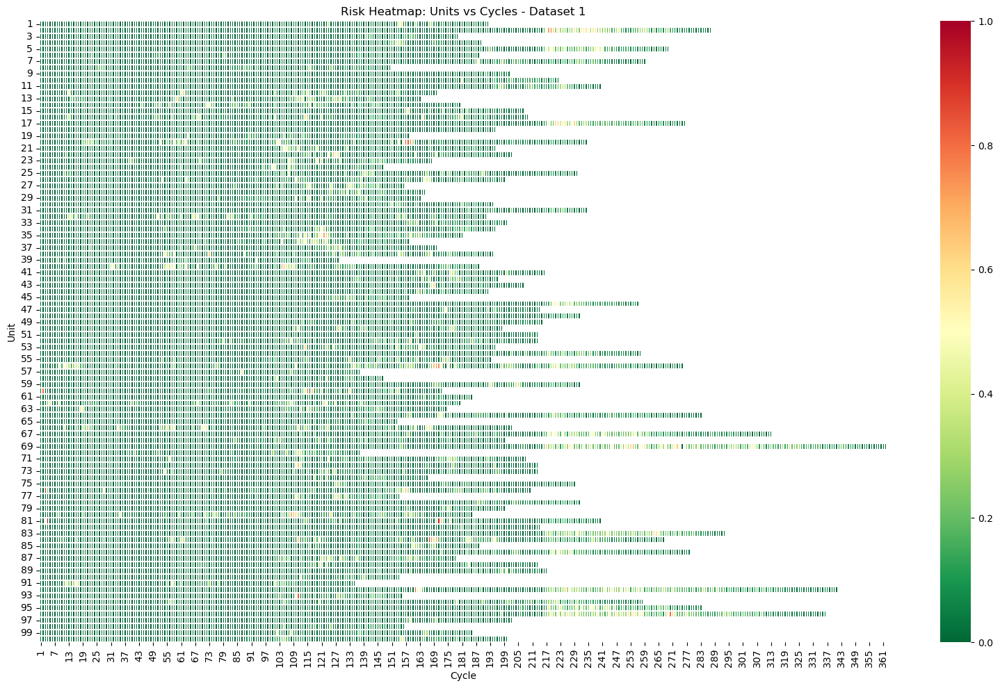


Risk Score Statistics:
  Raw Risk - Mean: 1.04, Median: 0.00, Max: 35.30
  Normalized Risk - Mean: 0.0295, Median: 0.0000
  Urgency Score - Mean: 0.0018, Median: 0.0000

Maintenance Alert Visualization for Dataset 1


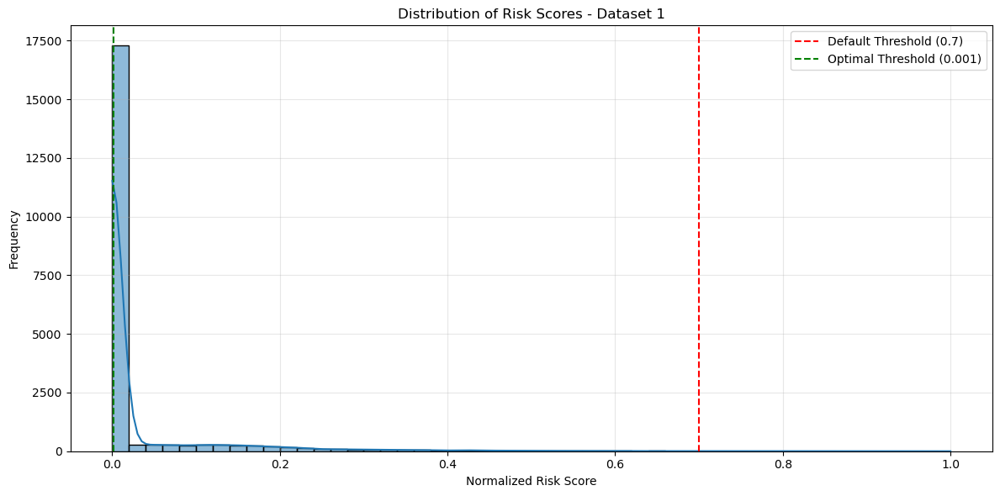

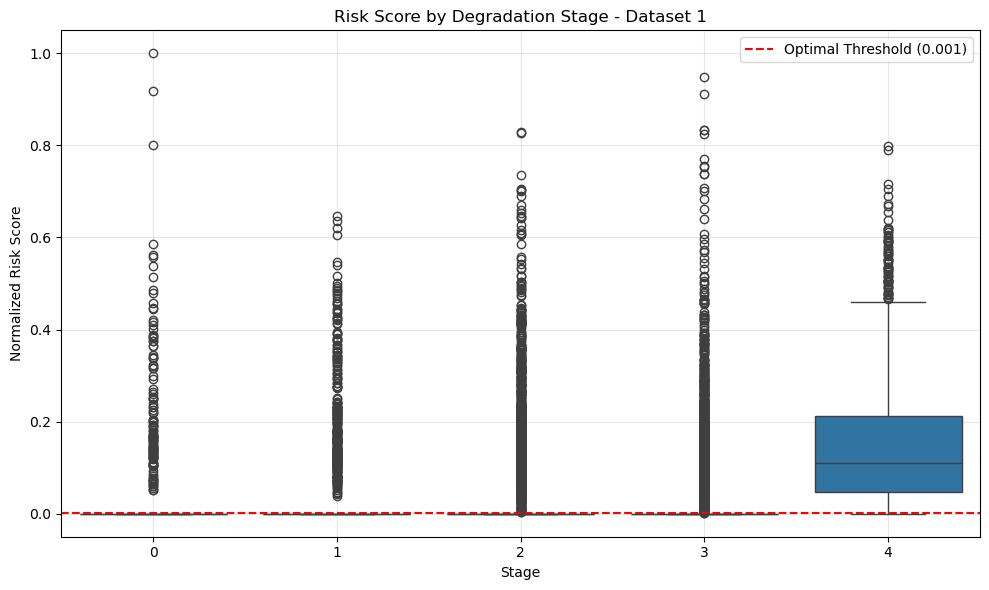

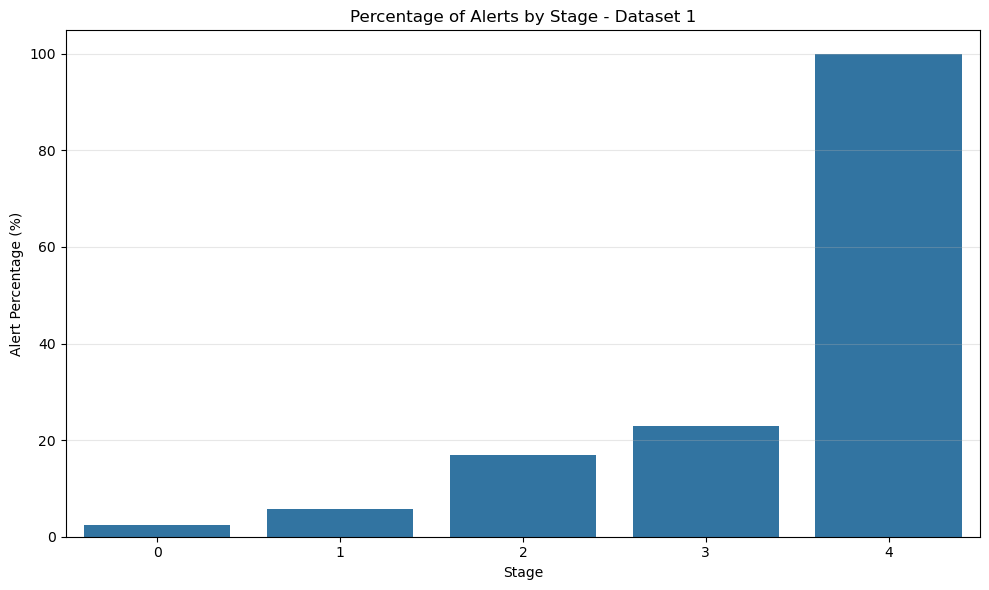

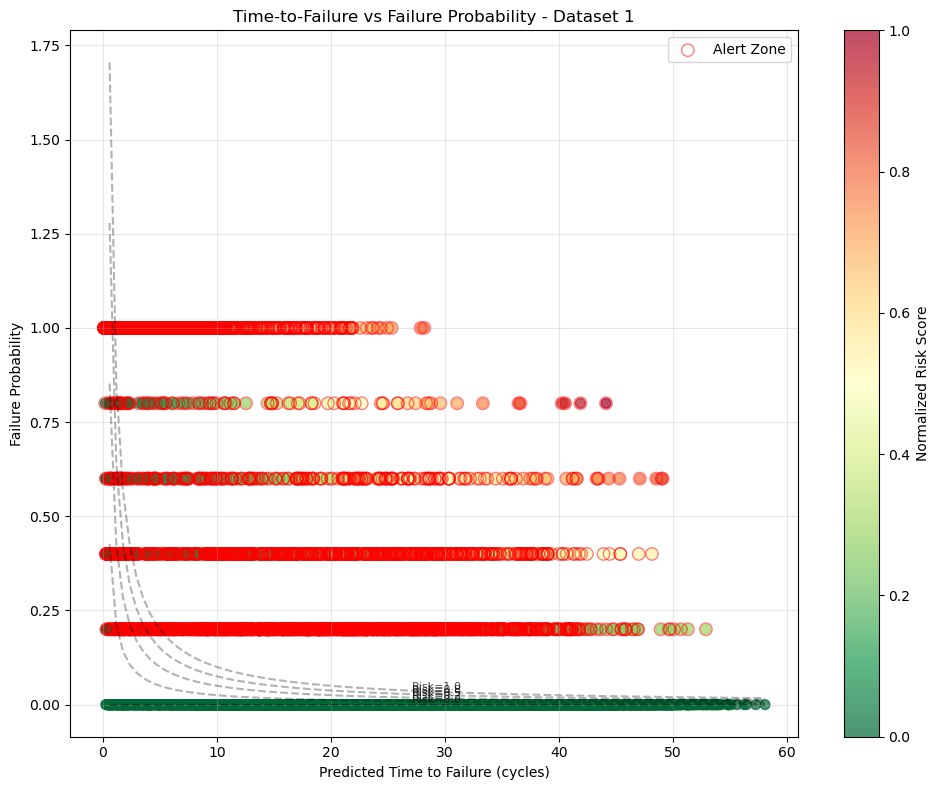


Phase 4 Risk Assessment: Dataset 1 & 3
Calculating failure probabilities...
Predicting time to failure...
Computing risk scores...
Alerts generated: 7 (0.02% of observations)

Top 10 highest risk points:
Unit 88, Cycle 53: Risk = 1.0000, Stage = 0, Probability = 1.0000, Time Left = 123.9 cycles
  🚨 MAINTENANCE ALERT!
Unit 96, Cycle 316: Risk = 0.7289, Stage = 4, Probability = 1.0000, Time Left = 90.3 cycles
  🚨 MAINTENANCE ALERT!
Unit 96, Cycle 313: Risk = 0.7287, Stage = 3, Probability = 1.0000, Time Left = 90.3 cycles
  🚨 MAINTENANCE ALERT!
Unit 96, Cycle 314: Risk = 0.7204, Stage = 4, Probability = 1.0000, Time Left = 89.3 cycles
  🚨 MAINTENANCE ALERT!
Unit 96, Cycle 317: Risk = 0.7129, Stage = 4, Probability = 1.0000, Time Left = 88.3 cycles
  🚨 MAINTENANCE ALERT!
Unit 96, Cycle 320: Risk = 0.7126, Stage = 4, Probability = 1.0000, Time Left = 88.3 cycles
  🚨 MAINTENANCE ALERT!
Unit 24, Cycle 137: Risk = 0.7115, Stage = 2, Probability = 0.8000, Time Left = 110.2 cycles
  🚨 MAINTENA

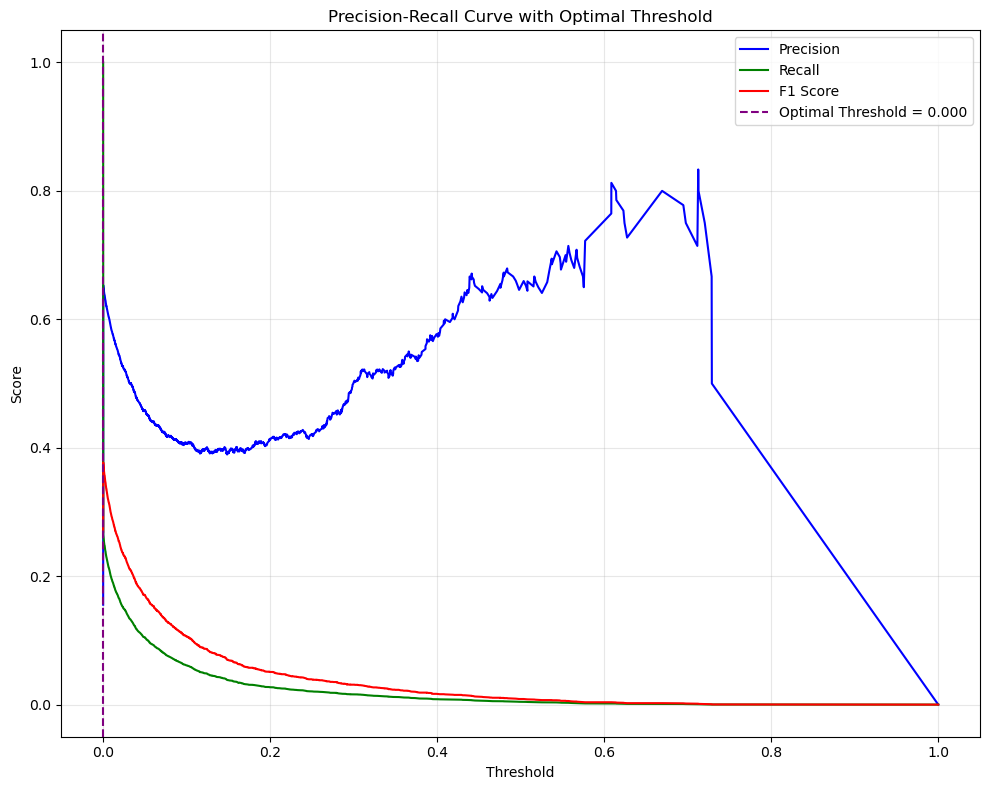

Alerts with optimized threshold: 2856 (6.30% of observations)

Plotting risk evolution for sample units...


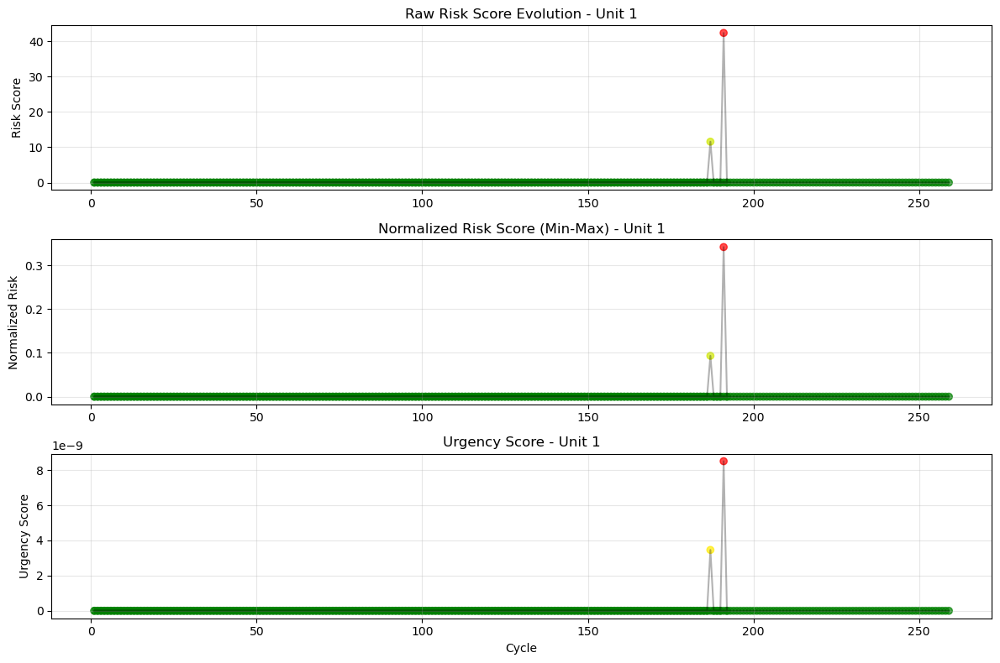

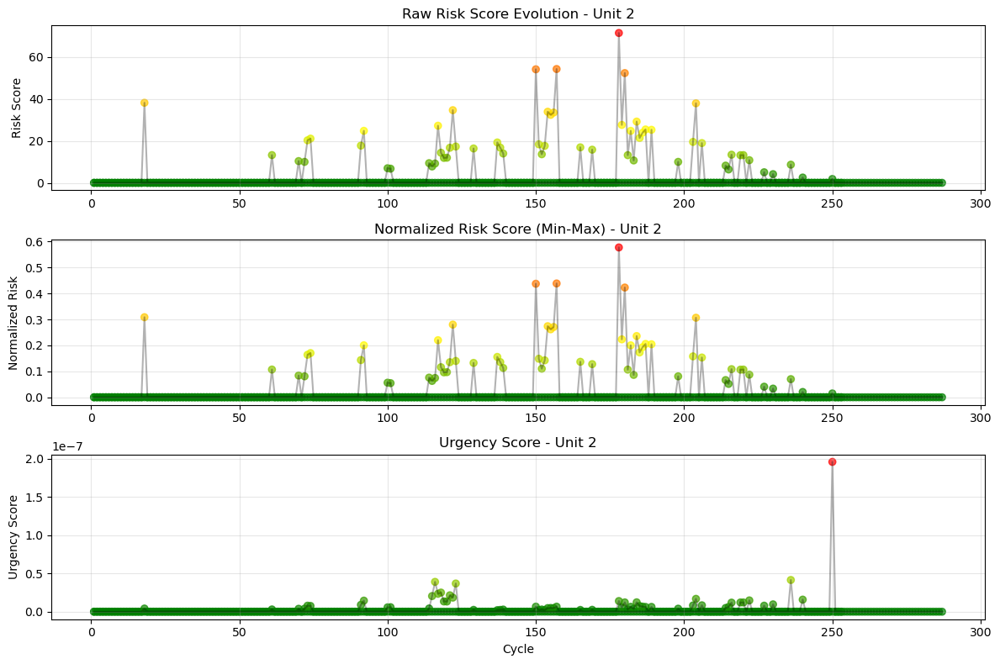

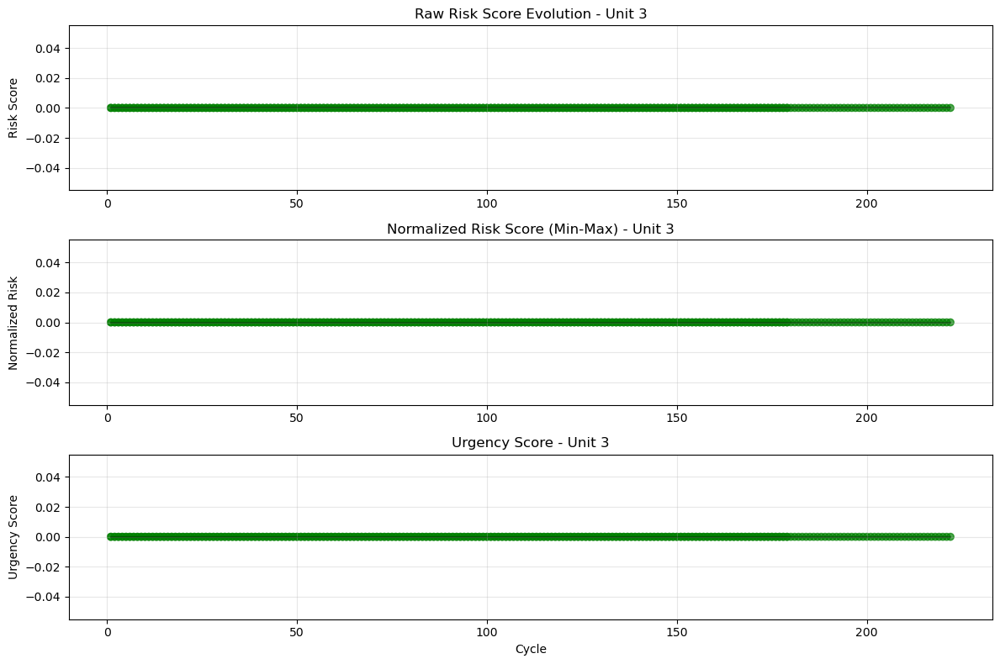

Generating unit-cycle risk heatmap...


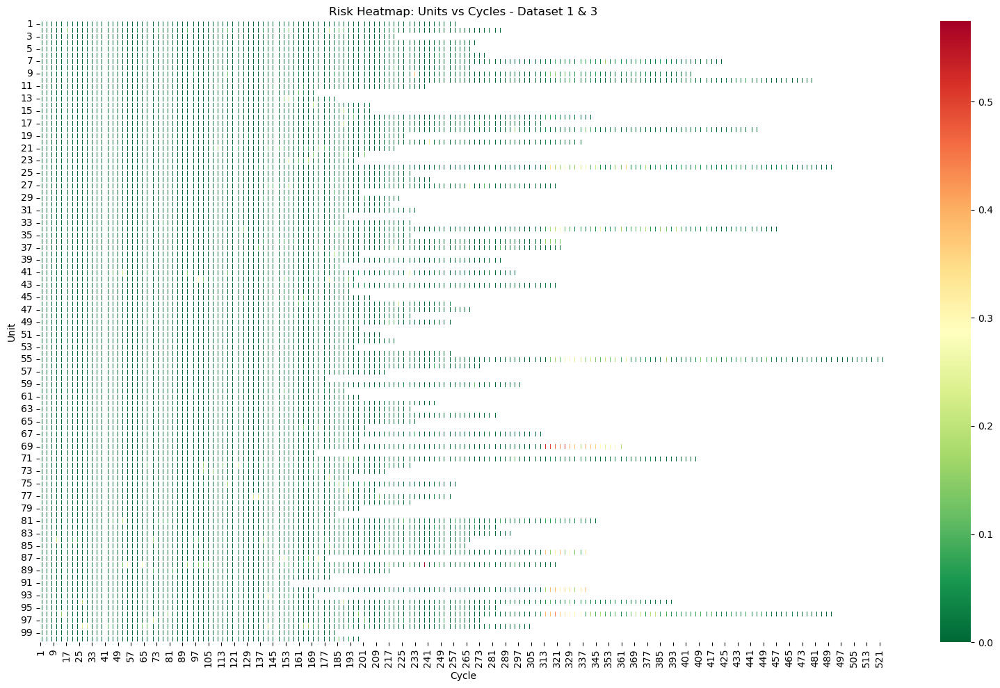


Risk Score Statistics:
  Raw Risk - Mean: 0.82, Median: 0.00, Max: 123.90
  Normalized Risk - Mean: 0.0067, Median: 0.0000
  Urgency Score - Mean: 0.0013, Median: 0.0000

Maintenance Alert Visualization for Dataset 1 & 3


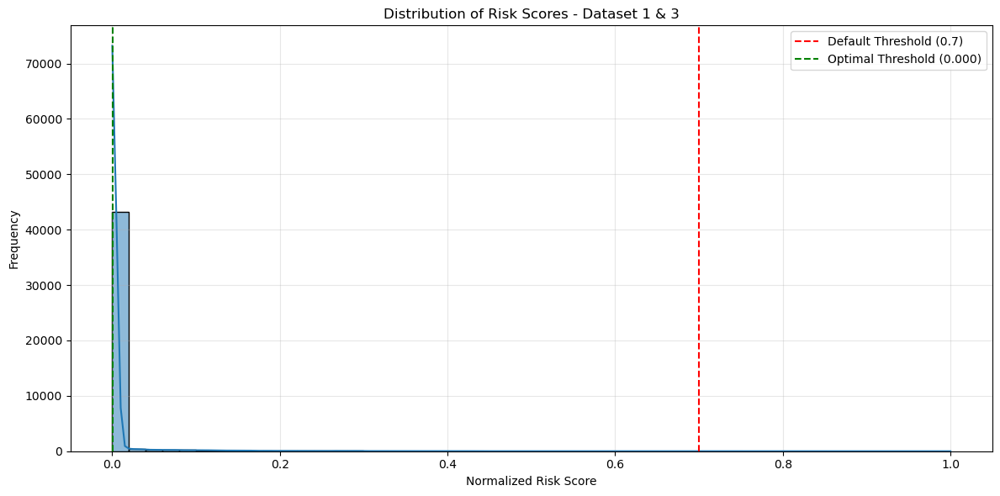

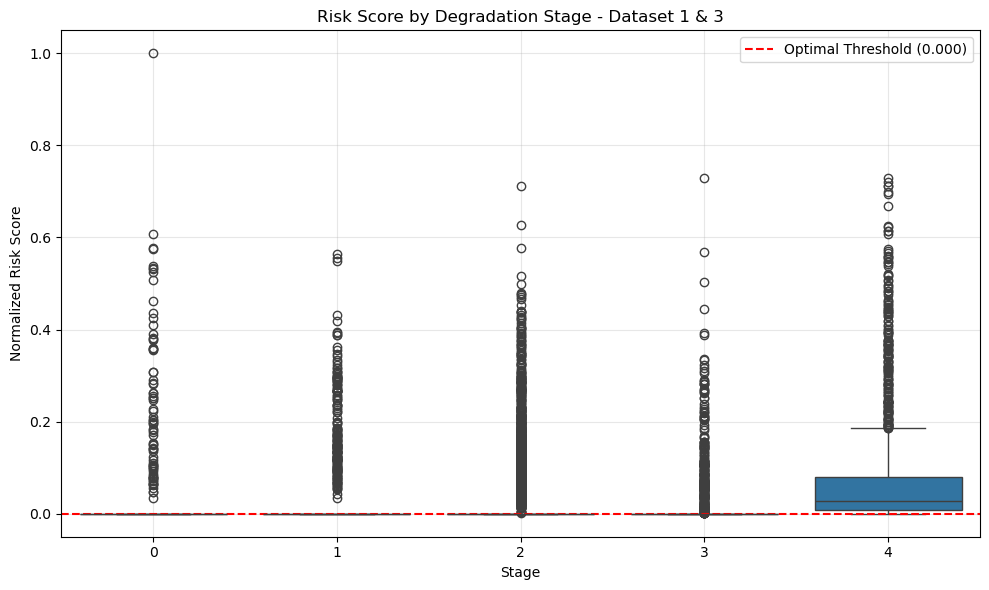

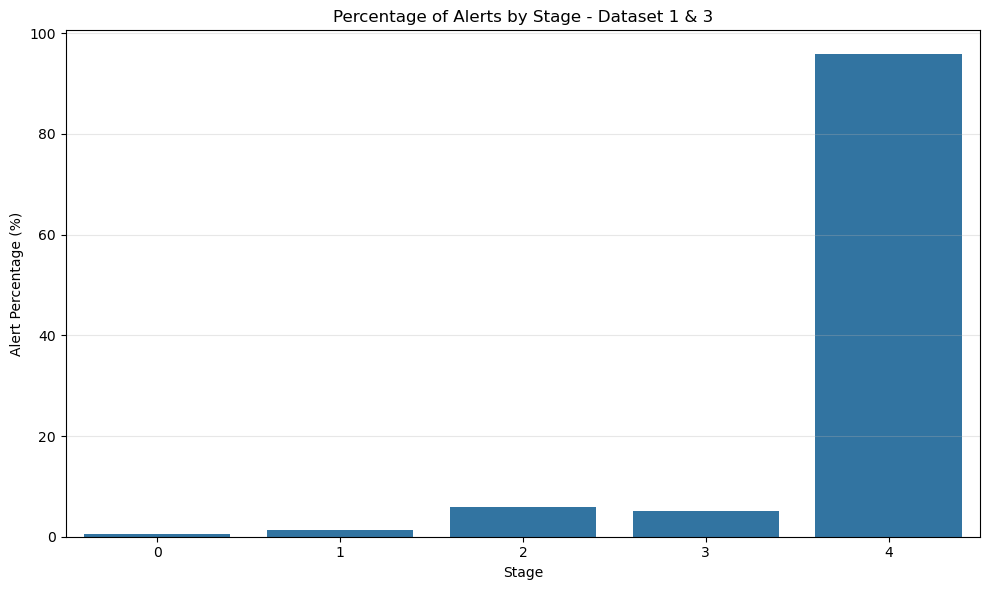

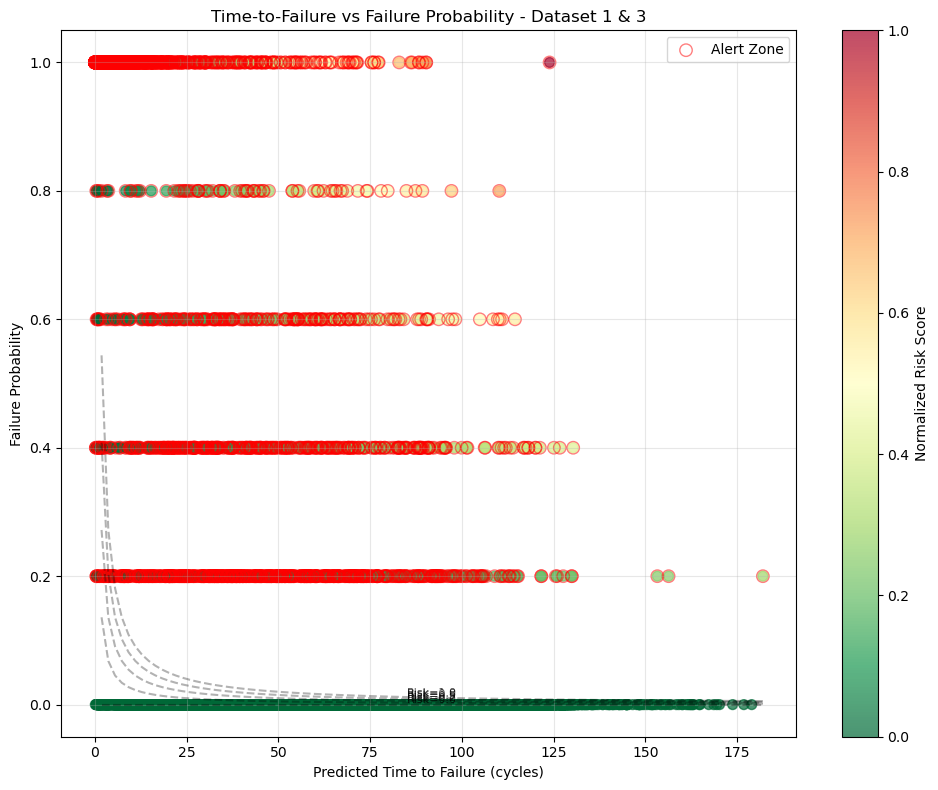


Phase 4 Risk Assessment: Dataset 2 & 4
Calculating failure probabilities...
Predicting time to failure...
Computing risk scores...
Alerts generated: 8 (0.01% of observations)

Top 10 highest risk points:
Unit 112, Cycle 374: Risk = 1.0000, Stage = 4, Probability = 0.9200, Time Left = 92.0 cycles
  🚨 MAINTENANCE ALERT!
Unit 112, Cycle 376: Risk = 0.9209, Stage = 4, Probability = 0.8700, Time Left = 89.6 cycles
  🚨 MAINTENANCE ALERT!
Unit 242, Cycle 273: Risk = 0.7851, Stage = 4, Probability = 0.9100, Time Left = 73.0 cycles
  🚨 MAINTENANCE ALERT!
Unit 131, Cycle 268: Risk = 0.7544, Stage = 4, Probability = 0.8600, Time Left = 74.3 cycles
  🚨 MAINTENANCE ALERT!
Unit 148, Cycle 271: Risk = 0.7162, Stage = 4, Probability = 0.8700, Time Left = 69.7 cycles
  🚨 MAINTENANCE ALERT!
Unit 32, Cycle 274: Risk = 0.7147, Stage = 4, Probability = 0.8800, Time Left = 68.8 cycles
  🚨 MAINTENANCE ALERT!
Unit 149, Cycle 282: Risk = 0.7059, Stage = 4, Probability = 0.8800, Time Left = 67.9 cycles
  🚨 MAI

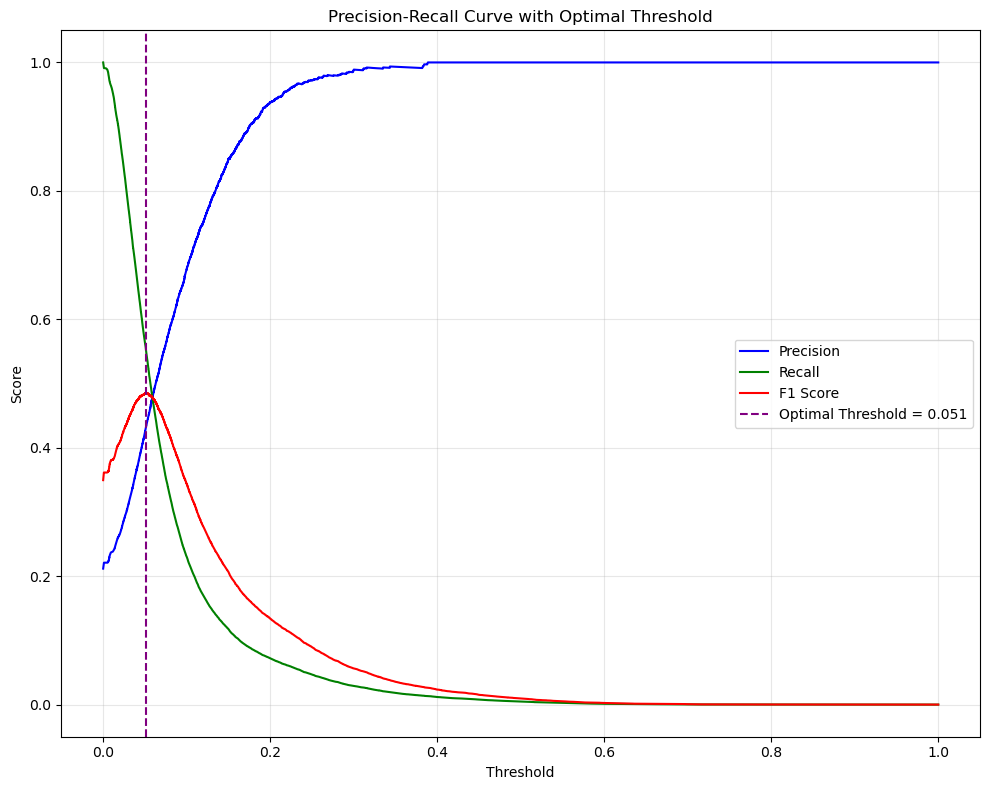

Alerts with optimized threshold: 31446 (27.34% of observations)

Plotting risk evolution for sample units...


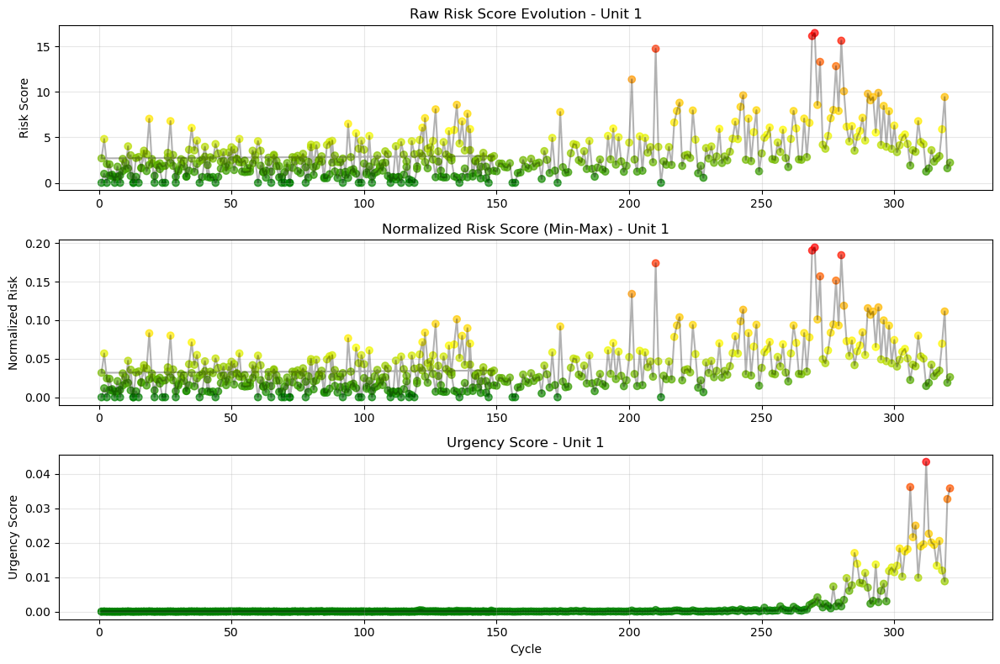

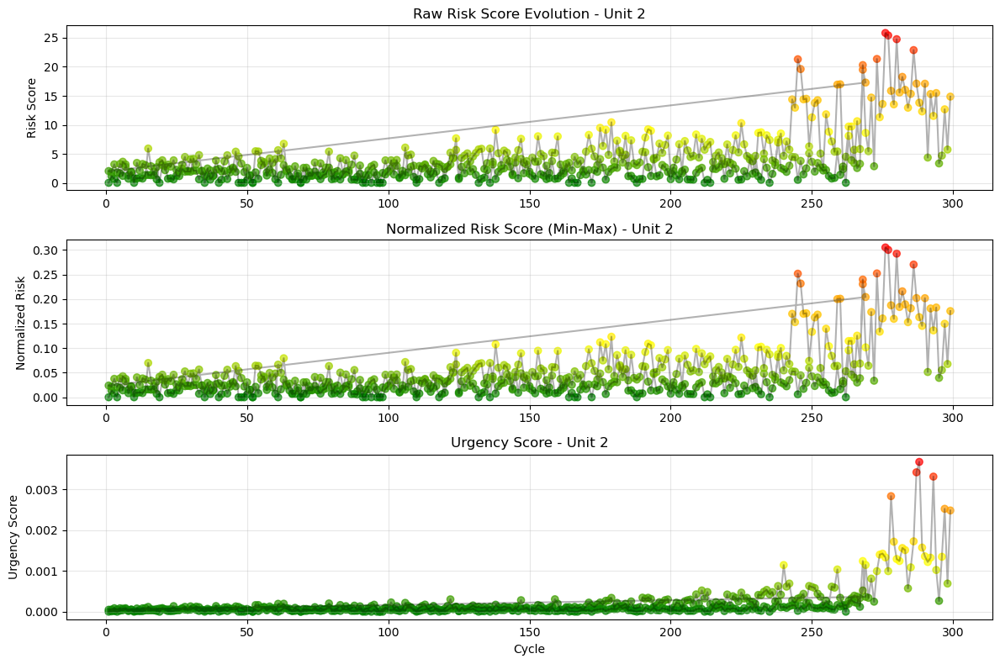

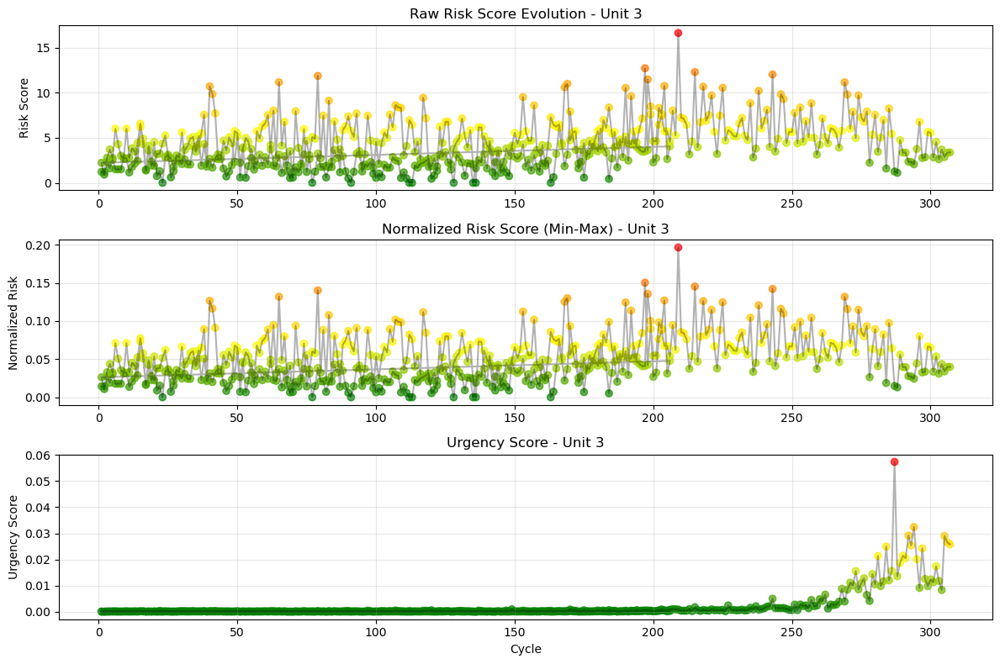

Generating unit-cycle risk heatmap...


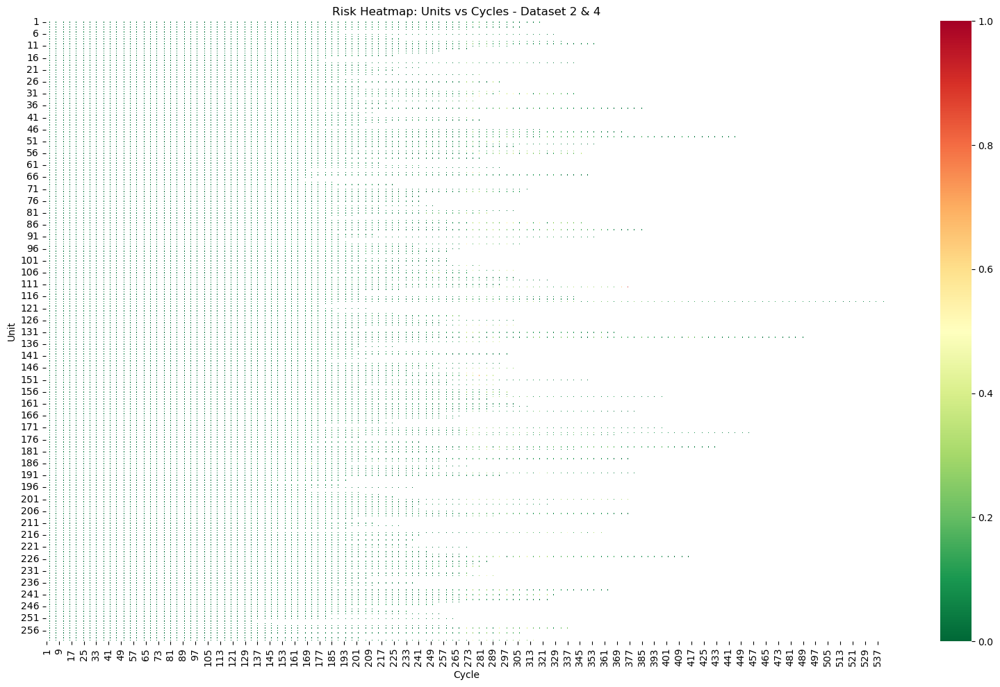


Risk Score Statistics:
  Raw Risk - Mean: 3.69, Median: 2.70, Max: 84.67
  Normalized Risk - Mean: 0.0436, Median: 0.0319
  Urgency Score - Mean: 0.0007, Median: 0.0001

Maintenance Alert Visualization for Dataset 2 & 4


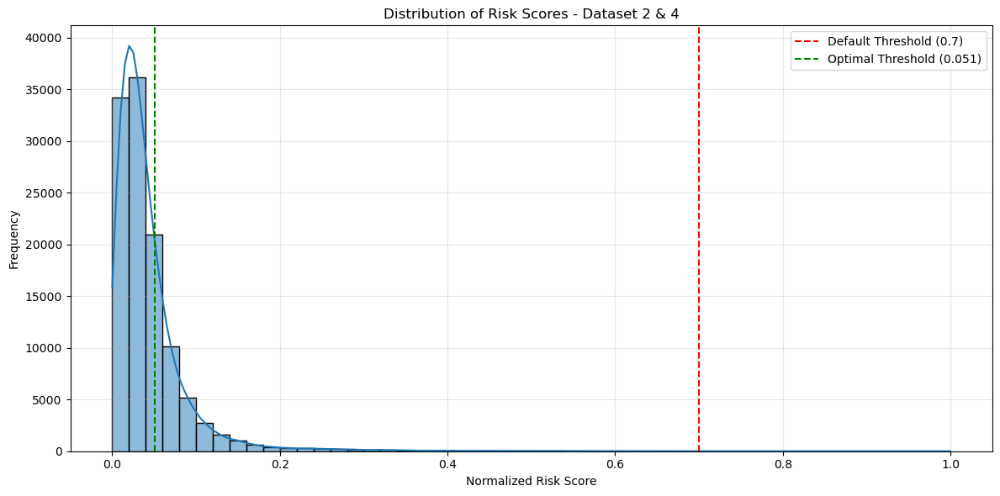

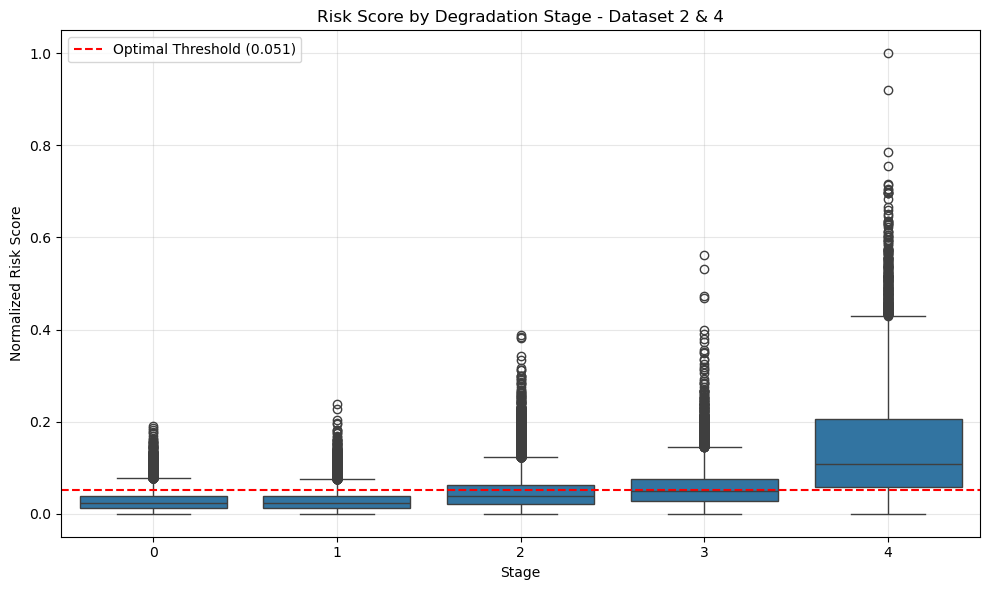

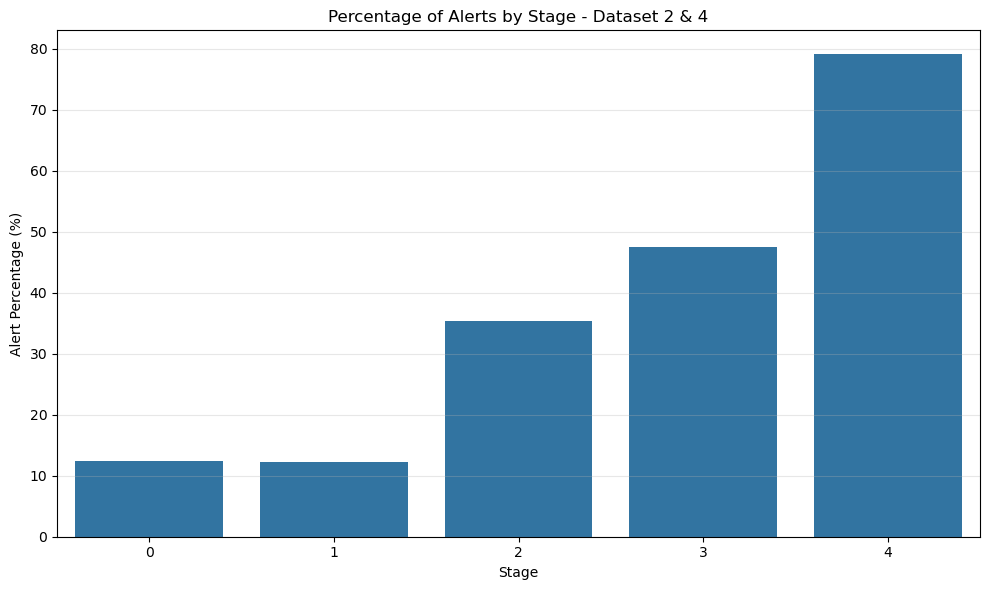

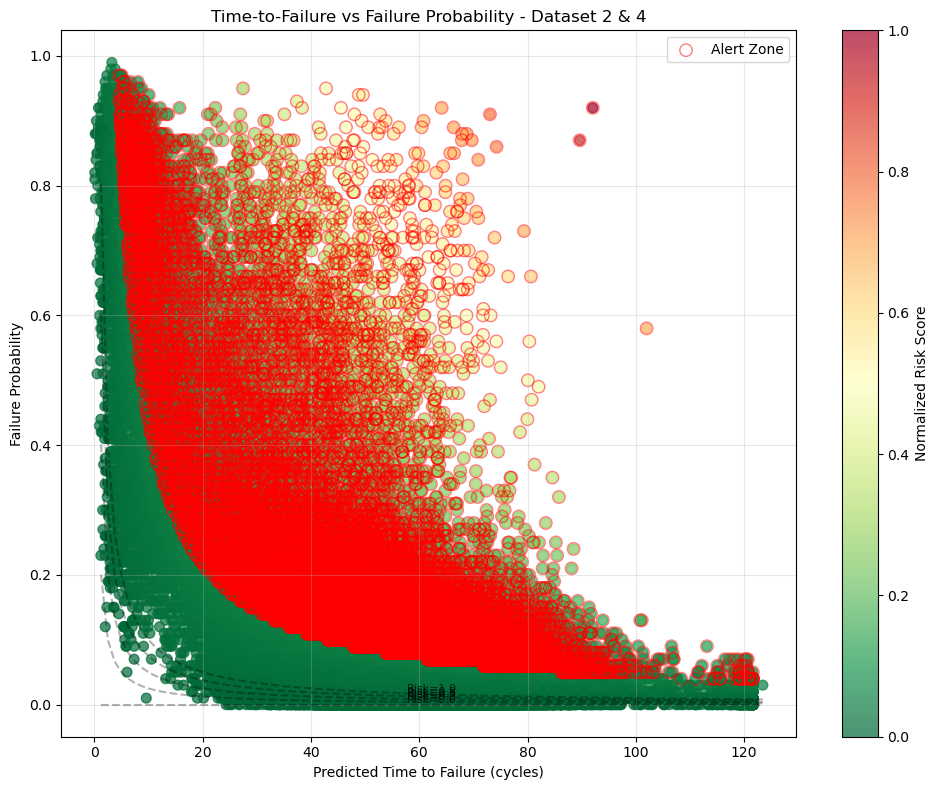


Phase 4 Risk Assessment: All Datasets
Calculating failure probabilities...
Predicting time to failure...
Computing risk scores...
Alerts generated: 89 (0.06% of observations)

Top 10 highest risk points:
Unit 31, Cycle 307: Risk = 1.0000, Stage = 4, Probability = 0.7600, Time Left = 141.5 cycles
  🚨 MAINTENANCE ALERT!
Unit 31, Cycle 325: Risk = 0.9971, Stage = 4, Probability = 0.7100, Time Left = 151.1 cycles
  🚨 MAINTENANCE ALERT!
Unit 31, Cycle 308: Risk = 0.9633, Stage = 4, Probability = 0.6700, Time Left = 154.7 cycles
  🚨 MAINTENANCE ALERT!
Unit 81, Cycle 285: Risk = 0.9562, Stage = 4, Probability = 0.6700, Time Left = 153.5 cycles
  🚨 MAINTENANCE ALERT!
Unit 94, Cycle 299: Risk = 0.9440, Stage = 4, Probability = 0.7200, Time Left = 141.0 cycles
  🚨 MAINTENANCE ALERT!
Unit 85, Cycle 329: Risk = 0.9107, Stage = 4, Probability = 0.7400, Time Left = 132.4 cycles
  🚨 MAINTENANCE ALERT!
Unit 94, Cycle 295: Risk = 0.8905, Stage = 4, Probability = 0.7000, Time Left = 136.8 cycles
  🚨 MA

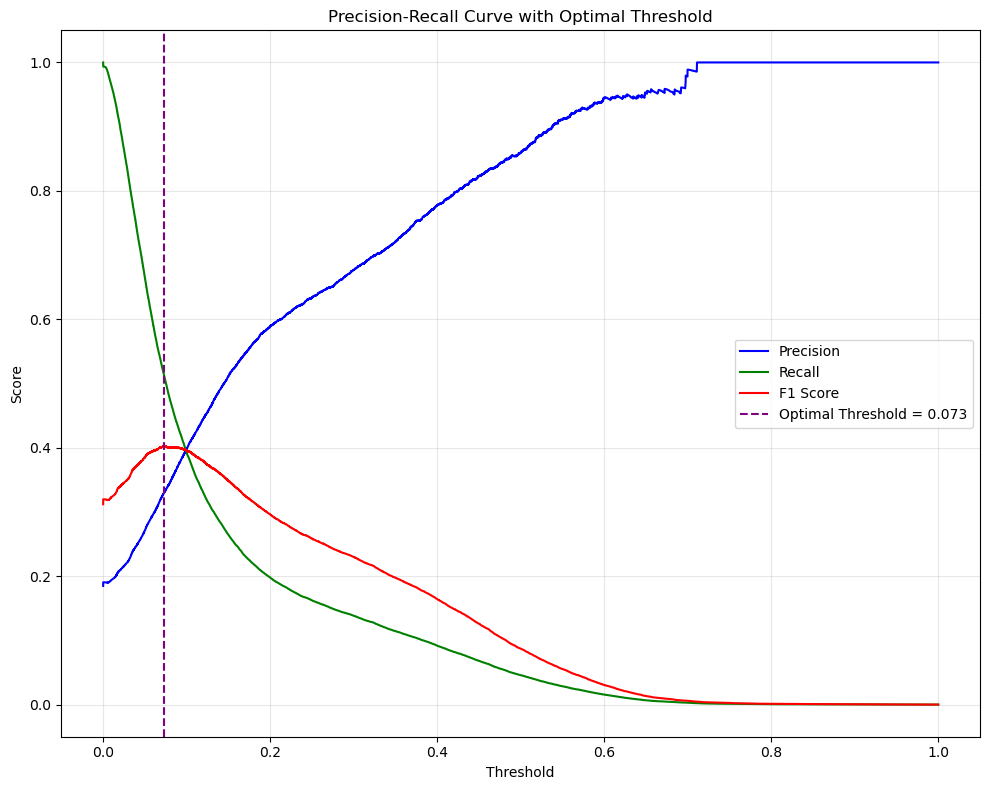

Alerts with optimized threshold: 46381 (28.92% of observations)

Plotting risk evolution for sample units...


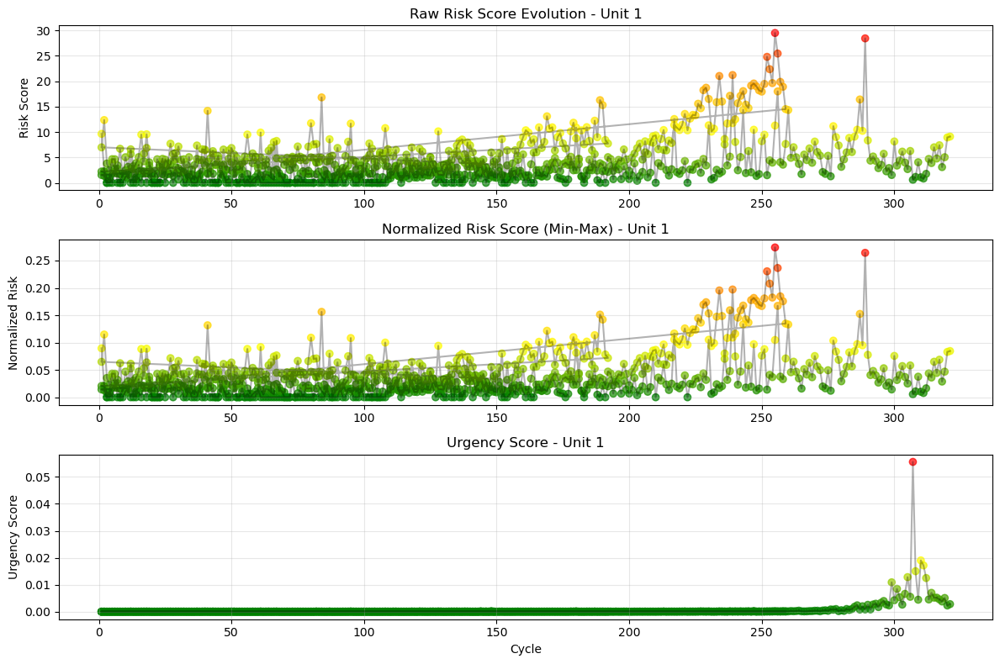

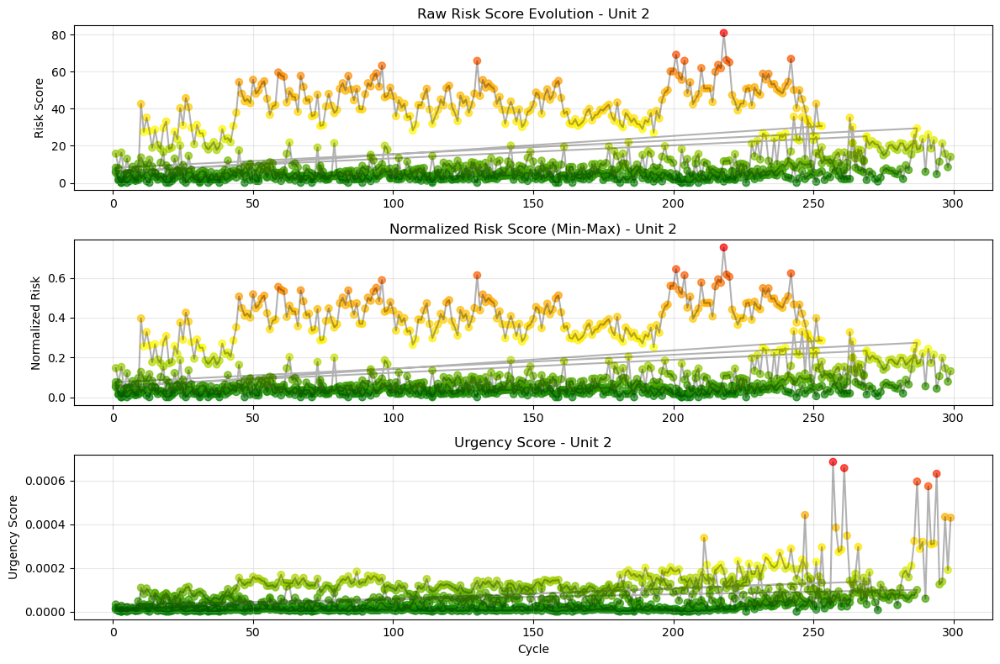

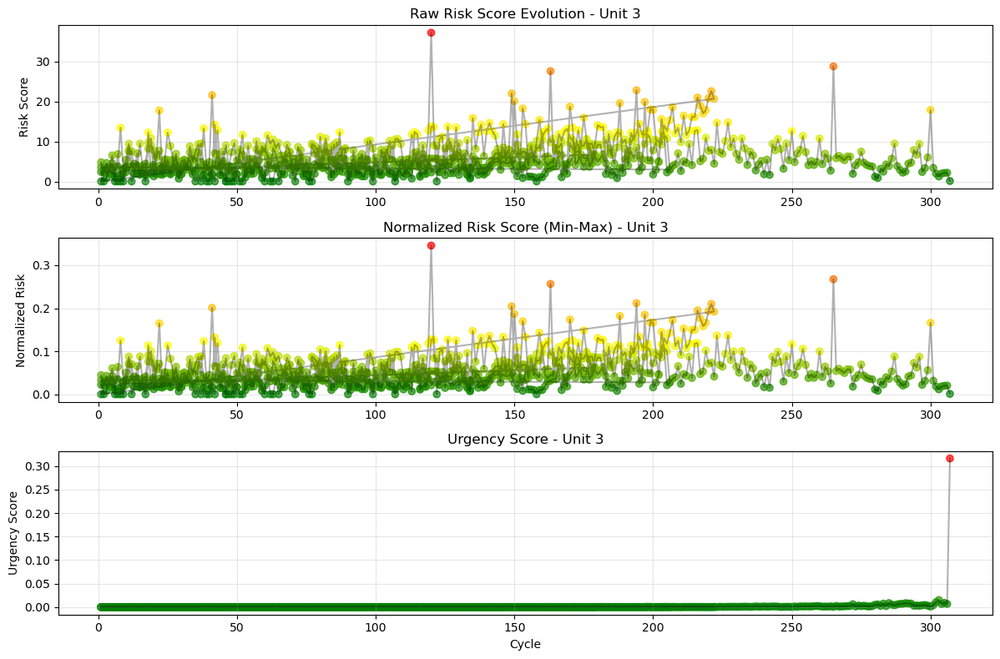

Generating unit-cycle risk heatmap...


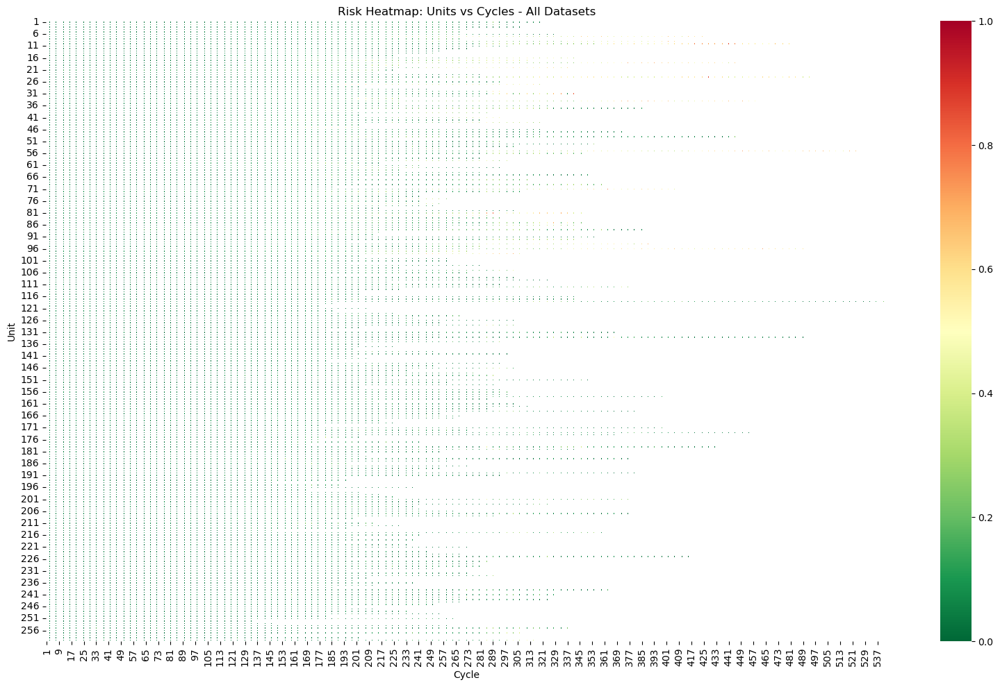


Risk Score Statistics:
  Raw Risk - Mean: 7.71, Median: 4.88, Max: 107.57
  Normalized Risk - Mean: 0.0717, Median: 0.0454
  Urgency Score - Mean: 0.0002, Median: 0.0000

Maintenance Alert Visualization for All Datasets


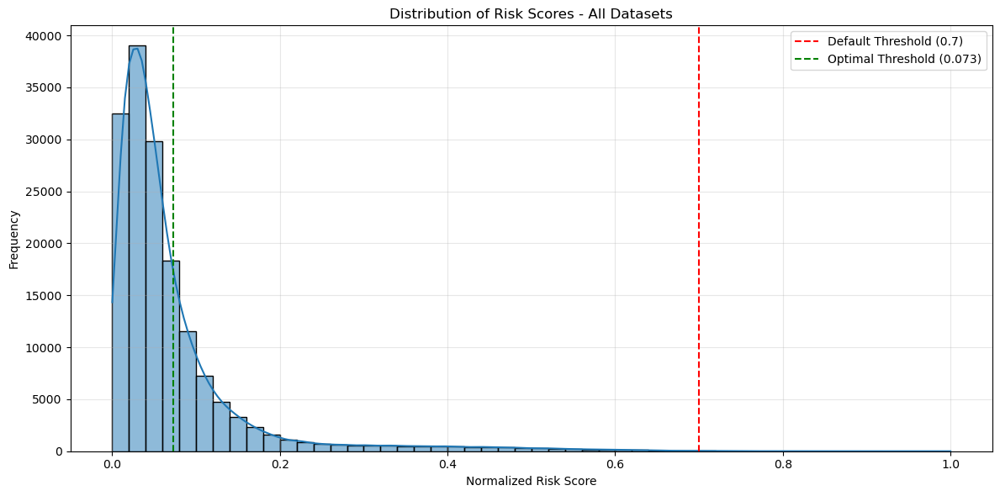

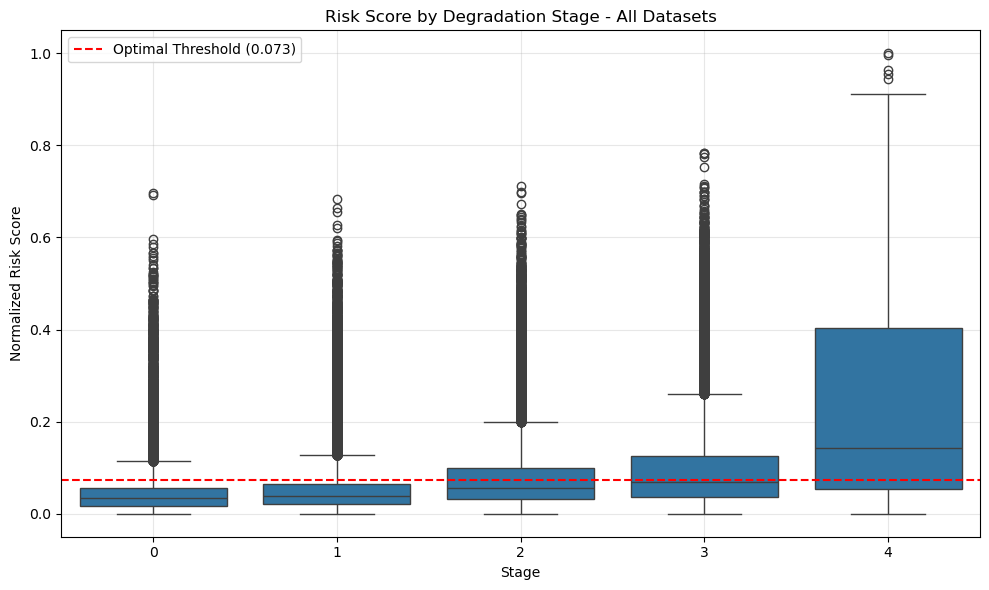

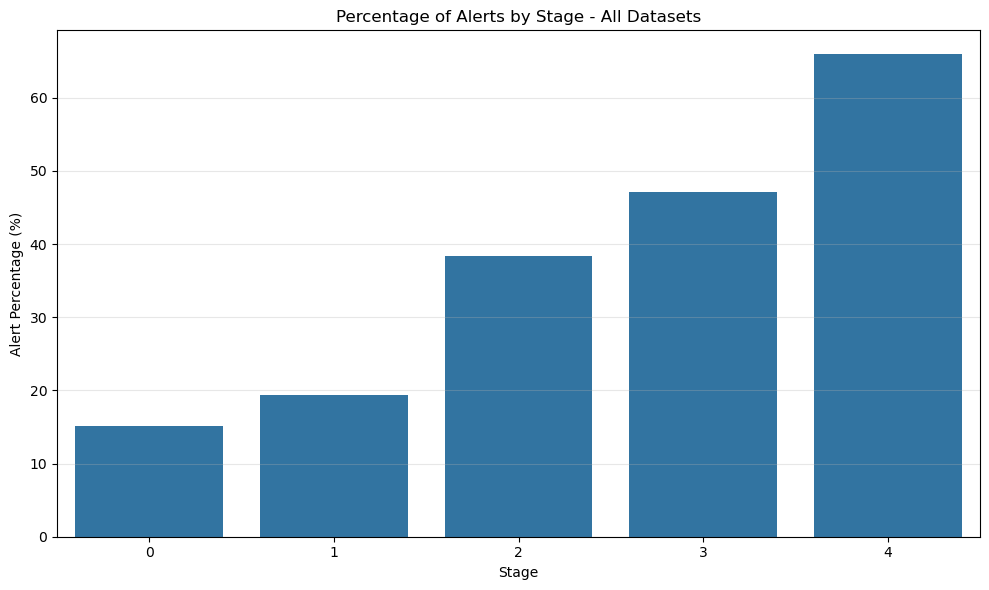

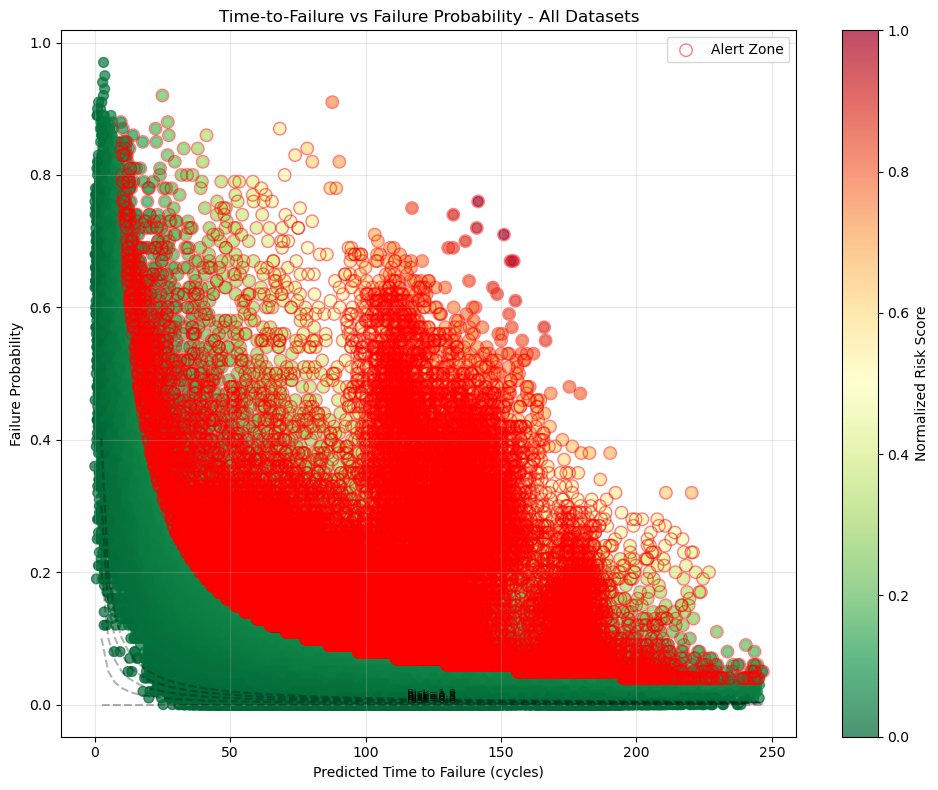

In [31]:
# Initialize dictionary for phase 4 results
phase4_results = {}

# Dataset 1
# Use the best models from Phase 2 and Phase 3
classifier_1 = results_1[best_model_1]['model']
regressor_1 = results_reg_1[best_reg_model_1]['model']
is_xgboost_1 = best_model_1 == 'XGBoost'

risk_results_1 = run_phase4_risk_assessment(
    'Dataset 1',
    df1_cluster_T,
    cluster_mappings['Dataset 1'],
    classifier_1,
    regressor_1,
    is_xgboost=is_xgboost_1
)
phase4_results['Dataset 1'] = risk_results_1
visualize_maintenance_alerts(risk_results_1, 'Dataset 1')

# Dataset 1 & 3
classifier_13 = results_13[best_model_13]['model']
regressor_13 = results_reg_13[best_reg_model_13]['model']
is_xgboost_13 = best_model_13 == 'XGBoost'

risk_results_13 = run_phase4_risk_assessment(
    'Dataset 1 & 3',
    df13_cluster_T,
    cluster_mappings['Dataset 1 & 3'],
    classifier_13,
    regressor_13,
    is_xgboost=is_xgboost_13
)
phase4_results['Dataset 1 & 3'] = risk_results_13
visualize_maintenance_alerts(risk_results_13, 'Dataset 1 & 3')

# Dataset 2 & 4
classifier_24 = results_24[best_model_24]['model']
regressor_24 = results_reg_24[best_reg_model_24]['model']
is_xgboost_24 = best_model_24 == 'XGBoost'

risk_results_24 = run_phase4_risk_assessment(
    'Dataset 2 & 4',
    df24_cluster_T,
    cluster_mappings['Dataset 2 & 4'],
    classifier_24,
    regressor_24,
    is_xgboost=is_xgboost_24
)
phase4_results['Dataset 2 & 4'] = risk_results_24
visualize_maintenance_alerts(risk_results_24, 'Dataset 2 & 4')

# All Datasets
classifier_all = results_all[best_model_all]['model']
regressor_all = results_reg_all[best_reg_model_all]['model']
is_xgboost_all = best_model_all == 'XGBoost'

risk_results_all = run_phase4_risk_assessment(
    'All Datasets',
    df_all_cluster_T,
    cluster_mappings['All Datasets'],
    classifier_all,
    regressor_all,
    is_xgboost=is_xgboost_all
)
phase4_results['All Datasets'] = risk_results_all
visualize_maintenance_alerts(risk_results_all, 'All Datasets')

In [33]:
# Final summary table for Phase 4
print("\n" + "="*100)
print(f"{'PHASE 4 SUMMARY: RISK ASSESSMENT ACROSS DATASETS':^100}")
print("="*100)
print(f"{'Dataset':<15} {'Optimal Threshold':<20} {'Alert Rate (%)':<15} {'Mean Risk':<15} {'Precision-Recall AUC':<20}")
print("-"*100)

for dataset_name, results in phase4_results.items():
    risk_df = results['risk_df']
    opt_threshold = results['optimal_threshold']
    alert_rate = (results['optimized_alerts'] / len(risk_df)) * 100
    mean_risk = risk_df['normalized_risk'].mean()
    pr_auc = auc(results['recalls'], results['precisions'])

    print(f"{dataset_name:<15} {opt_threshold:<20.4f} {alert_rate:<15.2f} {mean_risk:<15.4f} {pr_auc:<20.4f}")

print("="*100)


                          PHASE 4 SUMMARY: RISK ASSESSMENT ACROSS DATASETS                          
Dataset         Optimal Threshold    Alert Rate (%)  Mean Risk       Precision-Recall AUC
----------------------------------------------------------------------------------------------------
Dataset 1       0.0011               17.43           0.0295          0.5088              
Dataset 1 & 3   0.0001               6.30            0.0067          0.4346              
Dataset 2 & 4   0.0509               27.34           0.0436          0.5116              
All Datasets    0.0725               28.92           0.0717          0.4095              


Using device: cuda

Processing dataset: df1
DataFrame shape: (20631, 20)
First few column names: [0, 1, 2, 3, 6]
Using column 'cluster' as target

----- Data Quality Check -----
Train class distribution: [4093 4000 1085 4000 3326]
Test class distribution: [1024 1000  271 1000  832]
Train class imbalance ratio (max/min): 3.77
Low variance features (var < 0.01): 0 out of 19
No exact duplicates found between train and test sets
Baseline (stratified) accuracy: 0.2239
Quick RandomForest accuracy: 0.8793
Dataset info:
- Samples: 14028 train, 2476 validation, 4127 test
- Features: 19
- Classes: 5

Training LSTM Classifier...
Epoch 5/30, Train Loss: 0.0796, Train Acc: 0.9760, Val Loss: 0.0781, Val Acc: 0.9758
Epoch 10/30, Train Loss: 0.0480, Train Acc: 0.9840, Val Loss: 0.0505, Val Acc: 0.9746
Epoch 15/30, Train Loss: 0.0348, Train Acc: 0.9879, Val Loss: 0.0371, Val Acc: 0.9859
Epoch 20/30, Train Loss: 0.0327, Train Acc: 0.9879, Val Loss: 0.0563, Val Acc: 0.9750
Epoch 25/30, Train Loss: 0.0285

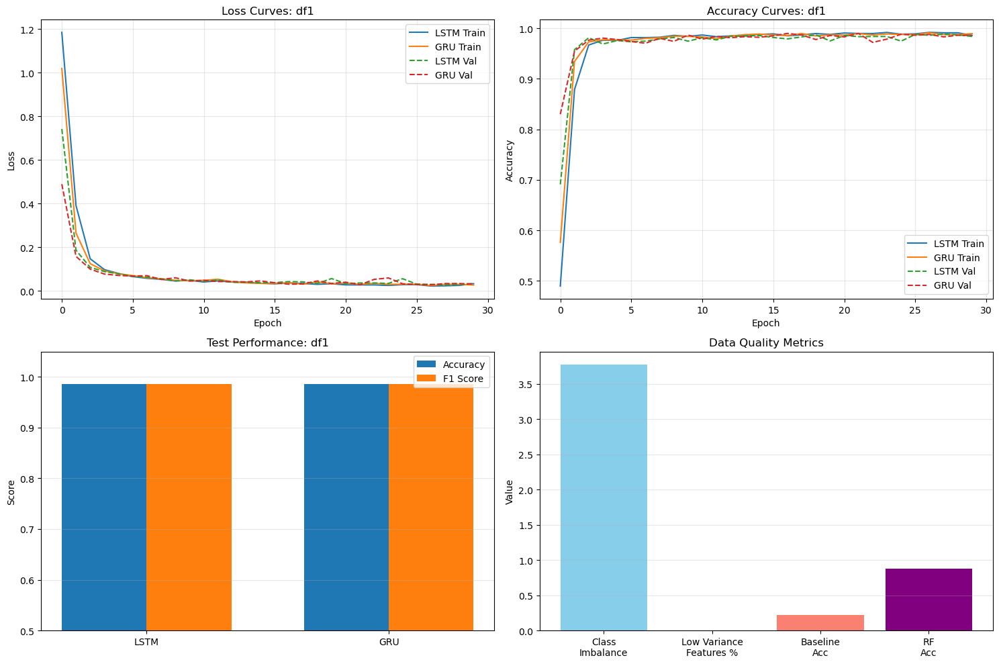

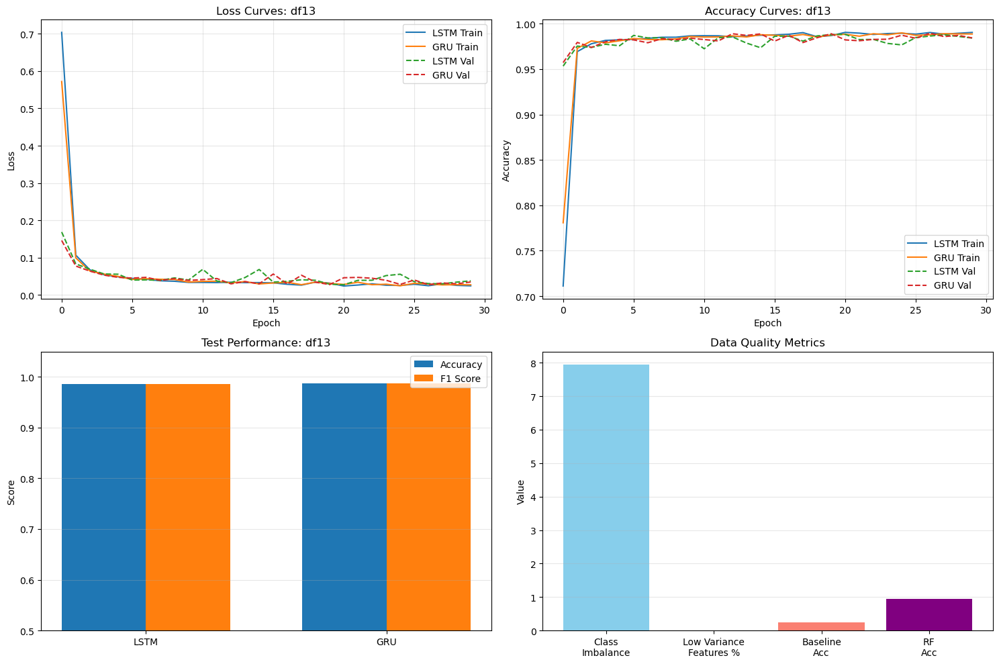

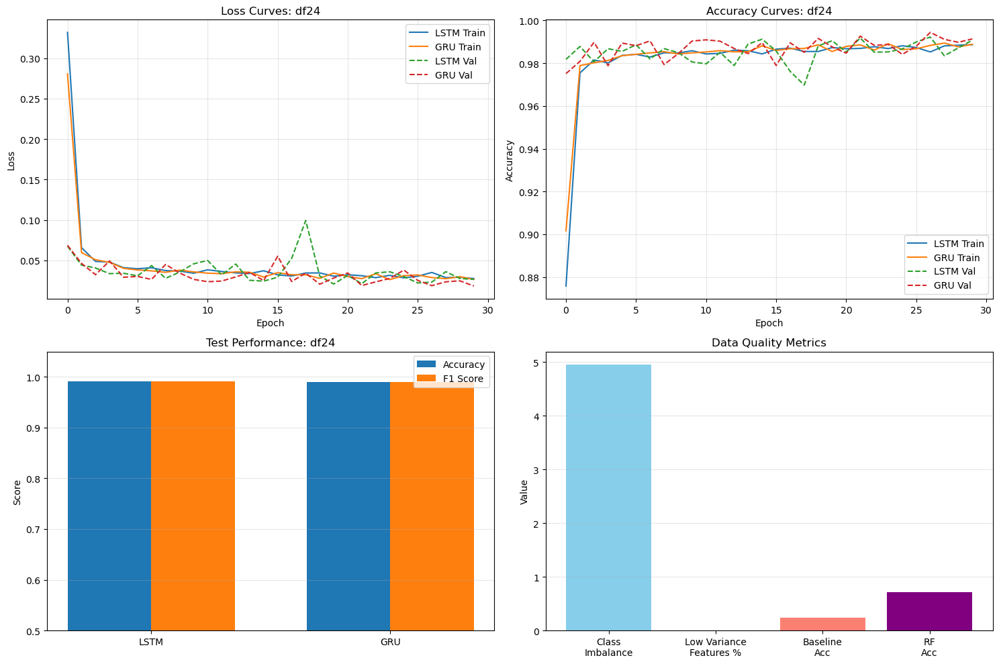

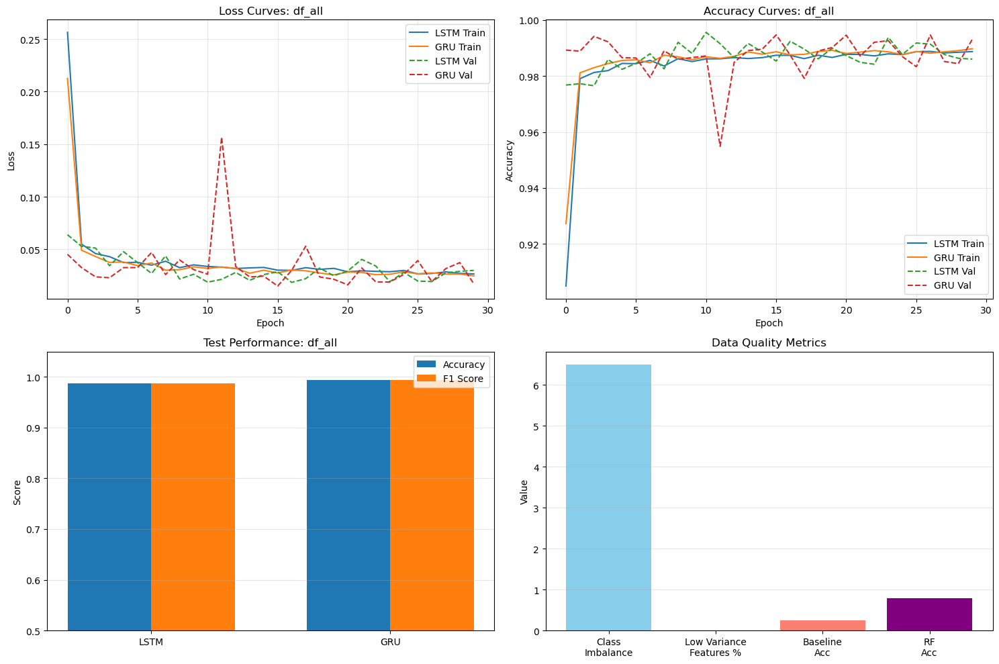

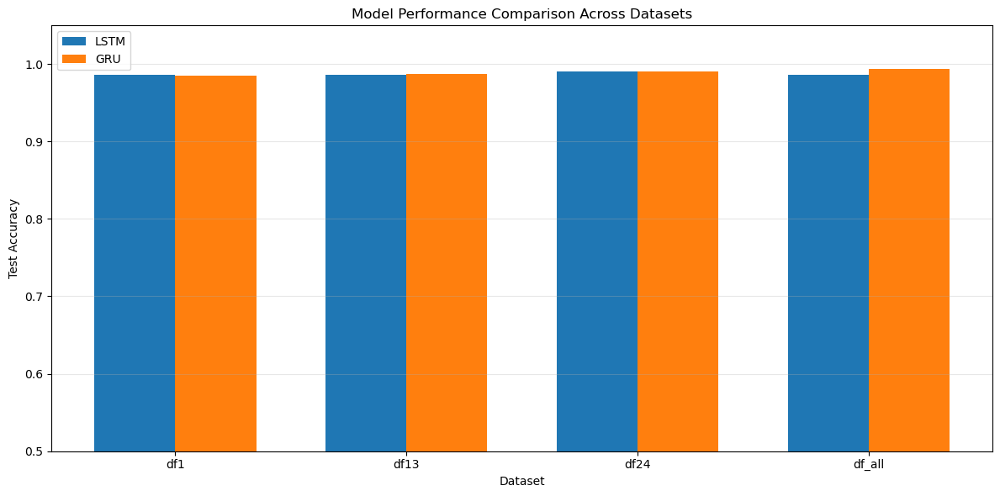

In [42]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score, classification_report

# Dictionary to store all datasets for easy iteration
datasets = {
    "df1": df1_cluster_T,
    "df13": df13_cluster_T,
    "df24": df24_cluster_T,
    "df_all": df_all_cluster_T
}

# ---- Hyperparameters ----
BATCH_SIZE = 128
EPOCHS = 30
LR = 1e-3
TEST_SIZE = 0.2
RANDOM_STATE = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# ---- LSTM Model ----
class LSTMClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, num_classes):
        super().__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, num_classes)
        
    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]  # Take last time step
        out = self.fc(out)
        return out

# ---- GRU Model ----
class GRUClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, num_classes):
        super().__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, num_classes)
        
    def forward(self, x):
        out, _ = self.gru(x)
        out = out[:, -1, :]
        out = self.fc(out)
        return out

# ---- Data Preparation Function ----
def prepare_data(df):
    """
    Extract features and target from dataframe and preprocess
    """
    # Handle different potential dataframe structures
    # Try to intelligently identify the target column
    
    # Check if any column has "label", "target", "class" in its name
    target_col = None
    for col in df.columns:
        if any(keyword in str(col).lower() for keyword in ["label", "target", "class", "cluster"]):
            target_col = col
            break
    
    # If no target column identified, assume it's the last column
    if target_col is None:
        print("No obvious target column found. Assuming last column is the target.")
        X = df.iloc[:, :-1].values
        y = df.iloc[:, -1].values
    else:
        print(f"Using column '{target_col}' as target")
        X = df.drop(columns=[target_col]).values
        y = df[target_col].values
    
    # Ensure y contains integer class labels
    if not np.issubdtype(y.dtype, np.integer):
        print(f"Converting non-integer labels of type {y.dtype} to integer labels")
        from sklearn.preprocessing import LabelEncoder
        le = LabelEncoder()
        y = le.fit_transform(y)
        print(f"Mapped classes: {dict(zip(le.classes_, range(len(le.classes_))))}")
    
    # Check for NaN values
    if np.isnan(X).any():
        print(f"WARNING: Found {np.isnan(X).sum()} NaN values in features. Imputing with mean.")
        from sklearn.impute import SimpleImputer
        imputer = SimpleImputer(strategy='mean')
        X = imputer.fit_transform(X)
    
    # Scale features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    
    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE, stratify=y
    )
    
    return X_train, X_test, y_train, y_test

# ---- Prepare Data for PyTorch ----
def to_tensor_dataset(X, y):
    X_tensor = torch.tensor(X, dtype=torch.float32)
    y_tensor = torch.tensor(y, dtype=torch.long)
    # Reshape to (batch, seq_len, features) -- treating each sample as a sequence of length 1
    X_tensor = X_tensor.unsqueeze(1)
    return TensorDataset(X_tensor, y_tensor)

# ---- Data Quality Check Function ----
def check_data_quality(X_train, X_test, y_train, y_test):
    """Check for potential issues in the dataset that might lead to unrealistically high accuracy"""
    print("\n----- Data Quality Check -----")
    
    # Check class distribution
    train_class_counts = np.bincount(y_train)
    test_class_counts = np.bincount(y_test)
    
    print(f"Train class distribution: {train_class_counts}")
    print(f"Test class distribution: {test_class_counts}")
    
    # Calculate class imbalance
    train_class_ratio = train_class_counts.max() / train_class_counts.min()
    print(f"Train class imbalance ratio (max/min): {train_class_ratio:.2f}")
    
    # Check feature variance
    feature_vars = np.var(X_train, axis=0)
    low_var_features = np.sum(feature_vars < 0.01)
    print(f"Low variance features (var < 0.01): {low_var_features} out of {X_train.shape[1]}")
    
    # Check for potential data leakage
    # Simple check: Are there exact duplicates between train and test?
    potential_leakage = 0
    for i in range(min(len(X_test), 1000)):  # Check first 1000 test samples at most
        if np.any(np.all(X_train == X_test[i], axis=1)):
            potential_leakage += 1
    
    if potential_leakage > 0:
        print(f"WARNING: Found {potential_leakage} exact duplicates between train and test!")
    else:
        print("No exact duplicates found between train and test sets")
        
    # Data separation assessment - more sophisticated than just looking for duplicates
    # Train a simple model to see if it already gets high accuracy
    from sklearn.dummy import DummyClassifier
    dummy = DummyClassifier(strategy='stratified').fit(X_train, y_train)
    dummy_score = dummy.score(X_test, y_test)
    print(f"Baseline (stratified) accuracy: {dummy_score:.4f}")
    
    # Calculate feature importance with a simple model
    from sklearn.ensemble import RandomForestClassifier
    rf = RandomForestClassifier(n_estimators=10, max_depth=5, random_state=42)
    rf.fit(X_train, y_train)
    rf_score = rf.score(X_test, y_test)
    print(f"Quick RandomForest accuracy: {rf_score:.4f}")
    
    if rf_score > 0.95:
        print("WARNING: Simple RandomForest achieves >95% accuracy. Problem might be too easy or have data leakage.")
    
    return {
        "class_imbalance": train_class_ratio,
        "low_var_features": low_var_features,
        "potential_leakage": potential_leakage > 0,
        "baseline_acc": dummy_score,
        "rf_acc": rf_score
    }

# ---- Training & Evaluation Function ----
def train_model(model, train_loader, test_loader, val_loader=None, epochs=EPOCHS):
    model = model.to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # Lists to track metrics
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        epoch_loss = 0
        epoch_correct = 0
        epoch_total = 0
        
        for xb, yb in train_loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            optimizer.zero_grad()
            out = model(xb)
            loss = criterion(out, yb)
            loss.backward()
            optimizer.step()
            
            # Calculate training accuracy
            preds = torch.argmax(out, dim=1)
            epoch_correct += (preds == yb).sum().item()
            epoch_total += yb.size(0)
            epoch_loss += loss.item()
        
        avg_loss = epoch_loss / len(train_loader)
        avg_acc = epoch_correct / epoch_total
        train_losses.append(avg_loss)
        train_accs.append(avg_acc)
        
        # Validation phase (if validation loader provided)
        if val_loader:
            model.eval()
            val_loss = 0
            val_correct = 0
            val_total = 0
            
            with torch.no_grad():
                for xb, yb in val_loader:
                    xb, yb = xb.to(DEVICE), yb.to(DEVICE)
                    out = model(xb)
                    loss = criterion(out, yb)
                    
                    preds = torch.argmax(out, dim=1)
                    val_correct += (preds == yb).sum().item()
                    val_total += yb.size(0)
                    val_loss += loss.item()
            
            avg_val_loss = val_loss / len(val_loader)
            avg_val_acc = val_correct / val_total
            val_losses.append(avg_val_loss)
            val_accs.append(avg_val_acc)
            
            if (epoch + 1) % 5 == 0:
                print(f"Epoch {epoch+1}/{epochs}, Train Loss: {avg_loss:.4f}, Train Acc: {avg_acc:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {avg_val_acc:.4f}")
        else:
            if (epoch + 1) % 5 == 0:
                print(f"Epoch {epoch+1}/{epochs}, Train Loss: {avg_loss:.4f}, Train Acc: {avg_acc:.4f}")
    
    # Final Evaluation on test set
    model.eval()
    all_preds, all_targets = [], []
    test_loss = 0
    
    with torch.no_grad():
        for xb, yb in test_loader:
            xb = xb.to(DEVICE)
            out = model(xb)
            preds = torch.argmax(out, dim=1).cpu().numpy()
            all_preds.append(preds)
            all_targets.append(yb.numpy())
            
            # Calculate test loss
            yb = yb.to(DEVICE)
            loss = criterion(out, yb)
            test_loss += loss.item()
    
    avg_test_loss = test_loss / len(test_loader)
    y_pred = np.concatenate(all_preds)
    y_true = np.concatenate(all_targets)
    
    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average='weighted')
    
    print(f"Test Loss: {avg_test_loss:.4f}, Test Accuracy: {acc:.4f}, F1: {f1:.4f}")
    print(classification_report(y_true, y_pred))
    
    # Return additional metrics for plotting
    metrics = {
        "train_losses": train_losses,
        "train_accs": train_accs,
        "val_losses": val_losses if val_loader else None,
        "val_accs": val_accs if val_loader else None,
        "test_loss": avg_test_loss,
        "test_acc": acc,
        "test_f1": f1
    }
    
    return model, acc, f1, metrics

# ---- Process each dataset ----
results = {}

for dataset_name, df in datasets.items():
    print(f"\n{'='*50}")
    print(f"Processing dataset: {dataset_name}")
    print(f"{'='*50}")
    
    # Examine dataset structure
    print(f"DataFrame shape: {df.shape}")
    print(f"First few column names: {list(df.columns[:5])}")
    
    # Prepare data 
    X_train, X_test, y_train, y_test = prepare_data(df)
    
    # Perform data quality checks
    quality_report = check_data_quality(X_train, X_test, y_train, y_test)
    
    # Create validation split from training data
    X_train, X_val, y_train, y_val = train_test_split(
        X_train, y_train, test_size=0.15, random_state=RANDOM_STATE+1, stratify=y_train
    )
    
    # Convert to PyTorch datasets
    train_ds = to_tensor_dataset(X_train, y_train)
    val_ds = to_tensor_dataset(X_val, y_val)
    test_ds = to_tensor_dataset(X_test, y_test)
    
    # Create data loaders
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE)
    test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE)
    
    # Get dimensions and classes
    input_dim = X_train.shape[1]
    hidden_dim = 128
    num_layers = 2
    num_classes = len(np.unique(y_train))
    
    print(f"Dataset info:")
    print(f"- Samples: {len(X_train)} train, {len(X_val)} validation, {len(X_test)} test")
    print(f"- Features: {input_dim}")
    print(f"- Classes: {num_classes}")
    
    # ---- Train LSTM model ----
    print("\nTraining LSTM Classifier...")
    lstm_model = LSTMClassifier(input_dim, hidden_dim, num_layers, num_classes)
    lstm_model, lstm_acc, lstm_f1, lstm_metrics = train_model(
        lstm_model, train_loader, test_loader, val_loader
    )
    
    # ---- Train GRU model ----
    print("\nTraining GRU Classifier...")
    gru_model = GRUClassifier(input_dim, hidden_dim, num_layers, num_classes)
    gru_model, gru_acc, gru_f1, gru_metrics = train_model(
        gru_model, train_loader, test_loader, val_loader
    )
    
    # Store results
    results[dataset_name] = {
        "quality_report": quality_report,
        "lstm": {
            "accuracy": lstm_acc, 
            "f1": lstm_f1, 
            "metrics": lstm_metrics
        },
        "gru": {
            "accuracy": gru_acc, 
            "f1": gru_f1, 
            "metrics": gru_metrics
        }
    }

# ---- Compare Results ----
print("\n\n" + "="*70)
print("RESULTS COMPARISON")
print("="*70)
print(f"{'Dataset':<10} | {'Model':<6} | {'Accuracy':<10} | {'F1 Score':<10}")
print("-"*70)

for dataset_name, results_dict in results.items():
    for model_name, metrics in results_dict.items():
        # Skip non-model entries like "quality_report"
        if model_name in ['lstm', 'gru']:
            print(f"{dataset_name:<10} | {model_name:<6} | {metrics['accuracy']:.6f} | {metrics['f1']:.6f}")

# Visualize results
try:
    import matplotlib.pyplot as plt
    
    # Plot training/validation metrics for each dataset
    for dataset_name, results_dict in results.items():
        plt.figure(figsize=(15, 10))
        
        # Plot losses
        plt.subplot(2, 2, 1)
        plt.plot(results_dict['lstm']['metrics']['train_losses'], label='LSTM Train')
        plt.plot(results_dict['gru']['metrics']['train_losses'], label='GRU Train')
        if results_dict['lstm']['metrics']['val_losses']:
            plt.plot(results_dict['lstm']['metrics']['val_losses'], label='LSTM Val', linestyle='--')
            plt.plot(results_dict['gru']['metrics']['val_losses'], label='GRU Val', linestyle='--')
        plt.title(f'Loss Curves: {dataset_name}')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Plot accuracies
        plt.subplot(2, 2, 2)
        plt.plot(results_dict['lstm']['metrics']['train_accs'], label='LSTM Train')
        plt.plot(results_dict['gru']['metrics']['train_accs'], label='GRU Train')
        if results_dict['lstm']['metrics']['val_accs']:
            plt.plot(results_dict['lstm']['metrics']['val_accs'], label='LSTM Val', linestyle='--')
            plt.plot(results_dict['gru']['metrics']['val_accs'], label='GRU Val', linestyle='--')
        plt.title(f'Accuracy Curves: {dataset_name}')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Plot final test metrics
        plt.subplot(2, 2, 3)
        models = ['LSTM', 'GRU']
        test_accs = [results_dict['lstm']['accuracy'], results_dict['gru']['accuracy']]
        test_f1s = [results_dict['lstm']['f1'], results_dict['gru']['f1']]
        
        x = np.arange(len(models))
        width = 0.35
        
        plt.bar(x - width/2, test_accs, width, label='Accuracy')
        plt.bar(x + width/2, test_f1s, width, label='F1 Score')
        plt.xticks(x, models)
        plt.ylim(0.5, 1.05)  # Start from 0.5 to better visualize high scores
        plt.title(f'Test Performance: {dataset_name}')
        plt.ylabel('Score')
        plt.legend()
        plt.grid(True, axis='y', alpha=0.3)
        
        # Plot data quality report
        plt.subplot(2, 2, 4)
        quality = results_dict['quality_report']
        metrics = ['Class\nImbalance', 'Low Variance\nFeatures %', 'Baseline\nAcc', 'RF\nAcc']
        values = [
            quality['class_imbalance'],
            quality['low_var_features'] / X_train.shape[1] * 100,  # Convert to percentage
            quality['baseline_acc'],
            quality['rf_acc']
        ]
        
        plt.bar(metrics, values, color=['skyblue', 'lightgreen', 'salmon', 'purple'])
        plt.title('Data Quality Metrics')
        plt.ylabel('Value')
        if quality['potential_leakage']:
            plt.figtext(0.65, 0.25, "WARNING: Potential data leakage detected!", 
                      fontsize=10, color='red', bbox=dict(facecolor='yellow', alpha=0.5))
        plt.grid(True, axis='y', alpha=0.3)
        
        plt.tight_layout()
        plt.savefig(f'{dataset_name}_performance_analysis.png')
    
    # Create summary comparison across datasets
    plt.figure(figsize=(12, 6))
    
    # Prepare data for grouped bar chart
    dataset_names = list(results.keys())
    lstm_accs = [results[ds]['lstm']['accuracy'] for ds in dataset_names]
    gru_accs = [results[ds]['gru']['accuracy'] for ds in dataset_names]
    
    x = np.arange(len(dataset_names))
    width = 0.35
    
    plt.bar(x - width/2, lstm_accs, width, label='LSTM')
    plt.bar(x + width/2, gru_accs, width, label='GRU')
    
    plt.xlabel('Dataset')
    plt.ylabel('Test Accuracy')
    plt.title('Model Performance Comparison Across Datasets')
    plt.xticks(x, dataset_names)
    plt.ylim(0.5, 1.05)  # Start from 0.5 to better see differences
    plt.legend()
    plt.grid(True, axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('datasets_comparison.png')
    
except ImportError:
    print("Matplotlib not available for plotting. Install with 'pip install matplotlib'")